# White Noise

- 잔차들은 정규분포이고, (unbiased) 평균 0과 일정한 분산을 가져야 함
- 잔차들이 시간의 흐름에 따라 상관성이 없어야 함

## Gaussian WN

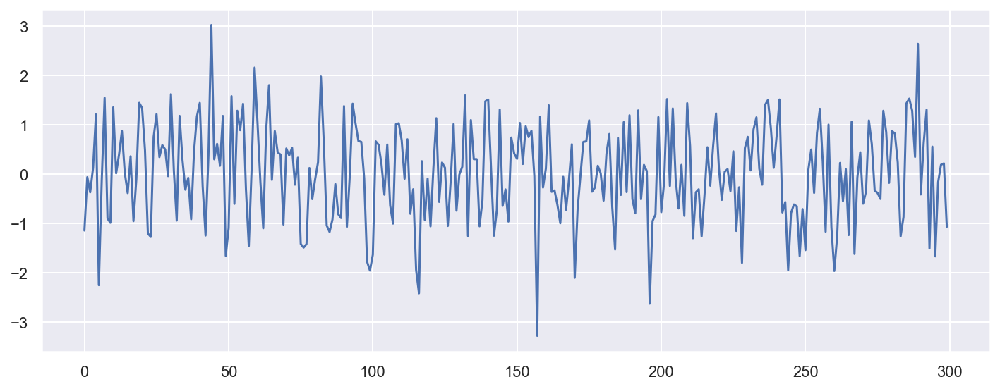

In [1]:
plt.figure(figsize=(10,4))
plt.plot(sp.stats.norm.rvs(size=300))
plt.tight_layout()
plt.show()

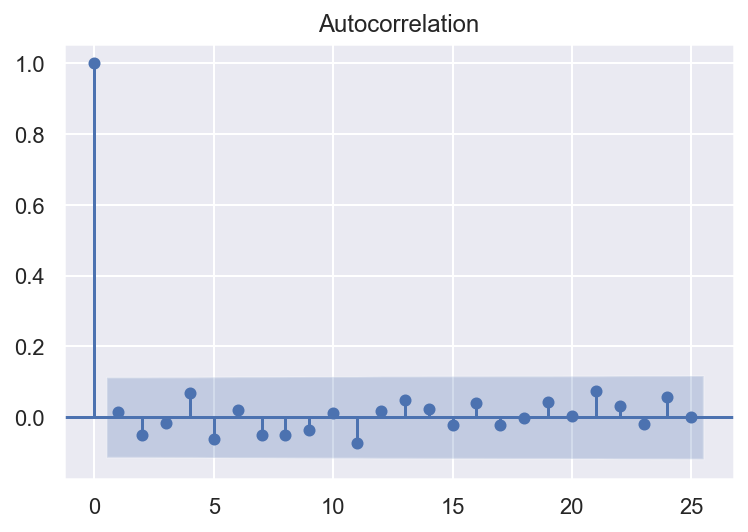

In [2]:
sm.tsa.graphics.plot_acf(sp.stats.norm.rvs(size=300))
plt.show()

## Bernoulli WN

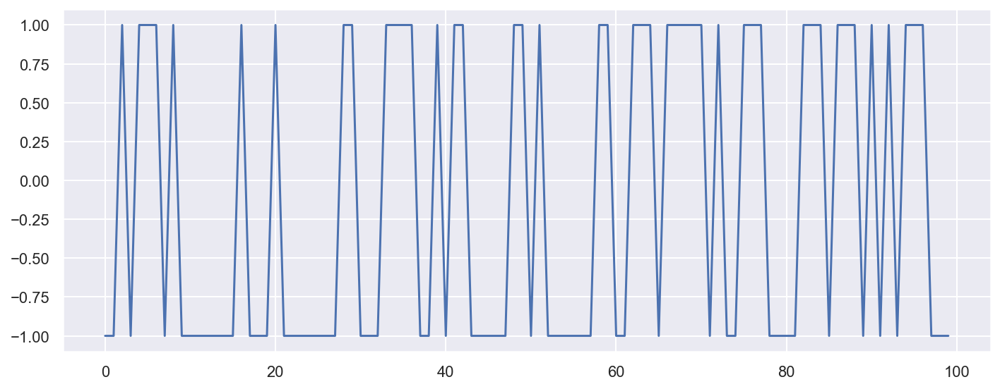

In [3]:
plt.figure(figsize=(10,4))
samples = sp.stats.bernoulli.rvs(0.5, size=100) *2 - 1
plt.plot(np.arange(len(samples)), samples)
plt.tight_layout()
plt.show()

# MA

- **"$MA(q)$: 알고리즘의 차수($q$)가 유한한 가우시안 백색잡음과정의 선형조합"**

\begin{align*}
Y_t &= \epsilon_t + \theta_1\epsilon_{t-1} + \theta_2\epsilon_{t-2} + \cdots + \theta_q\epsilon_{t-q} 
\end{align*}
\begin{align*}
where~\epsilon_i \sim i.i.d.~WN(0, \sigma_{\epsilon_i}^2)~and~\displaystyle \sum_{i=1}^{\infty}\theta_i^2 < \infty
\end{align*}
\begin{align*}
Y_t &= \epsilon_t + \theta_1\epsilon_{t-1} + \theta_2\epsilon_{t-2} + \cdots + \theta_q\epsilon_{t-q} \\
&= \epsilon_t + \theta_1L\epsilon_t + \theta_2L^2\epsilon_t + \cdots + \theta_qL^q\epsilon_t \\ 
&= (1 + \theta_1L + \theta_2L^2 + \cdots + \theta_qL^q)\epsilon_t \\
&= \theta(L)\epsilon_t \\
\end{align*}
\begin{align*}
where~\epsilon_{t-1} = L\epsilon_t~and~\epsilon_{t-2} = L^2\epsilon_t$
\end{align*}

- **MA(q):**  
\begin{align*}
\text{Autocorrelation} && Corr(Y_t, Y_{t-i}) = \rho_i &= 
\begin{cases} 
\dfrac{\theta_i + \theta_1\theta_{i-1}  + \theta_2\theta_{i-2} + \cdots + \theta_q\theta_{i-q}}{1 + \theta_1^2 + \cdots  + \theta_q^2} & \text{ for } i= 1, 2, \cdots, q \\ 
0 & \text{ for } i > q \\ 
\end{cases}
\end{align*}

## MA(1)

In [4]:
np.random.seed(123)
ar_params = np.array([])
ma_params = np.array([0.9])

$\epsilon_t$의 weight에 대해 1이 존재

$Y_t=\epsilon_t+0.9\epsilon_{t-1}$

In [5]:
np.r_[1, -ar_params]

array([1.])

In [6]:
np.r_[1, ma_params]

array([1. , 0.9])

In [7]:
ar, ma = np.r_[1, ar_params], np.r_[1, ma_params]
ar, ma

(array([1.]), array([1. , 0.9]))

- 별도의 AR, MA  클래스는 없고 ARMA로 진행함

In [9]:
arma = sm.tsa.ArmaProcess(ar, ma)
arma

ArmaProcess([1.0], [1.0, 0.9], nobs=100) at 0x1fe34e9a070

- burnin : int
    Number of observation at the beginning of the sample to drop.
    Used to reduce dependence on initial values.

In [10]:
arma.generate_sample(nsample=500, burnin=50)[:20]

array([ 0.72024368, -2.203465  ,  0.80880284,  0.77127827, -0.68857323,
        1.09603088,  1.85309076,  2.55652193,  3.0750417 ,  2.41547239,
        0.18974469,  0.09942482,  1.0296484 , -1.04342066,  0.22366013,
        2.08280568,  0.77200296, -0.19215099, -1.408084  , -0.87894696])

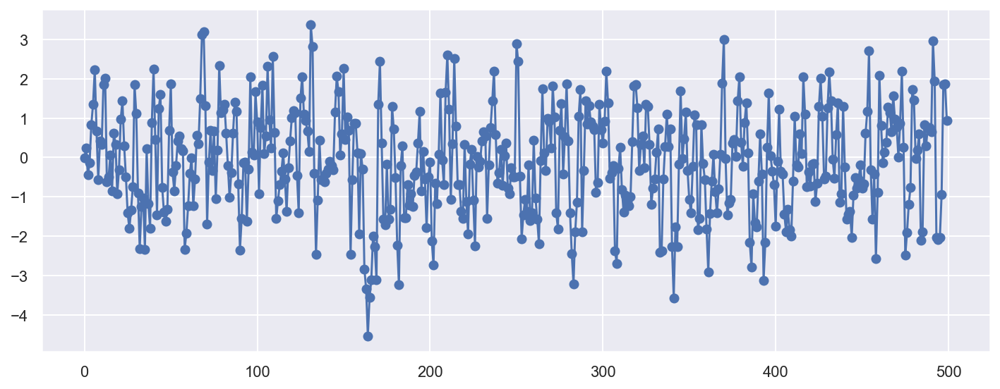

In [11]:
y = arma.generate_sample(nsample=500, burnin=50)
plt.figure(figsize=(10,4))
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

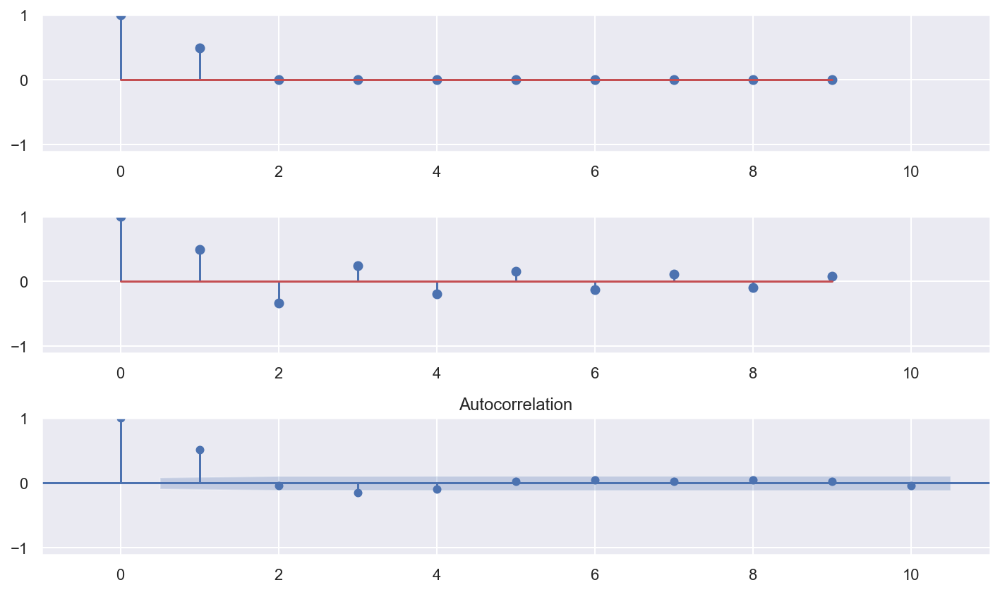

In [12]:
plt.figure(figsize=(10,6))
plt.subplot(311)
plt.stem(arma.acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.)

plt.subplot(312)
plt.stem(arma.pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.)


sm.graphics.tsa.plot_acf(arma.generate_sample(nsample=500, burnin=50), lags=10, ax=plt.subplot(313))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.)
plt.tight_layout()
plt.show()

## MA(2)

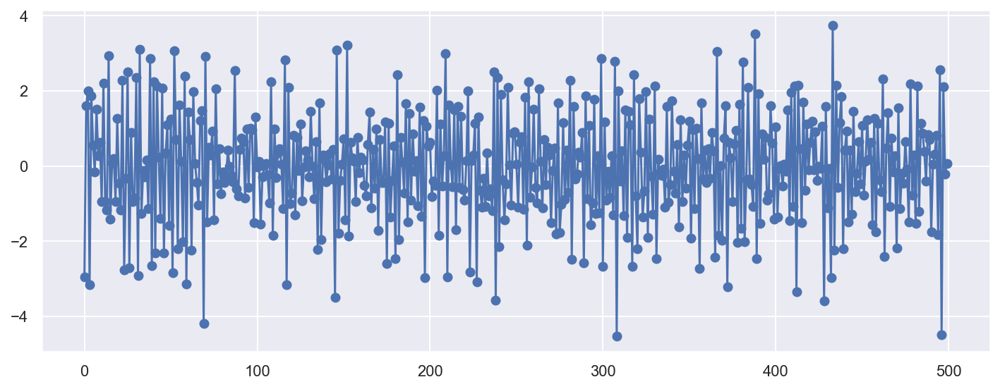

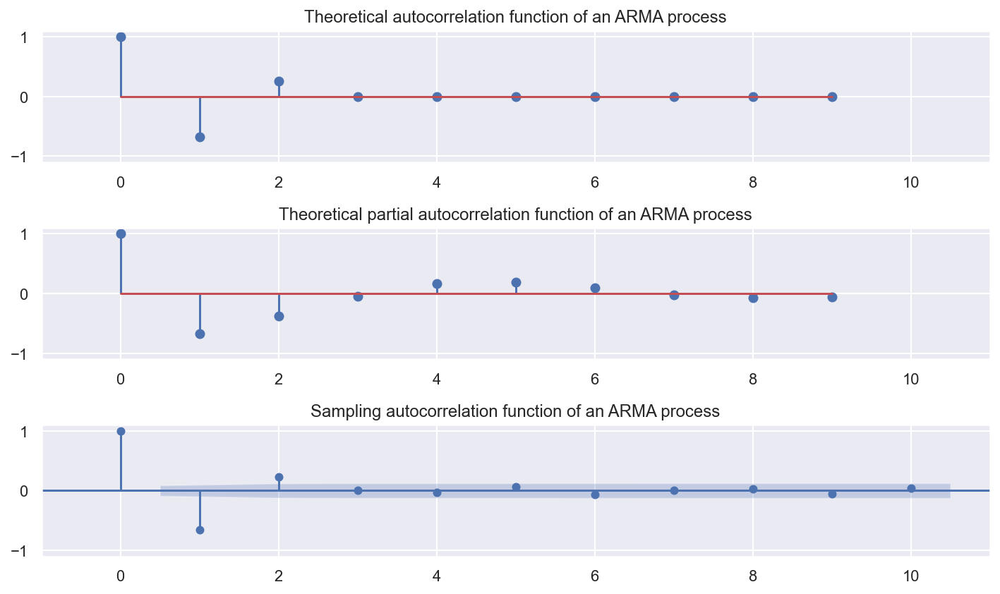

In [13]:
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([])
ma_params = np.array([-1, 0.6])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.subplot(311)
plt.stem(sm.tsa.ArmaProcess(ar,ma).acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical autocorrelation function of an ARMA process")

plt.subplot(312)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical partial autocorrelation function of an ARMA process")

sm.graphics.tsa.plot_acf(y, lags=10, ax=plt.subplot(313))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

## MA(5)

$Y_t=\epsilon_t+-1\epsilon_{t-1}+1.6\epsilon_{t-2}+0.9\epsilon_{t-3}+-1.5\epsilon_{t-4}+0.7\epsilon_{t-5}$

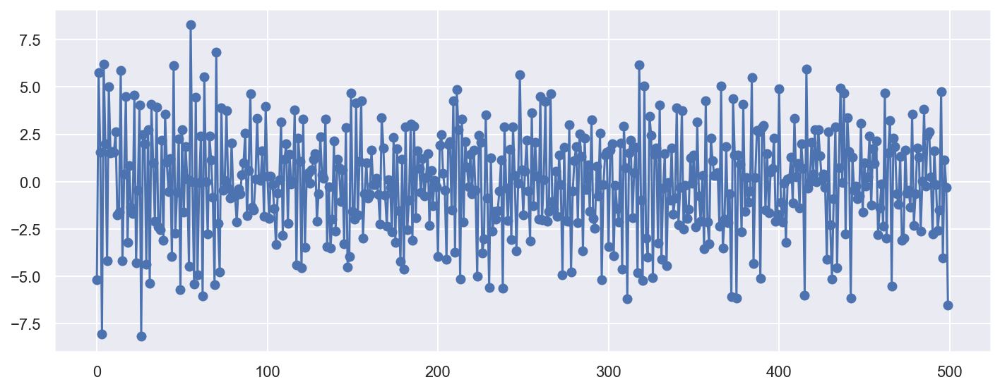

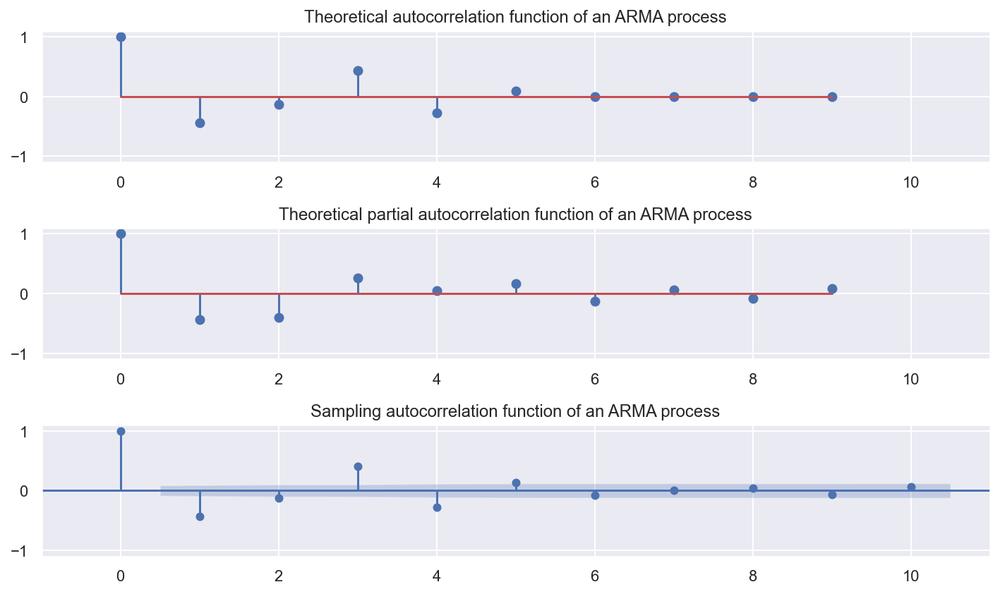

In [14]:
### MA(5)
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([])
ma_params = np.array([-1, 1.6, 0.9, -1.5, 0.7])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.subplot(311)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical autocorrelation function of an ARMA process")

plt.subplot(312)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical partial autocorrelation function of an ARMA process")

sm.graphics.tsa.plot_acf(y, lags=10, ax=plt.subplot(313))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

# AR

\begin{align*}
Y_t &= \phi_1Y_{t-1} + \phi_2Y_{t-2} + \cdots + \phi_pY_{t-p} + \epsilon_t \\
\end{align*}
\begin{align*}
where~\epsilon_i \sim i.i.d.~WN(0, \sigma_{\epsilon_i}^2)~and~\displaystyle \sum_{i=1}^{\infty}\phi_i^2 < \infty
\end{align*}
\begin{align*}
Y_t &= \phi_1Y_{t-1} + \phi_2Y_{t-2} + \cdots + \phi_pY_{t-p} + \epsilon_t \\
Y_t - \phi_1Y_{t-1} - \phi_2Y_{t-2} - \cdots - \phi_pY_{t-p} &= \epsilon_t \\
Y_t - \phi_1LY_t - \phi_2L^2Y_t - \cdots - \phi_pL^pY_t &= \epsilon_t \\
(1 - \phi_1L - \phi_2L^2 - \cdots - \phi_pL^p)Y_t &= \epsilon_t \\
\phi(L)Y_t &= \epsilon_t \\
\end{align*}
\begin{align*}
where~Y_{t-1} = LY_t~and~Y_{t-2} = L^2Y_t
\end{align*}

## AR(1)

$Y_t=0.9Y_{t-1}+\epsilon_t$   .... (1)
 
$Y_t-0.9Y_{t-1}=\epsilon_t$   .... (2)

- -ar_params : minus  term을 붙이는 이유는 이 알고리즘 만드신 분께서 (2)번의 equation을 염두에 두셨기 때문이다.

In [15]:
np.random.seed(311)
ar_params = np.array([0.9])
ma_params = np.array([])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
ar, ma

(array([ 1. , -0.9]), array([1.]))

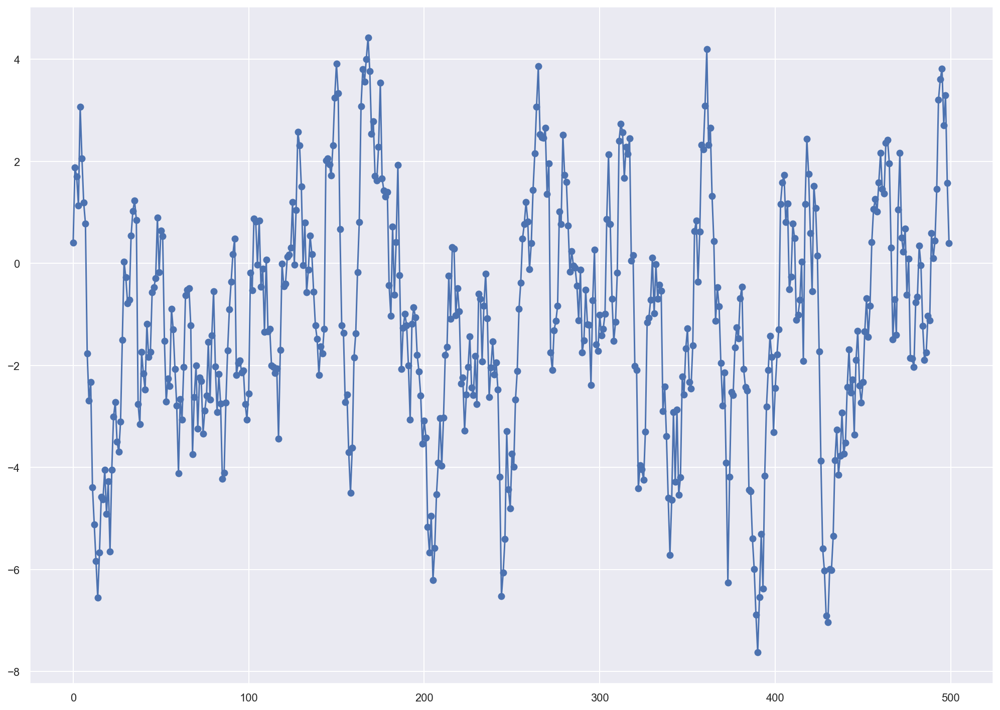

In [16]:
arma = sm.tsa.ArmaProcess(ar, ma)
y = arma.generate_sample(nsample=500, burnin=50)
plt.figure(figsize=(14,10))
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

In [17]:
from module_hobin import stationarity_adf_test
from module_hobin import stationarity_kpss_test

display(stationarity_adf_test(y, []))
display(stationarity_kpss_test(y, []))

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-6.21
p-value,0.00
Used Lag,3.00
Used Observations,496.00
Critical Value(1%),-3.44
Maximum Information Criteria,"1,411.54"


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.07
p-value,0.10
Used Lag,18.00
Critical Value(10%),0.35


- 1번째 lag -> 0.9 (위 식에서 설정한 parameter)
- 이 뒤부터는 $0.9^p$ 관계

In [18]:
sm.tsa.ArmaProcess(ar,ma).acf(lags=10)

array([1.        , 0.9       , 0.81      , 0.729     , 0.6561    ,
       0.59049   , 0.531441  , 0.4782969 , 0.43046721, 0.38742049])

Text(0.5, 1.0, 'Theoretical autocorrelation function of an ARMA process')

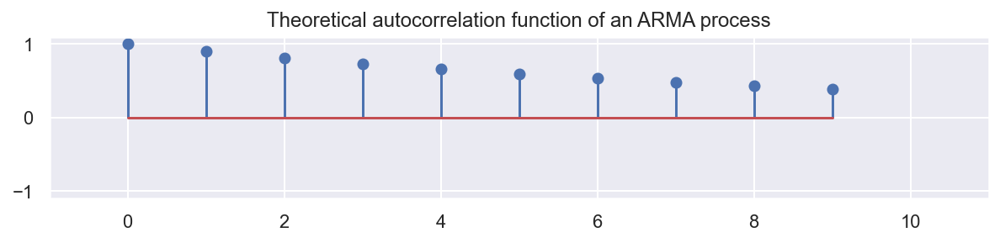

In [19]:
plt.figure(figsize=(10, 6))
plt.subplot(311)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical autocorrelation function of an ARMA process")

In [20]:
arma.pacf(lags=10)

array([ 1.00000000e+00,  9.00000000e-01,  0.00000000e+00, -5.84327908e-16,
        1.11022302e-15, -1.11022302e-15,  5.25895117e-16,  3.50316520e-30,
       -2.92163954e-16,  5.55111512e-16])

- AR모형은 pacf를 통해서 파라미터 추정

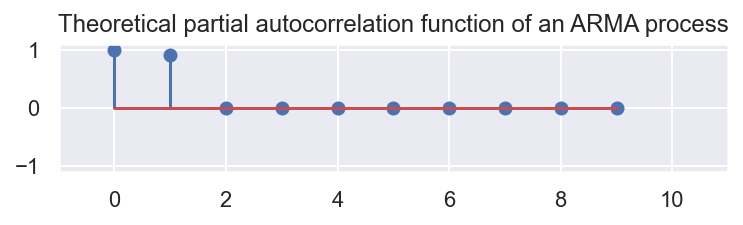

In [21]:
plt.subplot(312)
plt.stem(arma.pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical partial autocorrelation function of an ARMA process")
plt.show()

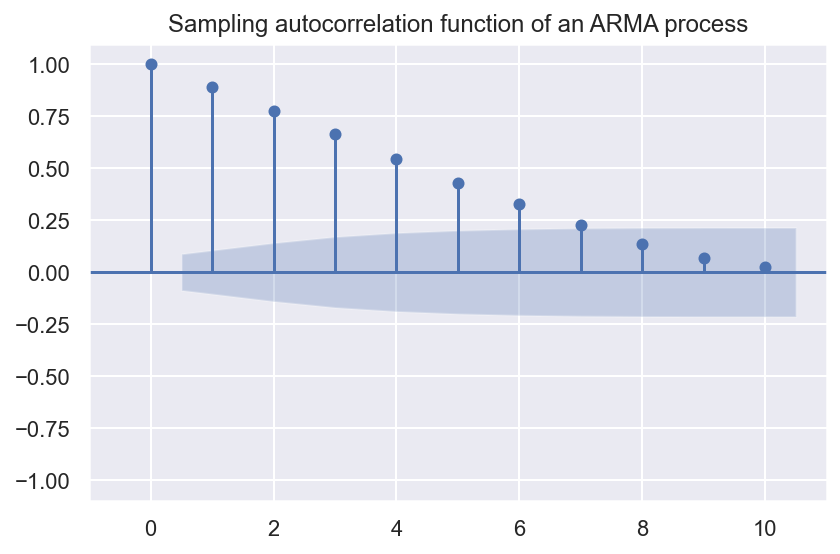

In [22]:
sm.graphics.tsa.plot_acf(y, lags=10)
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

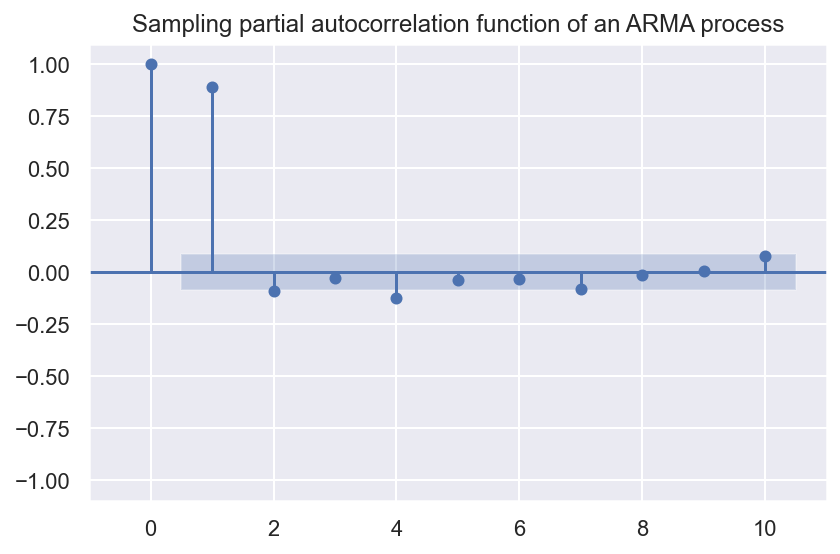

In [24]:
sm.tsa.graphics.plot_pacf(y, lags=10)
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling partial autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

### AR(1), parameter = -0.9

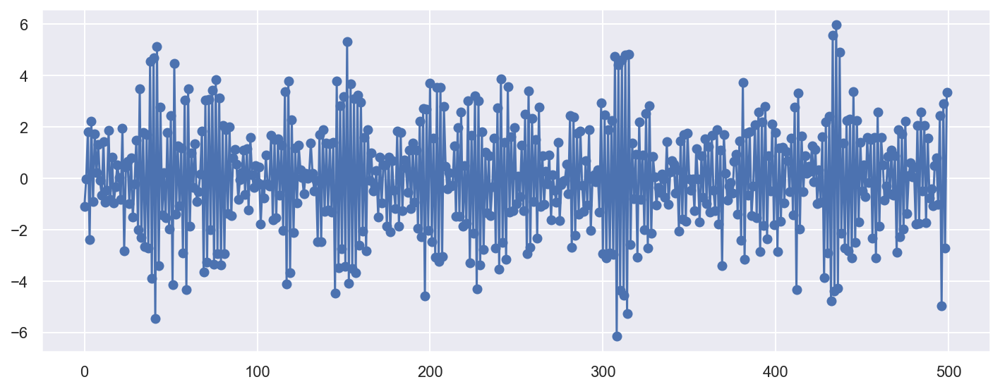

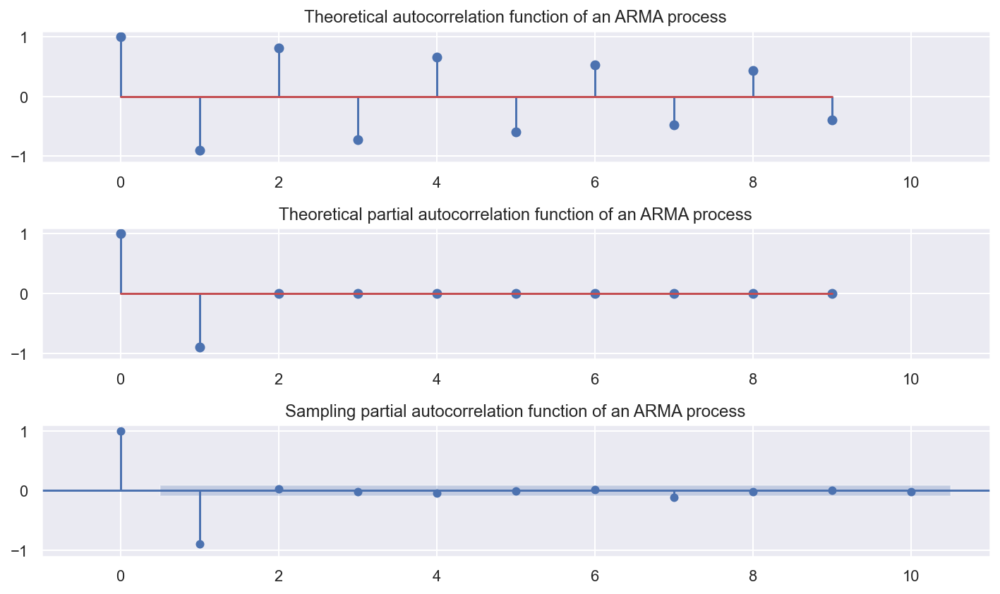

In [25]:
### AR(1)
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([-0.9])
ma_params = np.array([])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.subplot(311)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical autocorrelation function of an ARMA process")

plt.subplot(312)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical partial autocorrelation function of an ARMA process")

sm.graphics.tsa.plot_pacf(y, lags=10, ax=plt.subplot(313))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling partial autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

## AR(2)

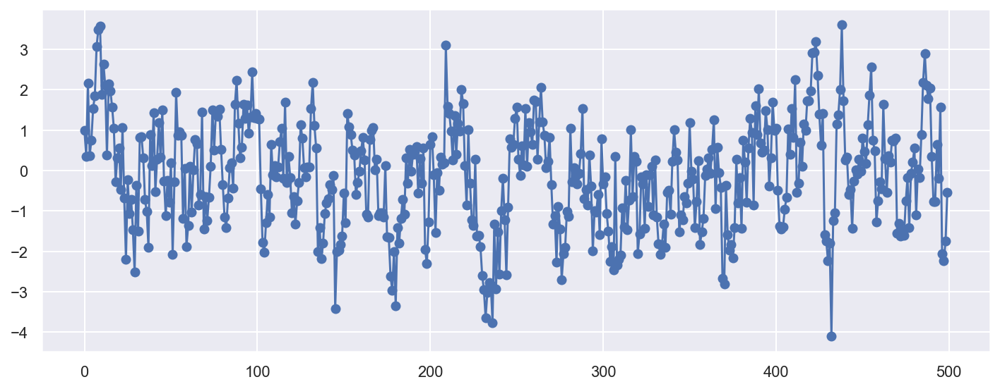

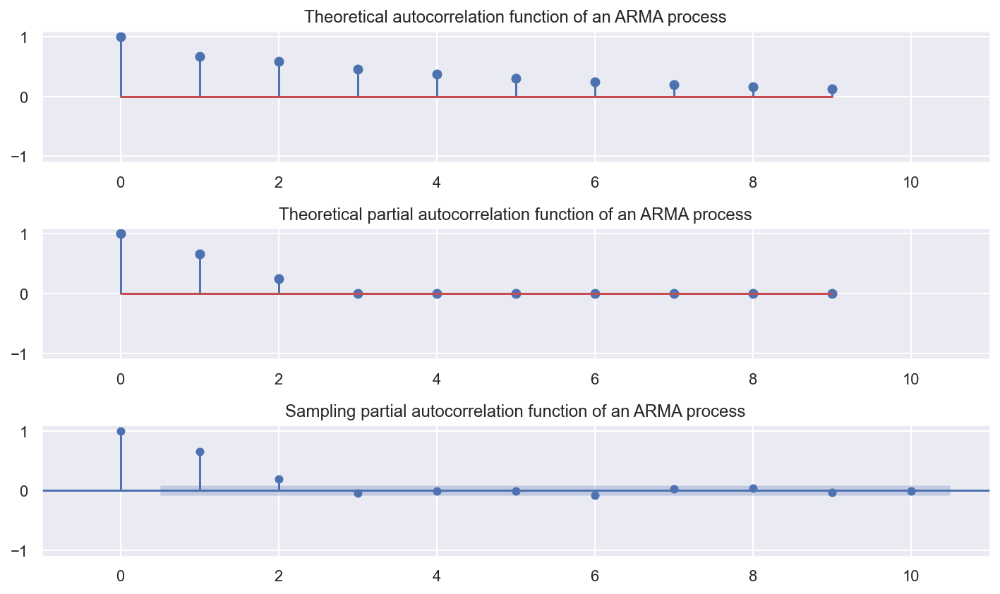

In [45]:
### AR(2)
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([0.5, 0.25])
ma_params = np.array([])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.subplot(311)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical autocorrelation function of an ARMA process")

plt.subplot(312)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical partial autocorrelation function of an ARMA process")

sm.graphics.tsa.plot_pacf(y, lags=10, ax=plt.subplot(313))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling partial autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

### AR(2)  음수 파라미터

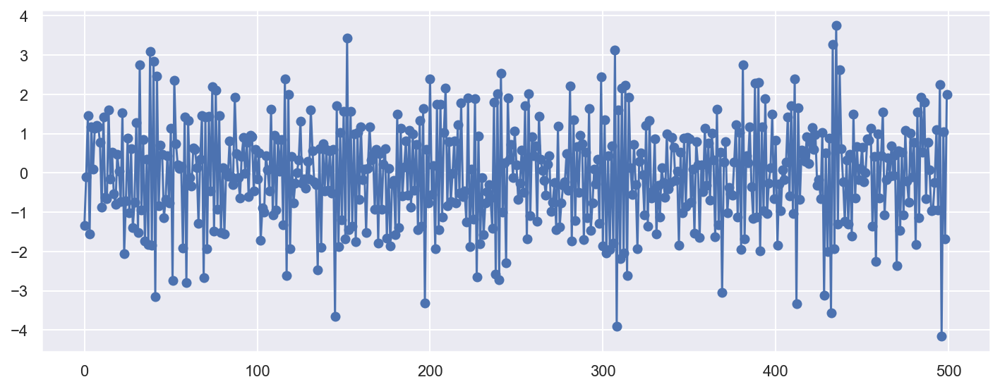

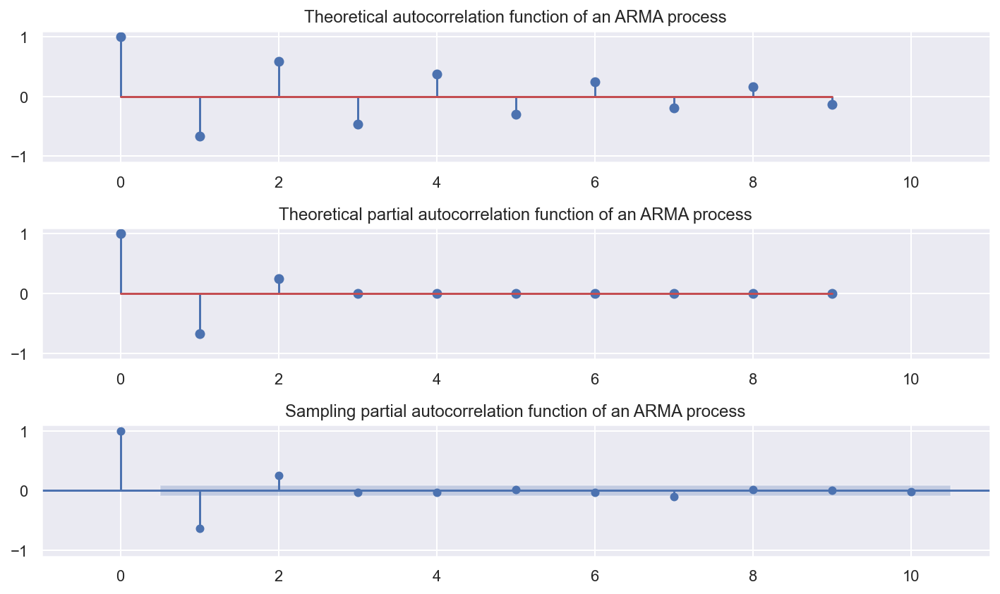

In [26]:
### AR(2)
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([-0.5, 0.25])
ma_params = np.array([])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.subplot(311)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical autocorrelation function of an ARMA process")

plt.subplot(312)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical partial autocorrelation function of an ARMA process")

sm.graphics.tsa.plot_pacf(y, lags=10, ax=plt.subplot(313))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling partial autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

## AR(5)

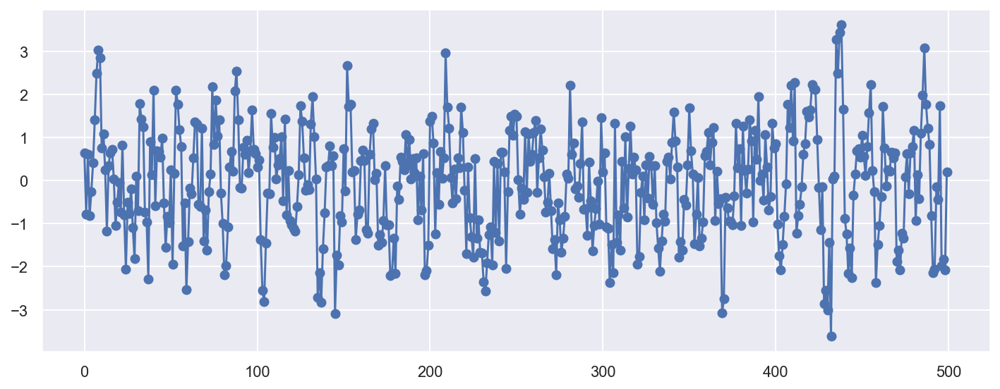

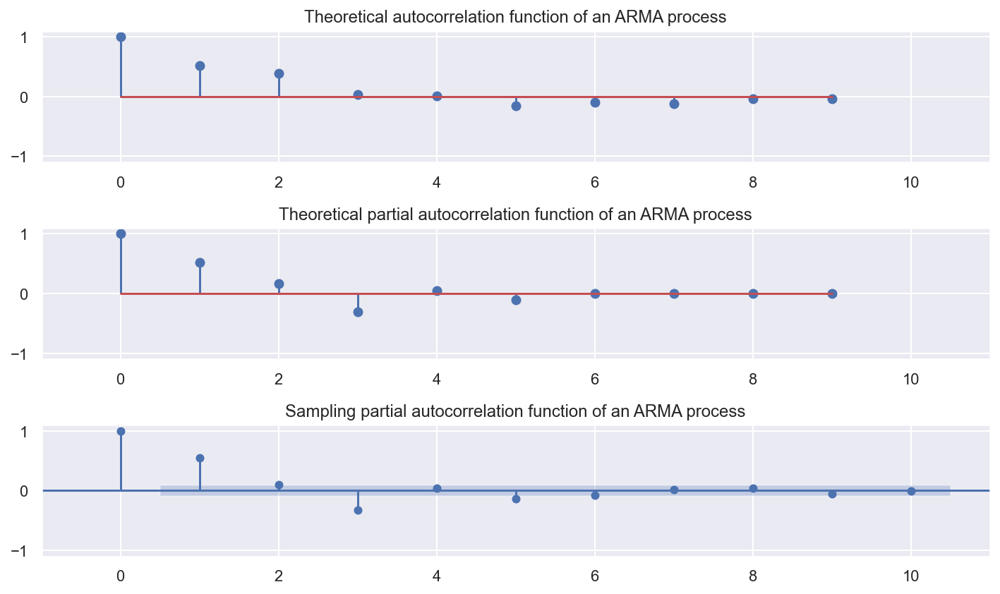

In [41]:
### AR(5)
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([0.5, 0.25, -0.3, 0.1, -0.1])
ma_params = np.array([])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.subplot(311)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical autocorrelation function of an ARMA process")

plt.subplot(312)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=10))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical partial autocorrelation function of an ARMA process")

sm.graphics.tsa.plot_pacf(y, lags=10, ax=plt.subplot(313))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("Sampling partial autocorrelation function of an ARMA process")
plt.tight_layout()
plt.show()

# ARMA

## ARMA(1,0) = AR(1)

In [27]:
### ARMA(1,0) = AR(1)
# Setting
np.random.seed(123)
ar_params = np.array([0.75])
ma_params = np.array([])

ahead = 100
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
ar_order, ma_order = len(ar)-1, len(ma)-1
(ar, ar_order), (ma, ma_order)

((array([ 1.  , -0.75]), 1), (array([1.]), 0))

- trend = 'c' or 'nc'
    - 'c' : constant 포함 (default)

In [28]:
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(nsample=1000, burnin=500)
fit = sm.tsa.ARMA(y, (ar_order, ma_order)).fit()
pred_ts_point, _,  pred_ts_interval= fit.forecast(steps=ahead) 

In [29]:
[i for i in range(pd.DataFrame(y).index.max()+1, pd.DataFrame(y).index.max()+ahead+1)]

[1000,
 1001,
 1002,
 1003,
 1004,
 1005,
 1006,
 1007,
 1008,
 1009,
 1010,
 1011,
 1012,
 1013,
 1014,
 1015,
 1016,
 1017,
 1018,
 1019,
 1020,
 1021,
 1022,
 1023,
 1024,
 1025,
 1026,
 1027,
 1028,
 1029,
 1030,
 1031,
 1032,
 1033,
 1034,
 1035,
 1036,
 1037,
 1038,
 1039,
 1040,
 1041,
 1042,
 1043,
 1044,
 1045,
 1046,
 1047,
 1048,
 1049,
 1050,
 1051,
 1052,
 1053,
 1054,
 1055,
 1056,
 1057,
 1058,
 1059,
 1060,
 1061,
 1062,
 1063,
 1064,
 1065,
 1066,
 1067,
 1068,
 1069,
 1070,
 1071,
 1072,
 1073,
 1074,
 1075,
 1076,
 1077,
 1078,
 1079,
 1080,
 1081,
 1082,
 1083,
 1084,
 1085,
 1086,
 1087,
 1088,
 1089,
 1090,
 1091,
 1092,
 1093,
 1094,
 1095,
 1096,
 1097,
 1098,
 1099]

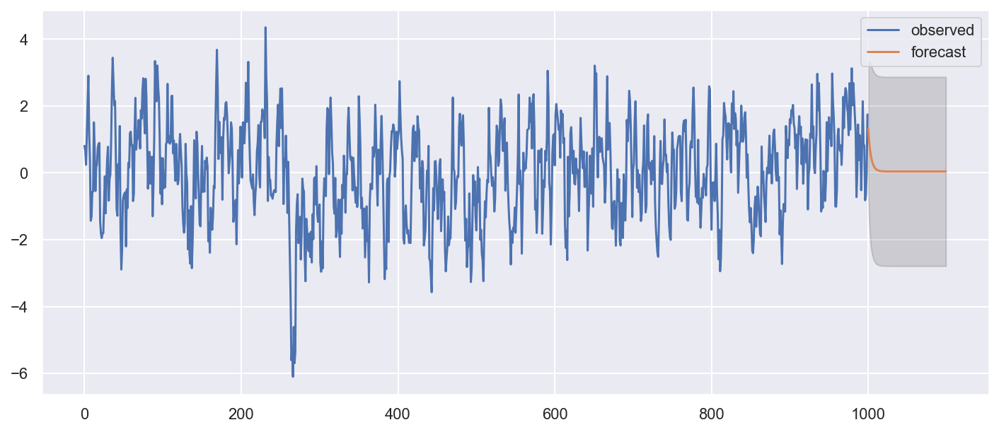

In [30]:
ax = pd.DataFrame(y).plot(figsize=(12,5))
forecast_index = [i for i in range(pd.DataFrame(y).index.max()+1, pd.DataFrame(y).index.max()+ahead+1)]
pd.DataFrame(pred_ts_point, index=forecast_index).plot(label='forecast', ax=ax)
ax.fill_between(pd.DataFrame(pred_ts_interval, index=forecast_index).index,
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,0],
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,1], color='k', alpha=0.15)
plt.legend(['observed', 'forecast'])

In [31]:
fit.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:              ARMA             BIC:                 2775.2536
Dependent Variable: y                Log-Likelihood:      -1377.3  
Date:               2021-06-23 16:58 Scale:               1.0000   
No. Observations:   1000             Method:              css-mle  
Df Model:           2                Sample:              0        
Df Residuals:       998                                   0        
Converged:          1.0000           S.D. of innovations: 0.959    
No. Iterations:     5.0000           HQIC:                2766.126 
AIC:                2760.5304                                      
---------------------------------------------------------------------
              Coef.    Std.Err.      t      P>|t|     [0.025   0.975]
---------------------------------------------------------------------
const         0.0406     0.1197    0.3389   0.7347   -0.1940   0.2752
ar.L1.y       0.7475     0.0210   35.6193   0.0000    0.7063   0.7886
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
AR.1           1.3379             0.0000           1.3379             0.0000
===================================================================

"""

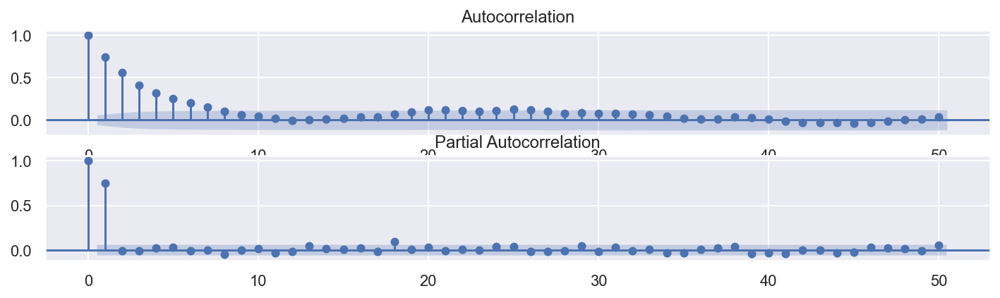

In [32]:
plt.figure(figsize=(12,3))
sm.graphics.tsa.plot_acf(y, lags=50, zero=True, use_vlines=True, ax=plt.subplot(211))
sm.graphics.tsa.plot_pacf(y, lags=50, zero=True, use_vlines=True, ax=plt.subplot(212))
plt.show()

## ARMA(4,0) = AR(4)

<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:              ARMA             BIC:                 2796.4388
Dependent Variable: y                Log-Likelihood:      -1377.5  
Date:               2021-06-23 16:58 Scale:               1.0000   
No. Observations:   1000             Method:              css-mle  
Df Model:           5                Sample:              0        
Df Residuals:       995                                   0        
Converged:          1.0000           S.D. of innovations: 0.958    
No. Iterations:     12.0000          HQIC:                2778.184 
AIC:                2766.9923                                      
---------------------------------------------------------------------
            Coef.    Std.Err.      t       P>|t|     [0.025    0.975]
---------------------------------------------------------------------
const       0.0093     0.0374     0.2500   0.8026   -0.0639    0.0826
ar.L1.y     0.7470     0.0279    26.7627   0.0000    0.6923    0.8017
ar.L2.y    -0.2521     0.0362    -6.9600   0.0000   -0.3231   -0.1811
ar.L3.y     0.1631     0.0362     4.4995   0.0000    0.0920    0.2341
ar.L4.y    -0.4699     0.0279   -16.8256   0.0000   -0.5247   -0.4152
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
AR.1           0.8756            -0.6261           1.0764            -0.0988
AR.2           0.8756             0.6261           1.0764             0.0988
AR.3          -0.7021            -1.1592           1.3553            -0.3367
AR.4          -0.7021             1.1592           1.3553             0.3367
===================================================================

"""

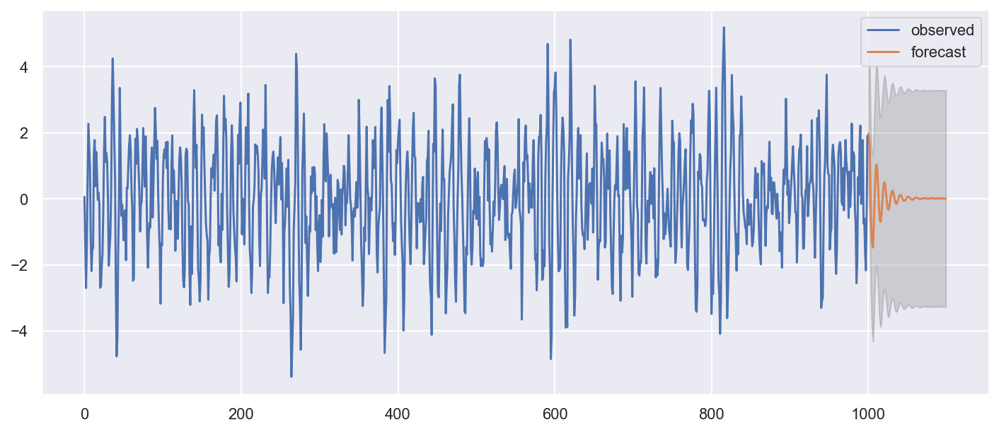

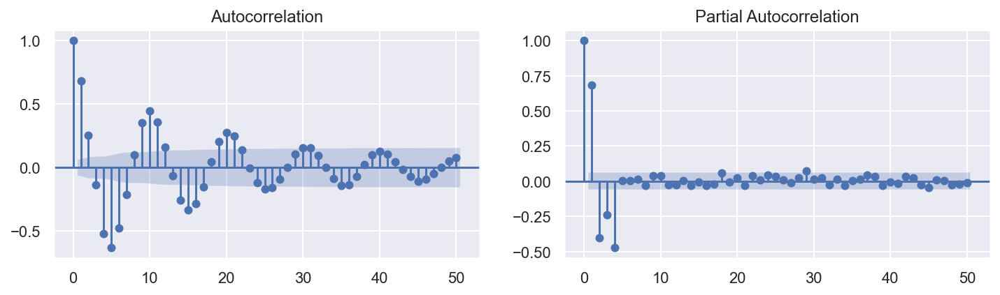

In [33]:
### ARMA(4,0) = AR(4)
# Setting
np.random.seed(123)
ar_params = np.array([0.75, -0.25, 0.2, -0.5])
ma_params = np.array([])
ahead = 100
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
ar_order, ma_order = len(ar)-1, len(ma)-1

# Generator
y = sm.tsa.ArmaProcess(ar,ma).generate_sample(nsample=1000, burnin=500)
fit = sm.tsa.ARMA(y, (ar_order,ma_order)).fit(trend='c', disp=5)
pred_ts_point = fit.forecast(steps=ahead)[0]
pred_ts_interval = fit.forecast(steps=ahead)[2]
ax = pd.DataFrame(y).plot(figsize=(12,5))
forecast_index = [i for i in range(pd.DataFrame(y).index.max()+1, pd.DataFrame(y).index.max()+ahead+1)]
pd.DataFrame(pred_ts_point, index=forecast_index).plot(label='forecast', ax=ax)
ax.fill_between(pd.DataFrame(pred_ts_interval, index=forecast_index).index,
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,0],
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,1], color='k', alpha=0.15)
plt.legend(['observed', 'forecast'])
display(fit.summary2())
plt.figure(figsize=(12,3))
sm.graphics.tsa.plot_acf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(121))
sm.graphics.tsa.plot_pacf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(122))
plt.show()

## ARMA(0,4) = MA(4)

<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:              ARMA             BIC:                 3472.2476
Dependent Variable: y                Log-Likelihood:      -1715.4  
Date:               2021-06-23 16:58 Scale:               1.0000   
No. Observations:   1000             Method:              css-mle  
Df Model:           5                Sample:              0        
Df Residuals:       995                                   0        
Converged:          1.0000           S.D. of innovations: 1.344    
No. Iterations:     12.0000          HQIC:                3453.993 
AIC:                3442.8011                                      
---------------------------------------------------------------------
            Coef.    Std.Err.      t       P>|t|     [0.025    0.975]
---------------------------------------------------------------------
const       0.0079     0.0297     0.2653   0.7908   -0.0504    0.0662
ma.L1.y    -0.0418     0.0275    -1.5186   0.1289   -0.0957    0.0121
ma.L2.y     0.2823     0.0276    10.2186   0.0000    0.2282    0.3365
ma.L3.y    -0.0569     0.0273    -2.0805   0.0375   -0.1105   -0.0033
ma.L4.y    -0.4858     0.0279   -17.4311   0.0000   -0.5404   -0.4311
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
MA.1           1.2761            -0.0000           1.2761            -0.0000
MA.2          -0.0088            -1.0828           1.0829            -0.2513
MA.3          -0.0088             1.0828           1.0829             0.2513
MA.4          -1.3757            -0.0000           1.3757            -0.5000
===================================================================

"""

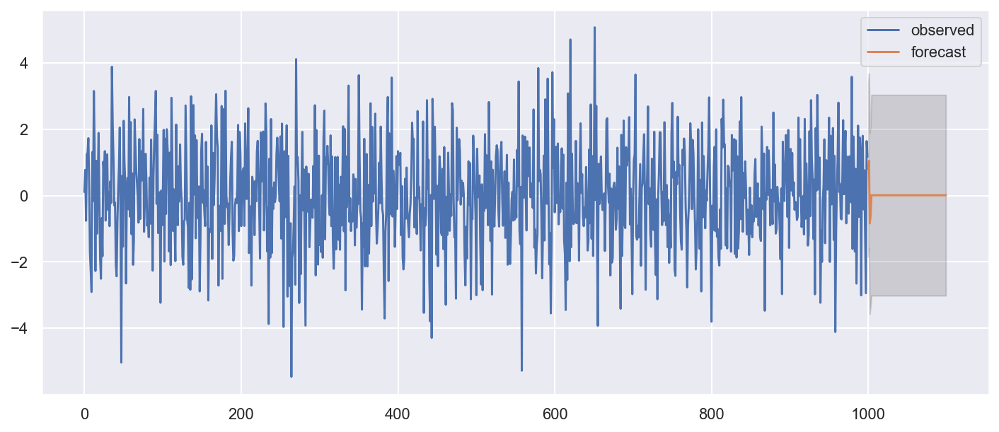

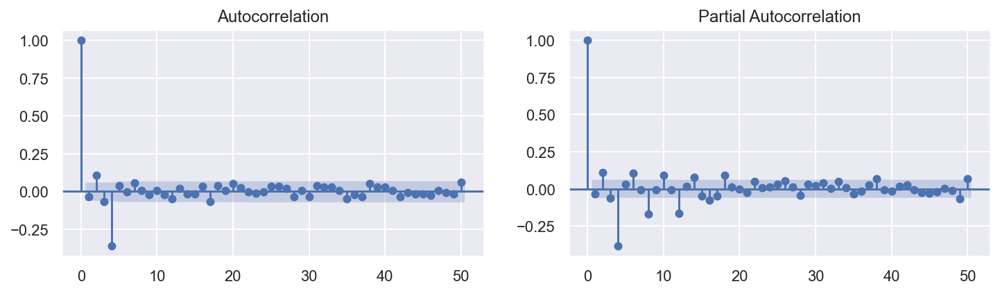

In [34]:
### ARMA(0,4) = MA(4)
# Setting
np.random.seed(123)
ar_params = np.array([])
ma_params = np.array([0.65, -0.25, 0.5, -0.9])
index_name = ['const', 'ma(1)', 'ma(2)', 'ma(3)', 'ma(4)']
ahead = 100
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
ar_order, ma_order = len(ar)-1, len(ma)-1

# Generator
y = sm.tsa.ArmaProcess(ar,ma).generate_sample(nsample=1000, burnin=500)
fit = sm.tsa.ARMA(y, (ar_order,ma_order)).fit(trend='c', disp=0)
pred_ts_point = fit.forecast(steps=ahead)[0]
pred_ts_interval = fit.forecast(steps=ahead)[2]
ax = pd.DataFrame(y).plot(figsize=(12,5))
forecast_index = [i for i in range(pd.DataFrame(y).index.max()+1, pd.DataFrame(y).index.max()+ahead+1)]
pd.DataFrame(pred_ts_point, index=forecast_index).plot(label='forecast', ax=ax)
ax.fill_between(pd.DataFrame(pred_ts_interval, index=forecast_index).index,
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,0],
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,1], color='k', alpha=0.15)
plt.legend(['observed', 'forecast'])
display(fit.summary2())
plt.figure(figsize=(12,3))
sm.graphics.tsa.plot_acf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(121))
sm.graphics.tsa.plot_pacf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(122))
plt.show()

## ARMA(1,1)

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-8.89
p-value,0.00
Used Lag,5.00
Used Observations,994.00
Critical Value(1%),-3.44
Maximum Information Criteria,"2,707.69"


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.38
p-value,0.08
Used Lag,22.00
Critical Value(10%),0.35


<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:              ARMA             BIC:                 2783.7601
Dependent Variable: y                Log-Likelihood:      -1378.1  
Date:               2021-06-23 16:58 Scale:               1.0000   
No. Observations:   1000             Method:              css-mle  
Df Model:           3                Sample:              0        
Df Residuals:       997                                   0        
Converged:          1.0000           S.D. of innovations: 0.959    
No. Iterations:     9.0000           HQIC:                2771.590 
AIC:                2764.1291                                      
---------------------------------------------------------------------
              Coef.    Std.Err.      t      P>|t|     [0.025   0.975]
---------------------------------------------------------------------
const         0.0641     0.1970    0.3252   0.7450   -0.3220   0.4501
ar.L1.y       0.7465     0.0224   33.3502   0.0000    0.7027   0.7904
ma.L1.y       0.6519     0.0261   24.9637   0.0000    0.6007   0.7031
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
AR.1           1.3395             0.0000           1.3395             0.0000
MA.1          -1.5340             0.0000           1.5340             0.5000
===================================================================

"""

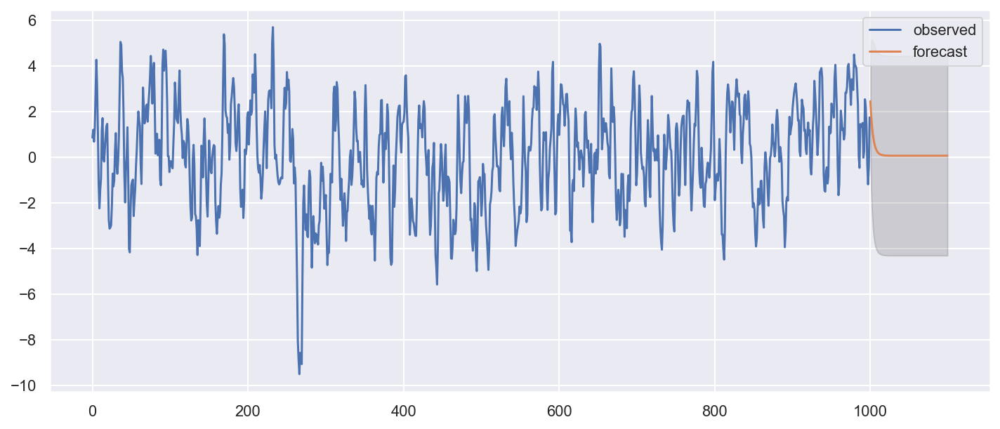

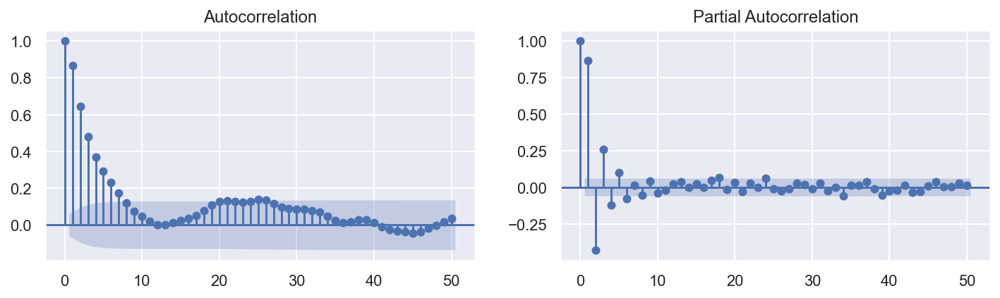

In [35]:
# Setting
np.random.seed(123)
ar_params = np.array([0.75])
ma_params = np.array([0.65])
ahead = 100
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
ar_order, ma_order = len(ar)-1, len(ma)-1

# Generator
y = sm.tsa.ArmaProcess(ar,ma).generate_sample(nsample=1000, burnin=500)
display(stationarity_adf_test(y, []))
display(stationarity_kpss_test(y, []))
fit = sm.tsa.ARMA(y, (ar_order,ma_order)).fit(trend='c', disp=0)
pred_ts_point = fit.forecast(steps=ahead)[0]
pred_ts_interval = fit.forecast(steps=ahead)[2]
ax = pd.DataFrame(y).plot(figsize=(12,5))
forecast_index = [i for i in range(pd.DataFrame(y).index.max()+1, pd.DataFrame(y).index.max()+ahead+1)]
pd.DataFrame(pred_ts_point, index=forecast_index).plot(label='forecast', ax=ax)
ax.fill_between(pd.DataFrame(pred_ts_interval, index=forecast_index).index,
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,0],
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,1], color='k', alpha=0.15)
plt.legend(['observed', 'forecast'])
display(fit.summary2())
plt.figure(figsize=(12,3))
sm.graphics.tsa.plot_acf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(121))
sm.graphics.tsa.plot_pacf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(122))
plt.show()

- 잔차에 대해서

In [36]:
display(stationarity_adf_test(fit.resid, []))
display(stationarity_kpss_test(fit.resid, []))

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-31.40
p-value,0.00
Used Lag,0.00
Used Observations,999.00
Critical Value(1%),-3.44
Maximum Information Criteria,"2,695.35"


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.36
p-value,0.10
Used Lag,22.00
Critical Value(10%),0.35


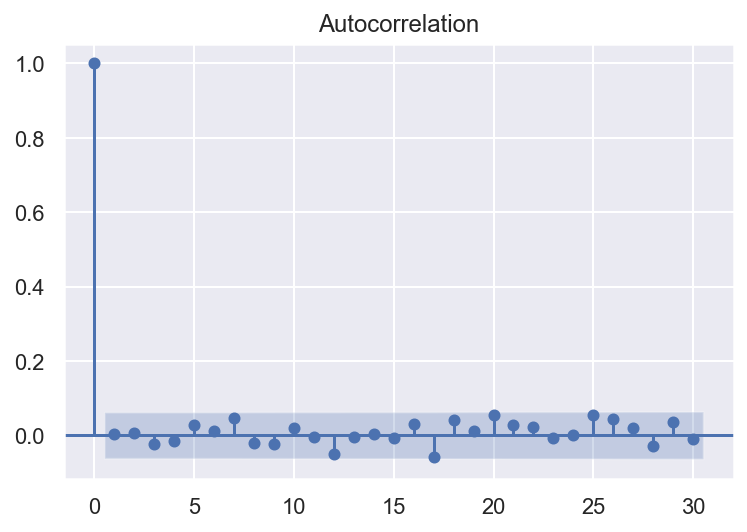

In [54]:
sm.graphics.tsa.plot_acf(fit.resid)
plt.show()

## ARMA(5,5)

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-8.47
p-value,0.00
Used Lag,17.00
Used Observations,982.00
Critical Value(1%),-3.44
Maximum Information Criteria,"2,742.68"


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.23
p-value,0.10
Used Lag,22.00
Critical Value(10%),0.35


<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:              ARMA             BIC:                 2844.4865
Dependent Variable: y                Log-Likelihood:      -1380.8  
Date:               2021-06-23 16:58 Scale:               1.0000   
No. Observations:   1000             Method:              css-mle  
Df Model:           11               Sample:              0        
Df Residuals:       989                                   0        
Converged:          1.0000           S.D. of innovations: 0.959    
No. Iterations:     54.0000          HQIC:                2807.977 
AIC:                2785.5934                                      
---------------------------------------------------------------------
             Coef.    Std.Err.      t      P>|t|     [0.025    0.975]
---------------------------------------------------------------------
const        0.0308     0.0864    0.3569   0.7212   -0.1386    0.2003
ar.L1.y      1.3387     0.4949    2.7049   0.0068    0.3687    2.3087
ar.L2.y     -0.7833     0.4780   -1.6387   0.1013   -1.7202    0.1536
ar.L3.y      0.7138     0.2246    3.1786   0.0015    0.2737    1.1540
ar.L4.y     -0.7757     0.2729   -2.8428   0.0045   -1.3106   -0.2409
ar.L5.y      0.2339     0.2687    0.8705   0.3840   -0.2927    0.7604
ma.L1.y      0.0678     0.4967    0.1366   0.8914   -0.9057    1.0413
ma.L2.y      0.2093     0.2164    0.9674   0.3334   -0.2148    0.6334
ma.L3.y     -0.0514     0.1982   -0.2592   0.7955   -0.4398    0.3371
ma.L4.y     -0.6159     0.0713   -8.6359   0.0000   -0.7557   -0.4762
ma.L5.y      0.1658     0.2752    0.6026   0.5467   -0.3735    0.7052
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
AR.1          -0.4994            -1.1024           1.2103            -0.3177
AR.2          -0.4994             1.1024           1.2103             0.3177
AR.3           1.0036            -0.5072           1.1245            -0.0745
AR.4           1.0036             0.5072           1.1245             0.0745
AR.5           2.3086            -0.0000           2.3086            -0.0000
MA.1          -1.1194            -0.0000           1.1194            -0.5000
MA.2          -0.0971            -1.0335           1.0381            -0.2649
MA.3          -0.0971             1.0335           1.0381             0.2649
MA.4           1.3648            -0.0000           1.3648            -0.0000
MA.5           3.6628            -0.0000           3.6628            -0.0000
===================================================================

"""

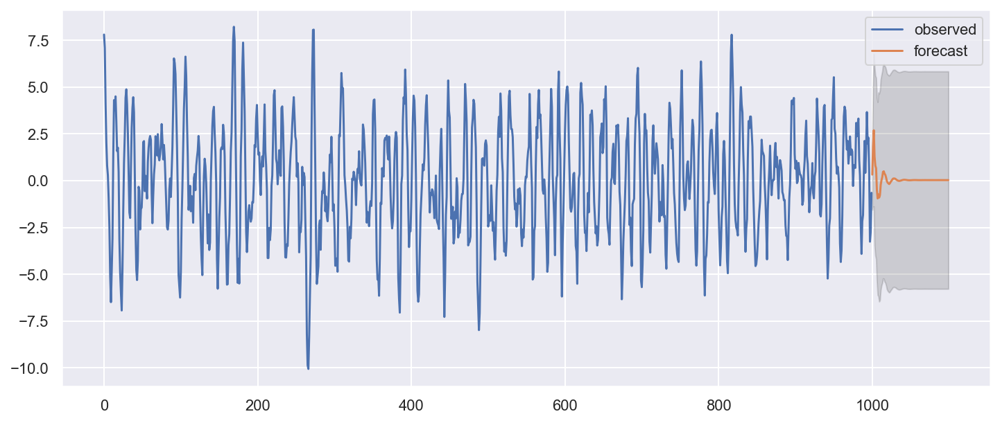

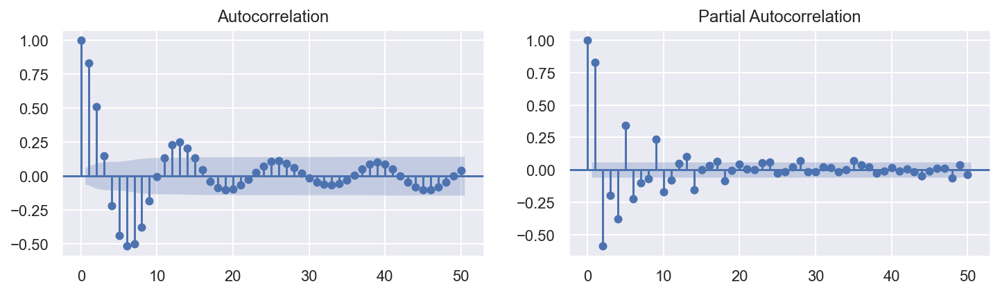

In [37]:
# Setting
np.random.seed(123)
ar_params = np.array([0.75, -0.25, 0.5, -0.5, -0.1])
ma_params = np.array([0.65, 0.5, 0.2, -0.5, -0.1])
index_name = ['const', 'ar(1)', 'ar(2)', 'ar(3)', 'ar(4)', 'ar(5)', 'ma(1)', 'ma(2)', 'ma(3)', 'ma(4)', 'ma(5)']
ahead = 100
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
ar_order, ma_order = len(ar)-1, len(ma)-1

# Generator
y = sm.tsa.ArmaProcess(ar,ma).generate_sample(nsample=1000, burnin=500)
display(stationarity_adf_test(y, []))
display(stationarity_kpss_test(y, []))
fit = sm.tsa.ARMA(y, (ar_order,ma_order)).fit(trend='c', disp=0)
pred_ts_point = fit.forecast(steps=ahead)[0]
pred_ts_interval = fit.forecast(steps=ahead)[2]
ax = pd.DataFrame(y).plot(figsize=(12,5))
forecast_index = [i for i in range(pd.DataFrame(y).index.max()+1, pd.DataFrame(y).index.max()+ahead+1)]
pd.DataFrame(pred_ts_point, index=forecast_index).plot(label='forecast', ax=ax)
ax.fill_between(pd.DataFrame(pred_ts_interval, index=forecast_index).index,
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,0],
                pd.DataFrame(pred_ts_interval, index=forecast_index).iloc[:,1], color='k', alpha=0.15)
plt.legend(['observed', 'forecast'])
display(fit.summary2())
plt.figure(figsize=(12,3))
sm.graphics.tsa.plot_acf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(121))
sm.graphics.tsa.plot_pacf(y, lags=50, zero=True, use_vlines=True, alpha=0.05, ax=plt.subplot(122))
plt.show()

# ACF가 오히려 증가되는 이유는?

- 잔차 테스트

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-32.55
p-value,0.00
Used Lag,0.00
Used Observations,999.00
Critical Value(1%),-3.44
Maximum Information Criteria,"2,690.62"


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.32
p-value,0.10
Used Lag,22.00
Critical Value(10%),0.35


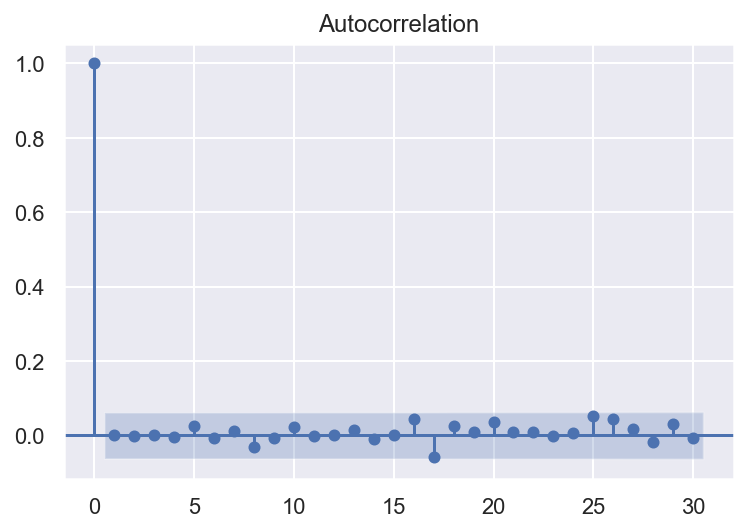

In [56]:
display(stationarity_adf_test(fit.resid, []))
display(stationarity_kpss_test(fit.resid, []))
sm.graphics.tsa.plot_acf(fit.resid)
plt.show()

# ARMA 실습

## 실습: 항체형성 호르몬수지 ARMA 모델링

,time,value
43,44,2.60
44,45,2.10
45,46,3.40
46,47,3.00
47,48,2.90


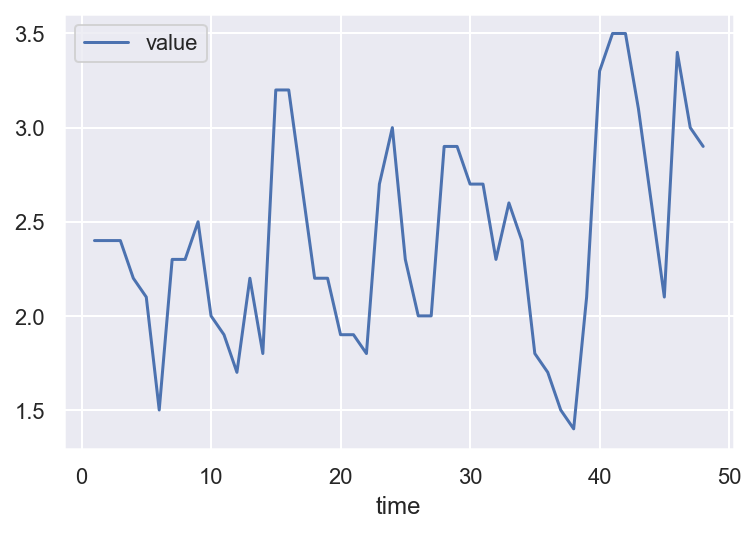

In [39]:
data = sm.datasets.get_rdataset('lh')
raw = data.data
display(raw.tail())
raw.plot(x='time', y='value')
plt.show()

### 정상성 확인

In [40]:
display(stationarity_adf_test(raw.value, []))
display(stationarity_kpss_test(raw.value, []))

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-3.68
p-value,0.00
Used Lag,1.00
Used Observations,46.00
Critical Value(1%),-3.58
Maximum Information Criteria,53.28


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.35
p-value,0.10
Used Lag,10.00
Critical Value(10%),0.35


### ACF/PACF 확인

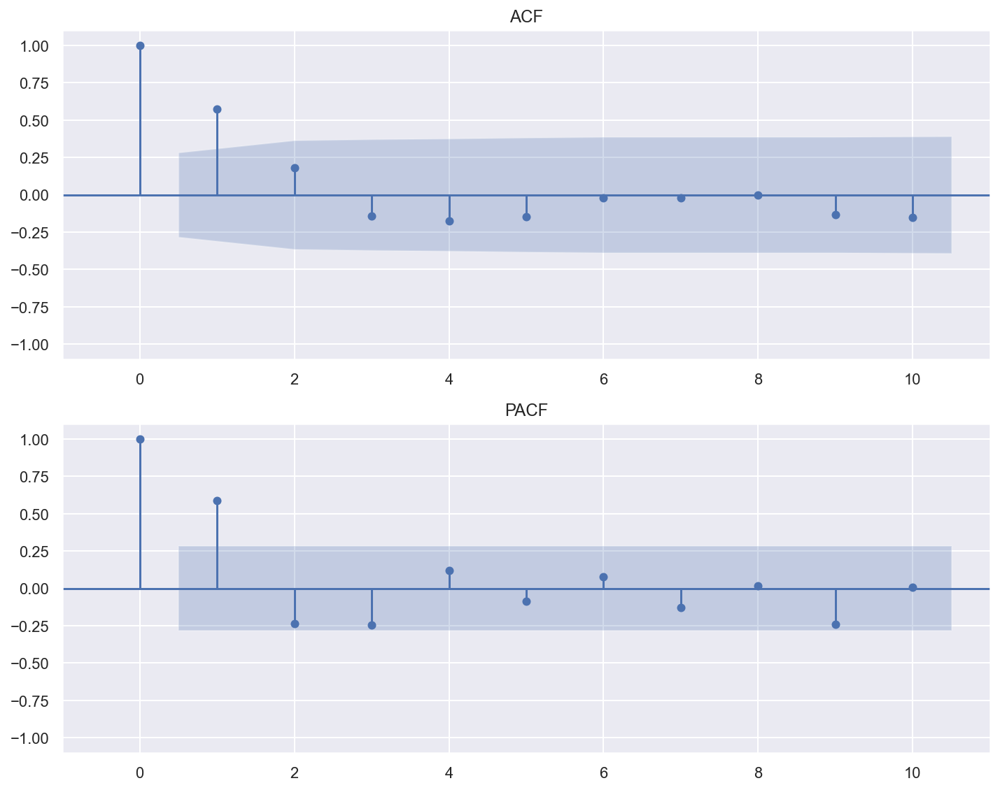

In [41]:
plt.figure(figsize=(10,8))
sm.tsa.graphics.plot_acf(raw.value, lags=10, ax=plt.subplot(211))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("ACF")

sm.tsa.graphics.plot_pacf(raw.value, lags=10, ax=plt.subplot(212))
plt.xlim(-1, 11)
plt.ylim(-1.1, 1.1)
plt.title("PACF")
plt.tight_layout()
plt.show()

### 모델링

In [44]:
fit = sm.tsa.ARMA(raw.value, (0,1)).fit()
display(fit.summary())

fit = sm.tsa.ARMA(raw.value, (1,0)).fit()
display(fit.summary())

fit = sm.tsa.ARMA(raw.value, (1,1)).fit()
display(fit.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  value   No. Observations:                   48
Model:                     ARMA(0, 1)   Log Likelihood                 -31.052
Method:                       css-mle   S.D. of innovations              0.461
Date:                Wed, 23 Jun 2021   AIC                             68.104
Time:                        17:03:01   BIC                             73.717
Sample:                             0   HQIC                            70.225
                                                                              
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.4050      0.098     24.576      0.000       2.213       2.597
ma.L1.value     0.4810      0.094      5.093      0.000       0.296       0.666
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -2.0790           +0.0000j            2.0790            0.5000
-----------------------------------------------------------------------------
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  value   No. Observations:                   48
Model:                     ARMA(1, 0)   Log Likelihood                 -29.379
Method:                       css-mle   S.D. of innovations              0.444
Date:                Wed, 23 Jun 2021   AIC                             64.758
Time:                        17:03:01   BIC                             70.372
Sample:                             0   HQIC                            66.880
                                                                              
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.4133      0.147     16.460      0.000       2.126       2.701
ar.L1.value     0.5739      0.116      4.939      0.000       0.346       0.802
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.7424           +0.0000j            1.7424            0.0000
-----------------------------------------------------------------------------
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  value   No. Observations:                   48
Model:                     ARMA(1, 1)   Log Likelihood                 -28.762
Method:                       css-mle   S.D. of innovations              0.439
Date:                Wed, 23 Jun 2021   AIC                             65.524
Time:                        17:03:01   BIC                             73.009
Sample:                             0   HQIC                            68.353
                                                                              
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.4101      0.136     17.754      0.000       2.144       2.676
ar.L1.value     0.4522      0.177      2.556      0.011       0.105       0.799
ma.L1.value     0.1982      0.171      1.162      0.245      -0.136       0.532
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            2.2114           +0.0000j            2.2114            0.0000
MA.1           -5.0462           +0.0000j            5.0462            0.5000
-----------------------------------------------------------------------------
"""

## 실습: 호흡기질환 사망자수 ARMA 모델링

In [45]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

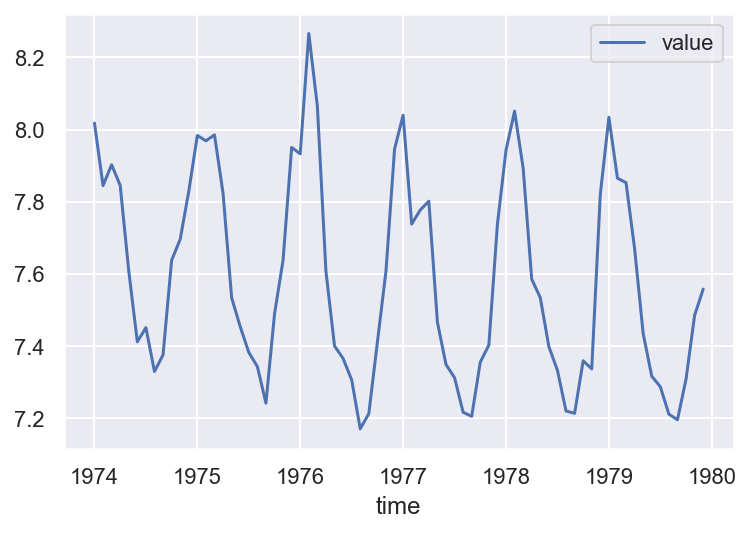

In [47]:
data = sm.datasets.get_rdataset('deaths', 'MASS')
raw = data.data
raw.value = np.log(raw.value)
raw.plot(x='time',y='value')
plt.show()

### 정상성 확인

In [48]:
display(stationarity_adf_test(raw.value, []))
display(stationarity_kpss_test(raw.value, []))

ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.


,Stationarity_adf
Test Statistics,-0.70
p-value,0.85
Used Lag,12.00
Used Observations,59.00
Critical Value(1%),-3.55
Maximum Information Criteria,-80.69


KPSS:계절성이 어느정도 남아있어 귀무가설(정상)을 기각합니다.


,Stationarity_kpss
Test Statistics,0.67
p-value,0.02
Used Lag,12.00
Critical Value(10%),0.35


In [49]:
display(stationarity_adf_test(raw.value.diff(1).dropna(), []))
display(stationarity_kpss_test(raw.value.diff(1).dropna(), []))

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-6.49
p-value,0.00
Used Lag,11.00
Used Observations,59.00
Critical Value(1%),-3.55
Maximum Information Criteria,-79.23


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.32
p-value,0.10
Used Lag,12.00
Critical Value(10%),0.35


In [50]:
len(raw.value.values)

72

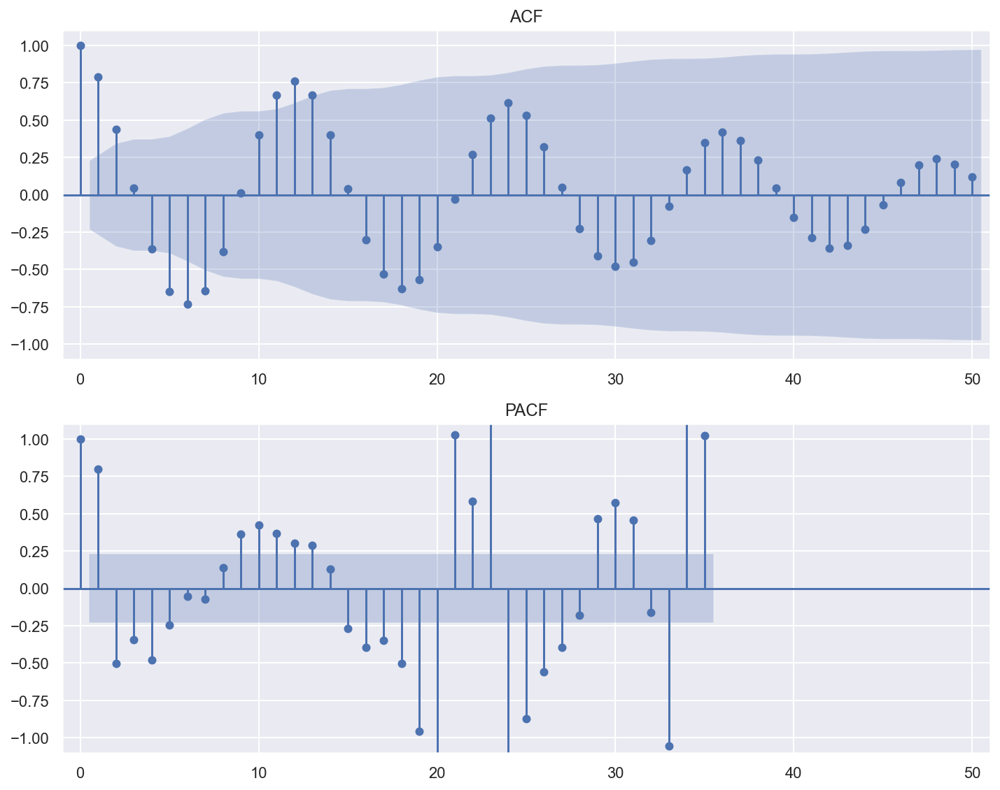

In [51]:
plt.figure(figsize=(10,8))
sm.tsa.graphics.plot_acf(raw.value.values, lags=50, ax=plt.subplot(211))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)
plt.title('ACF')

sm.tsa.graphics.plot_pacf(raw.value.values, lags=35, ax=plt.subplot(212))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)
plt.title('PACF')
plt.tight_layout()
plt.show()

In [52]:
fit = sm.tsa.ARMA(raw.value, (1,1)).fit()
display(fit.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  value   No. Observations:                   72
Model:                     ARMA(1, 1)   Log Likelihood                  31.983
Method:                       css-mle   S.D. of innovations              0.154
Date:                Wed, 23 Jun 2021   AIC                            -55.965
Time:                        17:05:09   BIC                            -46.859
Sample:                             0   HQIC                           -52.340
                                                                              
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           7.6037      0.080     94.470      0.000       7.446       7.761
ar.L1.value     0.6796      0.098      6.970      0.000       0.489       0.871
ma.L1.value     0.4680      0.111      4.214      0.000       0.250       0.686
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.4713           +0.0000j            1.4713            0.0000
MA.1           -2.1369           +0.0000j            2.1369            0.5000
-----------------------------------------------------------------------------
"""

## ARMA 차수 자동화

In [53]:
from itertools import product

result = []
for p, q in product(range(4), range(2)):
    if (p == 0 & q == 0):
        continue
    model = sm.tsa.ARMA(raw.value, (p,q)).fit()
    try:
        result.append({"p":p, 'q':q, 'LLF':model.llf, 'AIC':model.aic, 'BIC':model.bic})
    except:
        pass

In [54]:
result = pd.DataFrame(result)
result

,p,q,LLF,AIC,BIC
0,1,0,24.89,-43.79,-36.96
1,1,1,31.98,-55.97,-46.86
2,2,0,35.74,-63.48,-54.37
3,2,1,44.51,-79.03,-67.64
4,3,0,38.56,-67.12,-55.74
5,3,1,45.28,-78.56,-64.90


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  value   No. Observations:                   72
Model:                     ARMA(2, 1)   Log Likelihood                  44.513
Method:                       css-mle   S.D. of innovations              0.128
Date:                Wed, 23 Jun 2021   AIC                            -79.026
Time:                        17:05:27   BIC                            -67.642
Sample:                             0   HQIC                           -74.494
                                                                              
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           7.5920      0.020    384.992      0.000       7.553       7.631
ar.L1.value     1.6407      0.059     27.830      0.000       1.525       1.756
ar.L2.value    -0.8787      0.055    -16.027      0.000      -0.986      -0.771
ma.L1.value    -0.7021      0.075     -9.363      0.000      -0.849      -0.555
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.9336           -0.5162j            1.0668           -0.0804
AR.2            0.9336           +0.5162j            1.0668            0.0804
MA.1            1.4243           +0.0000j            1.4243            0.0000
-----------------------------------------------------------------------------
"""

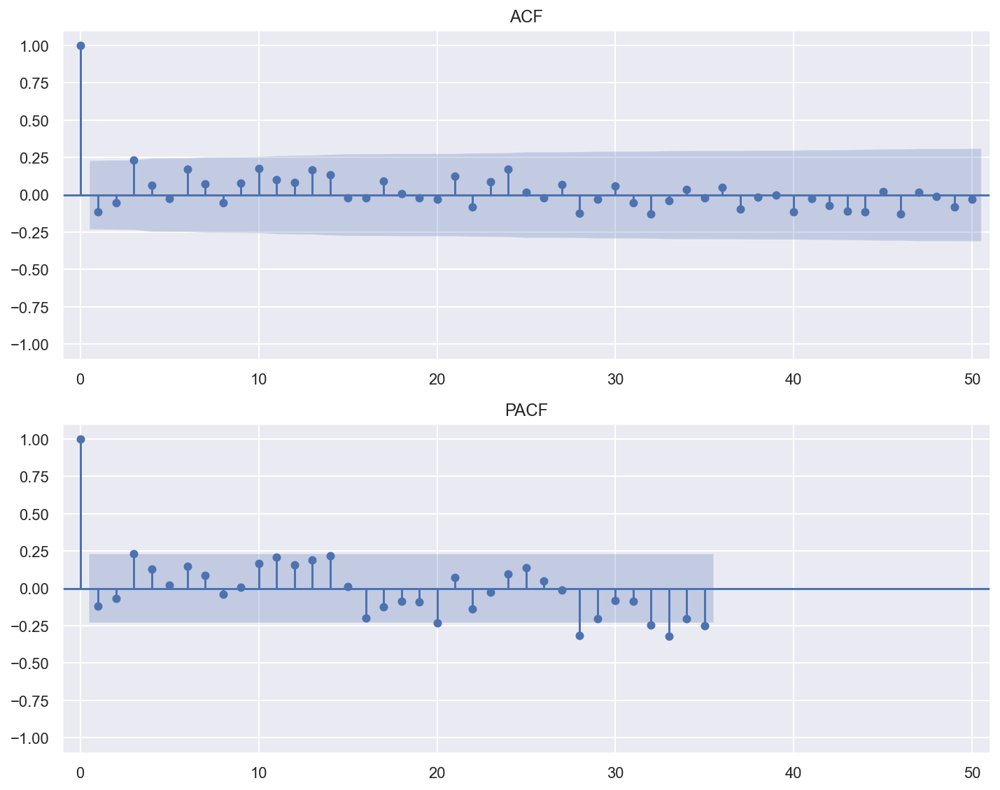

In [55]:
opt_ar = result.iloc[np.argmin(result.AIC), 0]
opt_ma = result.iloc[np.argmin(result.AIC), 1]
fit = sm.tsa.ARMA(raw.value, (opt_ar, opt_ma)).fit()
display(fit.summary())

plt.figure(figsize=(10, 8))
sm.graphics.tsa.plot_acf(fit.resid, lags=50, ax=plt.subplot(211))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("ACF")

sm.graphics.tsa.plot_pacf(fit.resid, lags=35, ax=plt.subplot(212))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("PACF")
plt.tight_layout()
plt.show()

In [85]:
display(stationarity_adf_test(fit.resid, []))
display(stationarity_kpss_test(fit.resid, []))

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-9.98
p-value,0.00
Used Lag,0.00
Used Observations,71.00
Critical Value(1%),-3.53
Maximum Information Criteria,-71.47


KPSS:계절성이 어느정도 남아있어 귀무가설(정상)을 기각합니다.


,Stationarity_kpss
Test Statistics,0.68
p-value,0.02
Used Lag,12.00
Critical Value(10%),0.35


# ARMAX

- $Y_t = c + aY_{t-1} + b\epsilon_{t-1} + ax + e$

## 통화량을 고려한 소비자지출 ARMAX 모델링

- 회귀분석으로 f(x)를 구하고 성능을 본다.
- ARMA을 사용하고 성능을 본다.

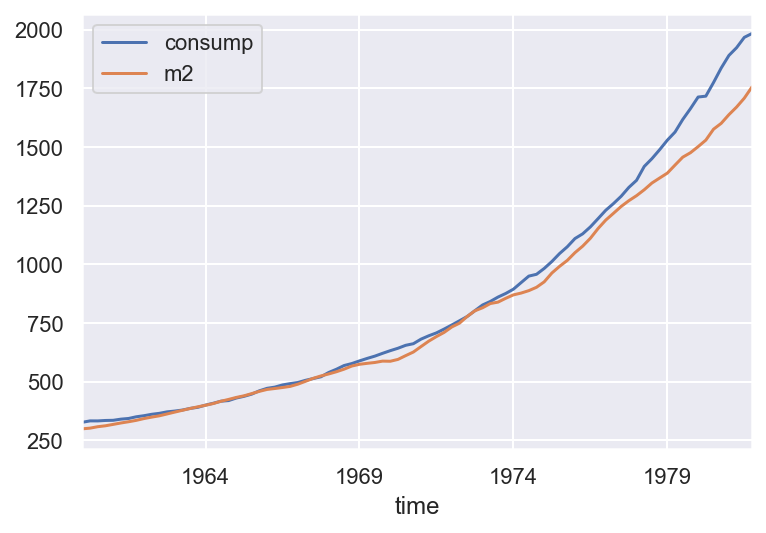

In [56]:
import requests
from io import BytesIO

source_url = requests.get('http://www.stata-press.com/data/r12/friedman2.dta').content
raw = pd.read_stata(BytesIO(source_url))
raw.index = raw.time
raw_using = raw.loc['1960':'1981',["consump", "m2"]]
raw_using.plot()
plt.show()

### 회귀분석 모델링

In [58]:
fit = sm.OLS.from_formula('consump~m2', data=raw_using).fit()
display(fit.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                consump   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                 1.721e+04
Date:                Wed, 23 Jun 2021   Prob (F-statistic):          7.72e-101
Time:                        17:06:34   Log-Likelihood:                -434.48
No. Observations:                  88   AIC:                             873.0
Df Residuals:                      86   BIC:                             877.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -61.7547      7.788     -7.930      0.000     -77.237     -46.273
m2             1.1406      0.009    131.182      0.000       1.123       1.158
==============================================================================
Omnibus:                        0.847   Durbin-Watson:                   0.094
Prob(Omnibus):                  0.655   Jarque-Bera (JB):                0.669
Skew:                           0.213   Prob(JB):                        0.716
Kurtosis:                       2.984   Cond. No.                     1.92e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.92e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [59]:
fit = sm.OLS(raw_using.consump, sm.add_constant(raw_using.m2)).fit()
display(fit.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                consump   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                 1.721e+04
Date:                Wed, 23 Jun 2021   Prob (F-statistic):          7.72e-101
Time:                        17:06:43   Log-Likelihood:                -434.48
No. Observations:                  88   AIC:                             873.0
Df Residuals:                      86   BIC:                             877.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -61.7547      7.788     -7.930      0.000     -77.237     -46.273
m2             1.1406      0.009    131.182      0.000       1.123       1.158
==============================================================================
Omnibus:                        0.847   Durbin-Watson:                   0.094
Prob(Omnibus):                  0.655   Jarque-Bera (JB):                0.669
Skew:                           0.213   Prob(JB):                        0.716
Kurtosis:                       2.984   Cond. No.                     1.92e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.92e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

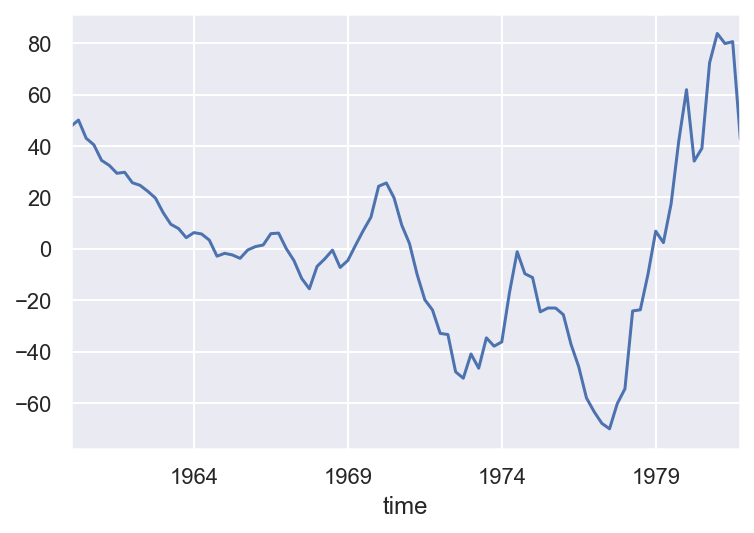

In [60]:
fit.resid.plot()
plt.show()

### 잔차 ACF/PACF

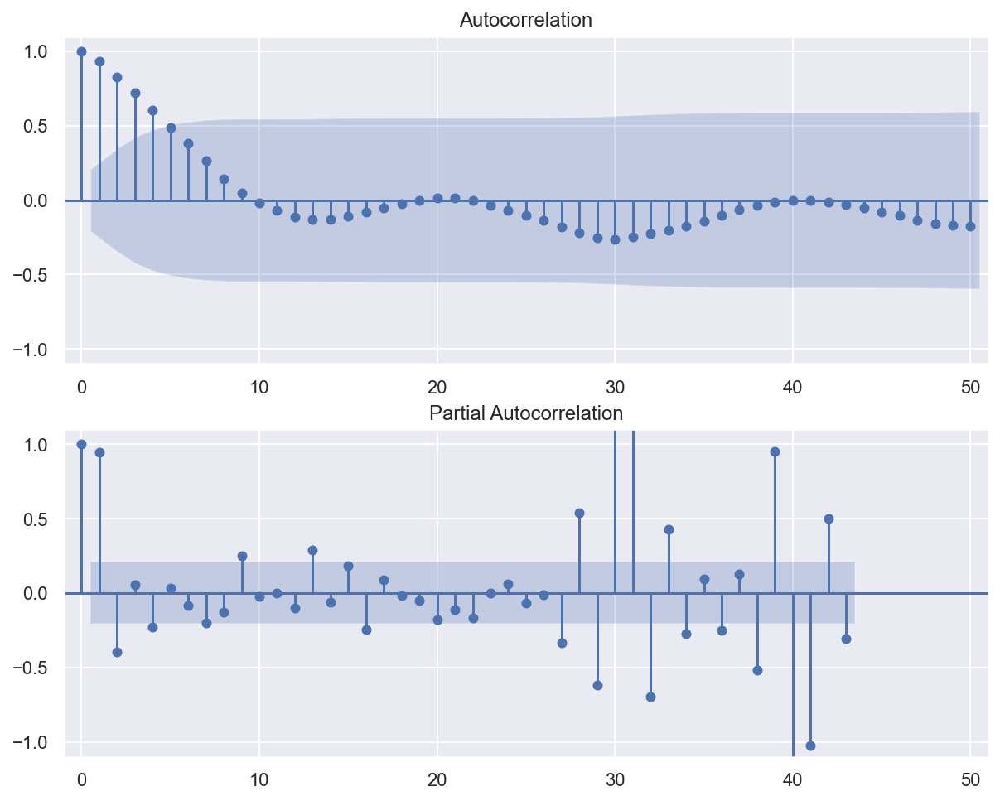

In [61]:
plt.figure(figsize=(10,8))
sm.graphics.tsa.plot_acf(fit.resid, lags=50, ax=plt.subplot(211))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)

sm.graphics.tsa.plot_pacf(fit.resid, lags=43, ax=plt.subplot(212))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)
plt.show()

### ARMAX 모델링

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                consump   No. Observations:                   88
Model:                     ARMA(1, 1)   Log Likelihood                -327.699
Method:                       css-mle   S.D. of innovations              9.873
Date:                Wed, 23 Jun 2021   AIC                            665.398
Time:                        17:07:42   BIC                            677.784
Sample:                    01-01-1960   HQIC                           670.388
                         - 10-01-1981                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const           -37.6152     36.041     -1.044      0.297    -108.255      33.025
m2                1.1232      0.034     33.283      0.000       1.057       1.189
ar.L1.consump     0.9330      0.043     21.867      0.000       0.849       1.017
ma.L1.consump     0.3106      0.116      2.682      0.007       0.084       0.538
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0718           +0.0000j            1.0718            0.0000
MA.1           -3.2199           +0.0000j            3.2199            0.5000
-----------------------------------------------------------------------------
"""

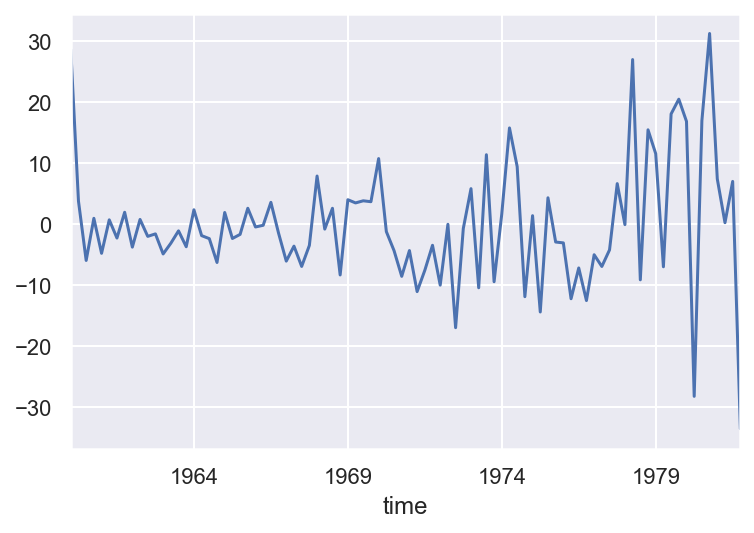

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-8.78
p-value,0.00
Used Lag,0.00
Used Observations,87.00
Critical Value(1%),-3.51
Maximum Information Criteria,570.50


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.13
p-value,0.10
Used Lag,12.00
Critical Value(10%),0.35


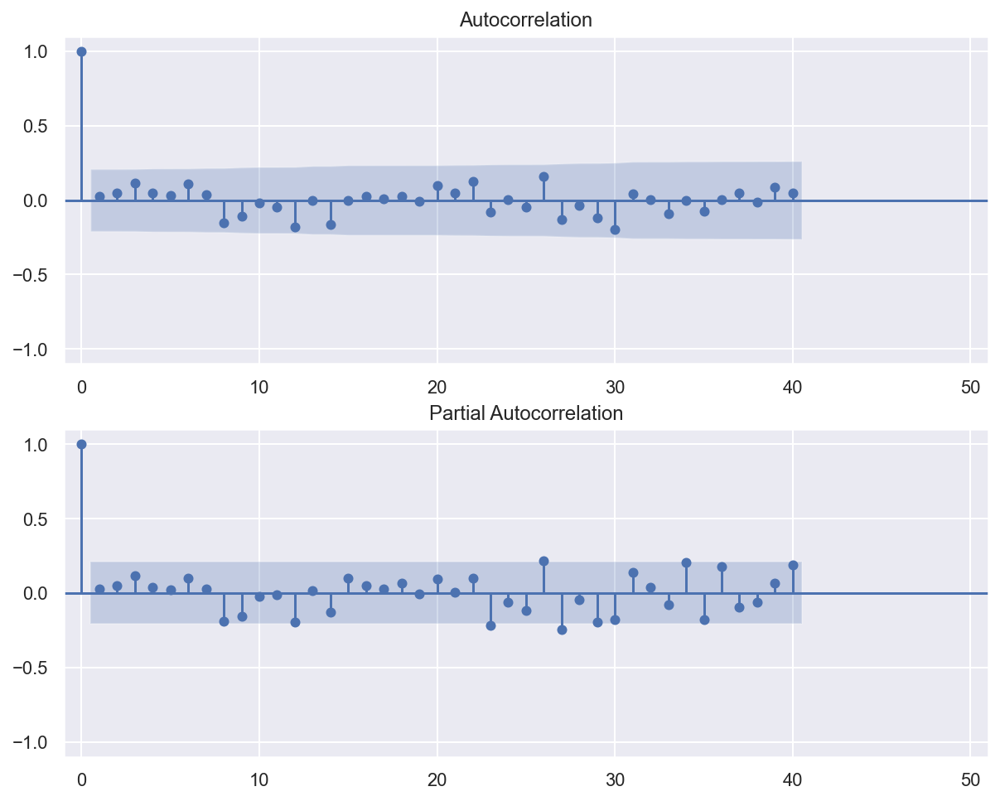

In [63]:
fit = sm.tsa.ARMA(raw_using.consump, (1,1), exog=raw_using.m2).fit()
display(fit.summary())

fit.resid.plot()
plt.show()

display(stationarity_adf_test(fit.resid, []))
display(stationarity_kpss_test(fit.resid, []))

plt.figure(figsize=(10,8))
sm.graphics.tsa.plot_acf(fit.resid, lags=40, ax=plt.subplot(211))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)
sm.graphics.tsa.plot_pacf(fit.resid, lags=40, ax=plt.subplot(212))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)
plt.show()

- 그럼에도 뒤로 갈수록 상관성이 커지는 이유는 뭘까?
- ARMA를 쓴다는 건 추세를 제거하는 것이 주 목적. 자기 자신의 Y값과 화이트노이즈를 사용하여 적합을 하므로 추세는 잘 제거된 것. 이런 잔 진동같은 계절성을 제거하지 못하고 있음

## SARIMAX 모델링

In [64]:
fit = sm.tsa.SARIMAX(raw_using.consump, exog = raw_using.m2, order=(1,0,0), seasonal_order=(1,0,1,4)).fit()
display(fit.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                             consump   No. Observations:                   88
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 4)   Log Likelihood                -333.579
Date:                             Wed, 23 Jun 2021   AIC                            677.158
Time:                                     17:07:56   BIC                            689.545
Sample:                                 01-01-1960   HQIC                           682.148
                                      - 10-01-1981                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
m2             0.3645      0.140      2.604      0.009       0.090       0.639
ar.L1          0.9987      0.004    271.004      0.000       0.992       1.006
ar.S.L4        0.9541      0.060     15.857      0.000       0.836       1.072
ma.S.L4       -0.4736      0.159     -2.985      0.003      -0.785      -0.163
sigma2        95.1798      9.448     10.074      0.000      76.662     113.698
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):               229.54
Prob(Q):                              0.78   Prob(JB):                         0.00
Heteroskedasticity (H):              23.47   Skew:                            -0.99
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.66
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

- 융박스 (H0 : 시계열 데이터의 Autocorrelation 없다.)
- 헤테로 (H0 : 시계열 데이터 등분산이다) 
- 자크베라 (H0 : 정규분포다)

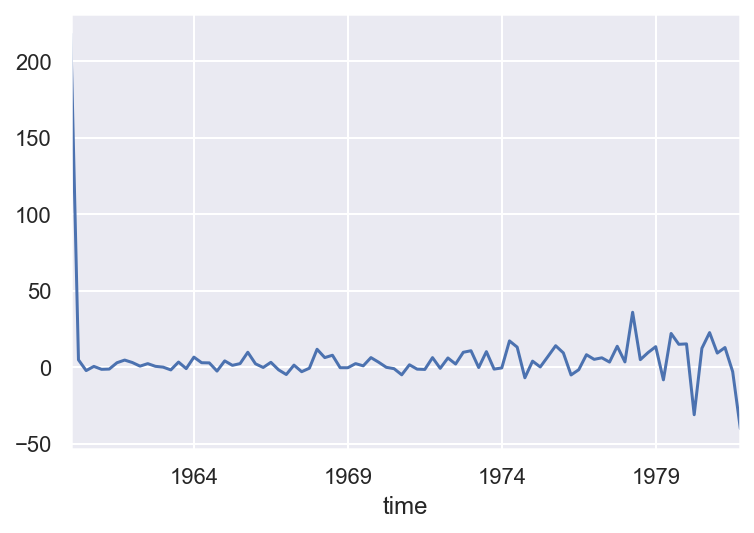

In [65]:
fit.resid.plot()
plt.show()

In [66]:
display(stationarity_adf_test(fit.resid, []))
display(stationarity_kpss_test(fit.resid, []))

ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.


,Stationarity_adf
Test Statistics,-1.72
p-value,0.42
Used Lag,11.00
Used Observations,76.00
Critical Value(1%),-3.52
Maximum Information Criteria,537.02


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.19
p-value,0.10
Used Lag,12.00
Critical Value(10%),0.35


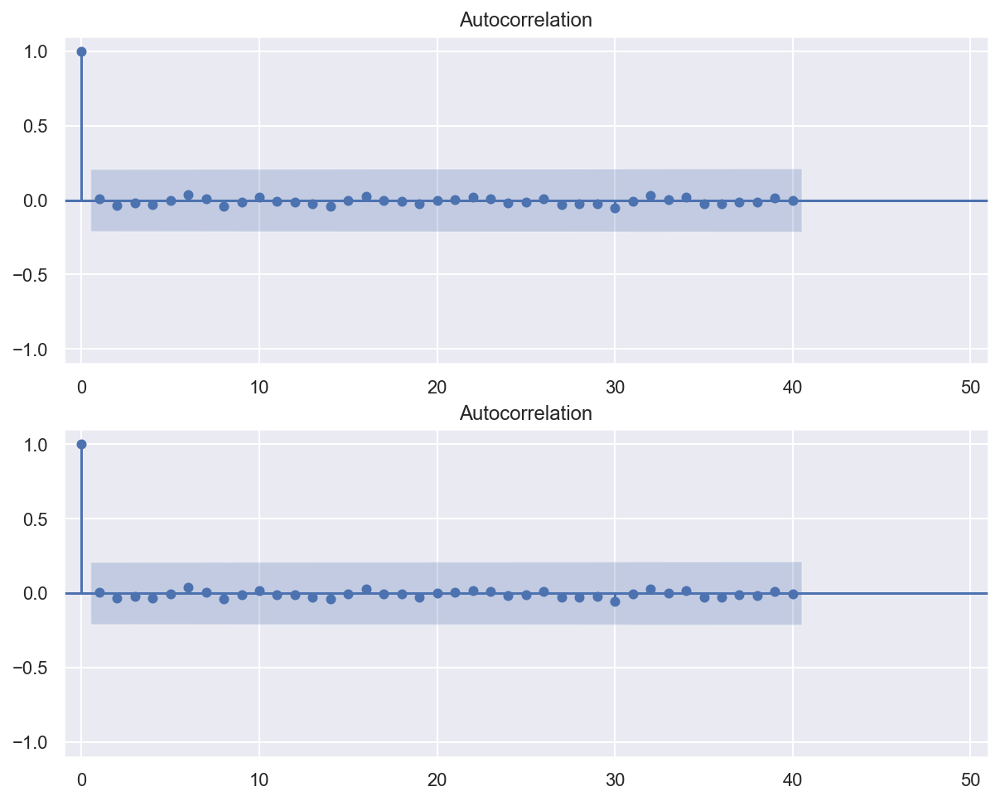

In [67]:
plt.figure(figsize=(10,8))
sm.graphics.tsa.plot_acf(fit.resid, lags=40, ax=plt.subplot(211))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)
sm.graphics.tsa.plot_acf(fit.resid, lags=40, ax=plt.subplot(212))
plt.xlim(-1,51)
plt.ylim(-1.1, 1.1)
plt.show()

# ARIMA

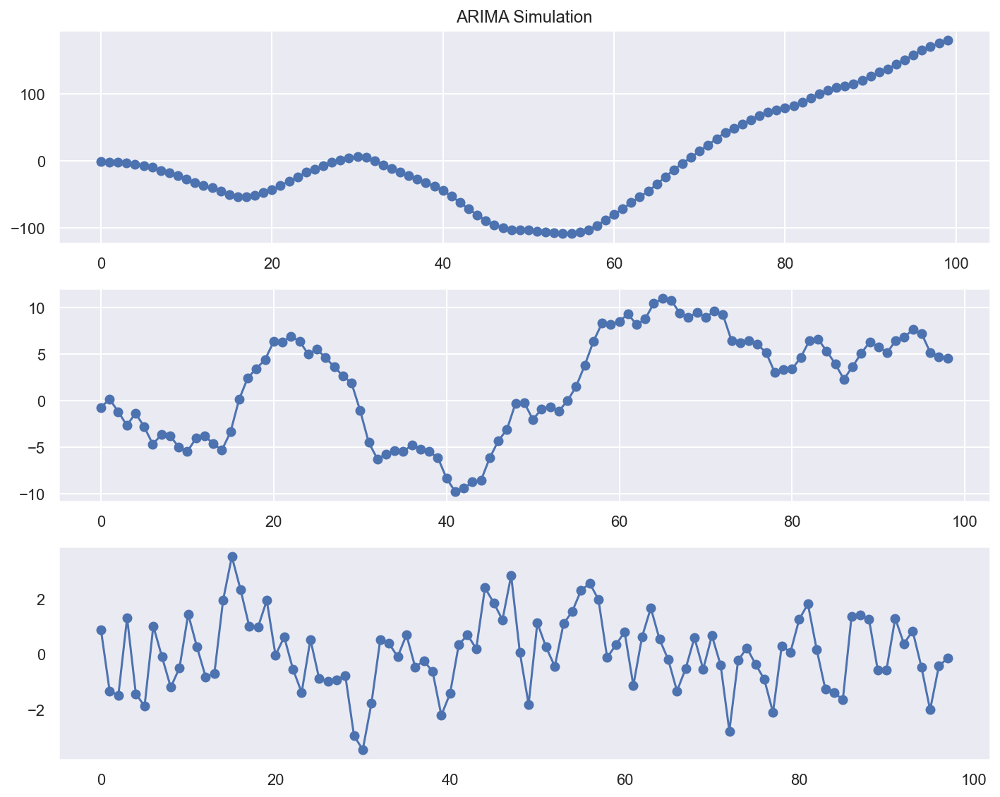

In [68]:
np.random.seed(123)
y2 = sm.tsa.ArmaProcess([1], [1, 0.6]).generate_sample(100).cumsum().cumsum()
y1 = np.diff(y2)
y0 = np.diff(y1)

plt.figure(figsize=(10,8))
plt.subplot(311)
plt.title("ARIMA Simulation")
plt.plot(y2, 'o-')
plt.subplot(312)
plt.plot(y1, 'o-')
plt.subplot(313)
plt.plot(y0, 'o-')
plt.tight_layout()
plt.grid()
plt.show()

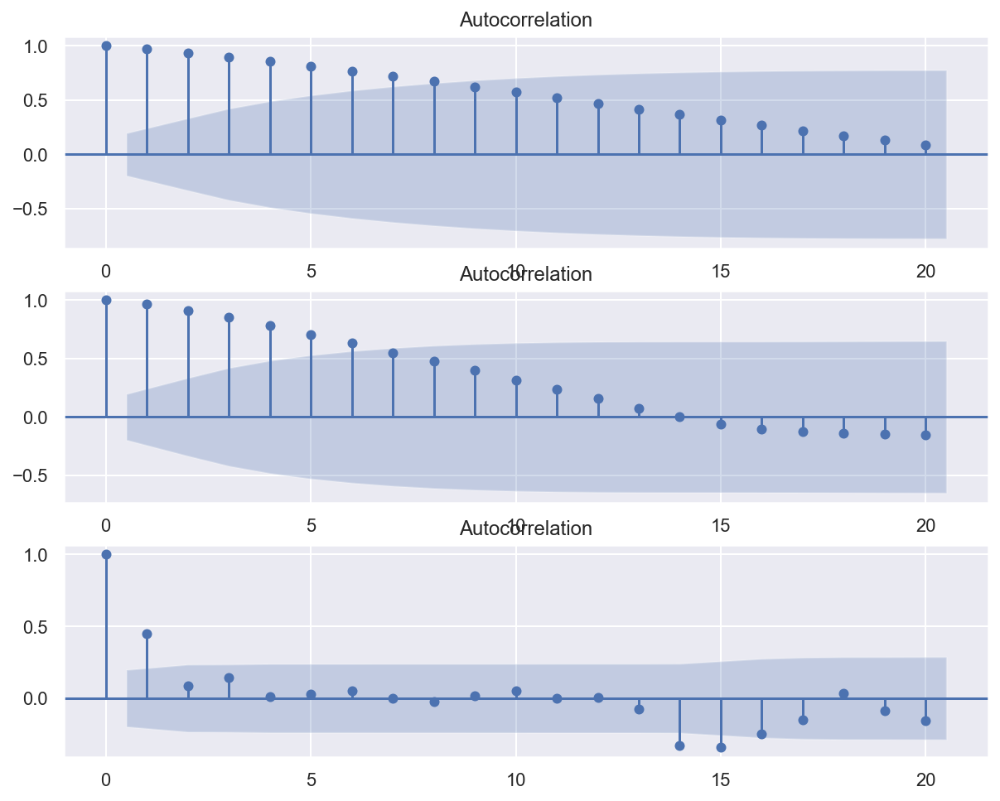

In [69]:
plt.figure(figsize=(10,8))
sm.graphics.tsa.plot_acf(y2, ax=plt.subplot(311))
sm.graphics.tsa.plot_acf(y1, ax=plt.subplot(312))
sm.graphics.tsa.plot_acf(y0, ax=plt.subplot(313))
plt.show()

## 과차분

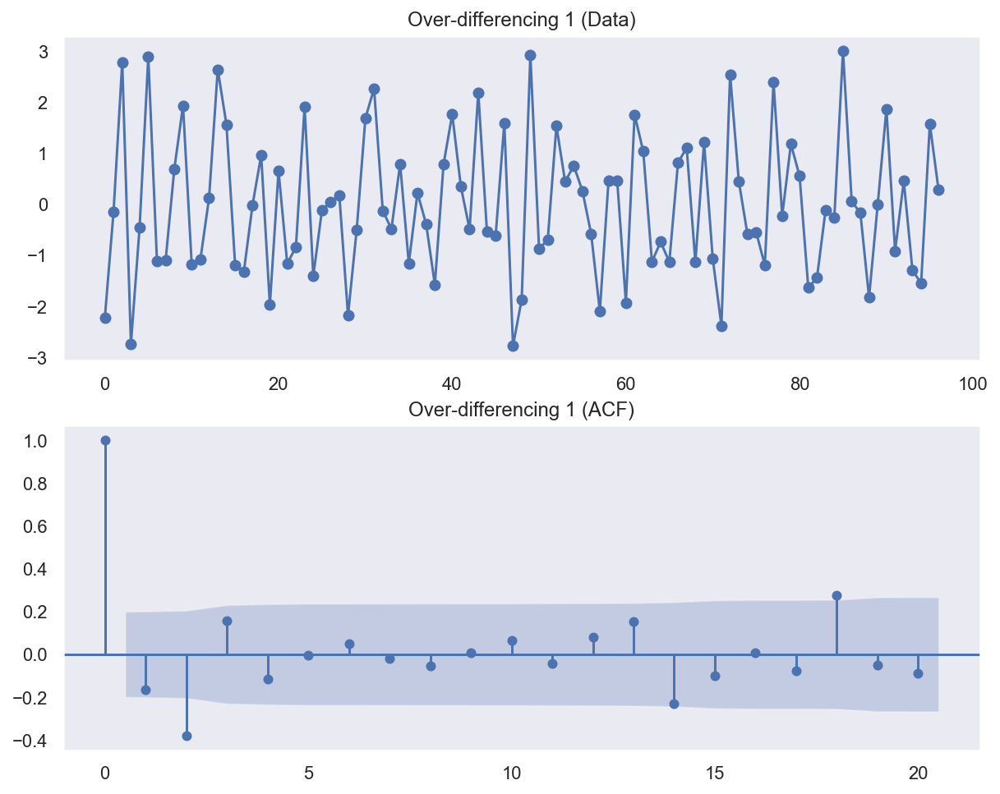

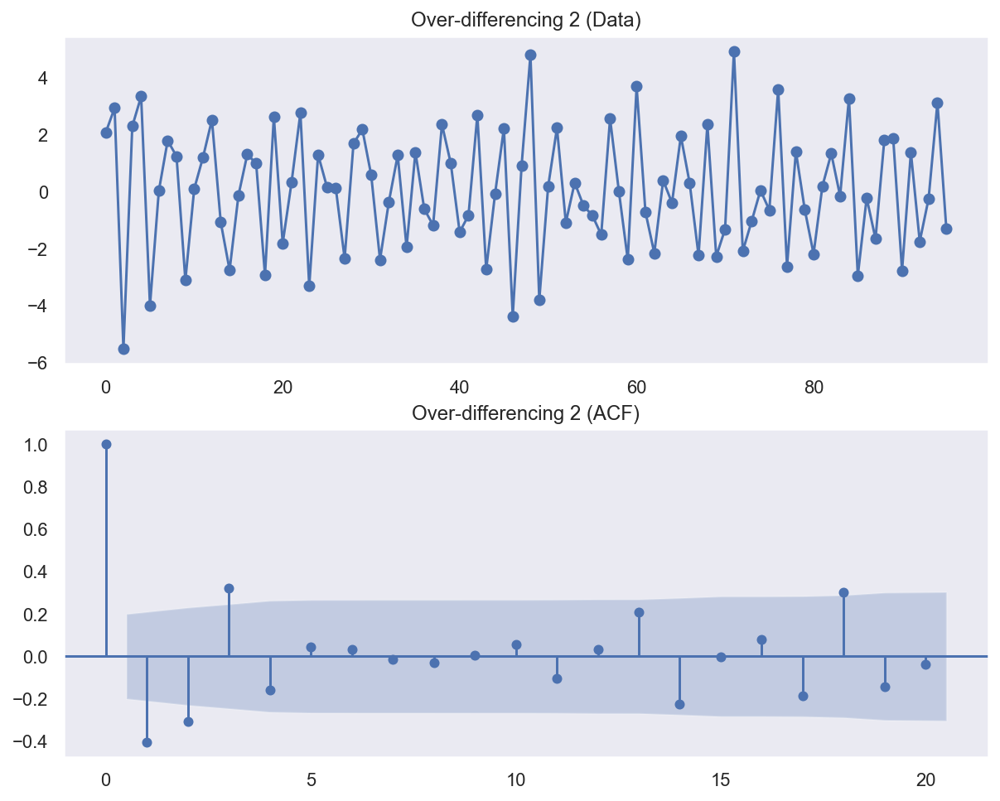

In [70]:
y1_minus = np.diff(y0)

plt.figure(figsize=(10,8))
plt.subplot(211)
plt.plot(y1_minus, 'o-')
plt.title("Over-differencing 1 (Data)")
plt.grid()
sm.tsa.graphics.plot_acf(y1_minus, ax=plt.subplot(212))
plt.title("Over-differencing 1 (ACF)")
plt.grid()
plt.show()

y2_minus = np.diff(y1_minus)

plt.figure(figsize=(10,8))
plt.subplot(211)
plt.plot(y2_minus, 'o-')
plt.title("Over-differencing 2 (Data)")
plt.grid()
sm.tsa.graphics.plot_acf(y2_minus, ax=plt.subplot(212))
plt.title("Over-differencing 2 (ACF)")
plt.grid()
plt.show()

In [71]:
import pandas as pd
import numpy as np
from statsmodels import datasets
import matplotlib.pyplot as plt
import statsmodels.api as sm
%reload_ext autoreload
%autoreload 2
from module_hobin import stationarity_adf_test, stationarity_kpss_test

,time,value,month
67,1978-08-31,9827,8
68,1978-09-30,9110,9
69,1978-10-31,9070,10
70,1978-11-30,8633,11
71,1978-12-31,9240,12


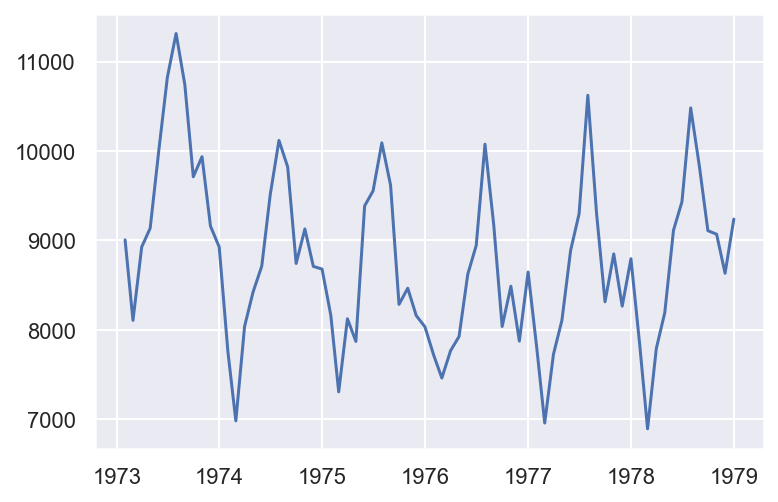

ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.


,Stationarity_adf
Test Statistics,-2.54
p-value,0.11
Used Lag,12.00
Used Observations,59.00
Critical Value(1%),-3.55
Maximum Information Criteria,870.44


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.28
p-value,0.10
Used Lag,12.00
Critical Value(10%),0.35


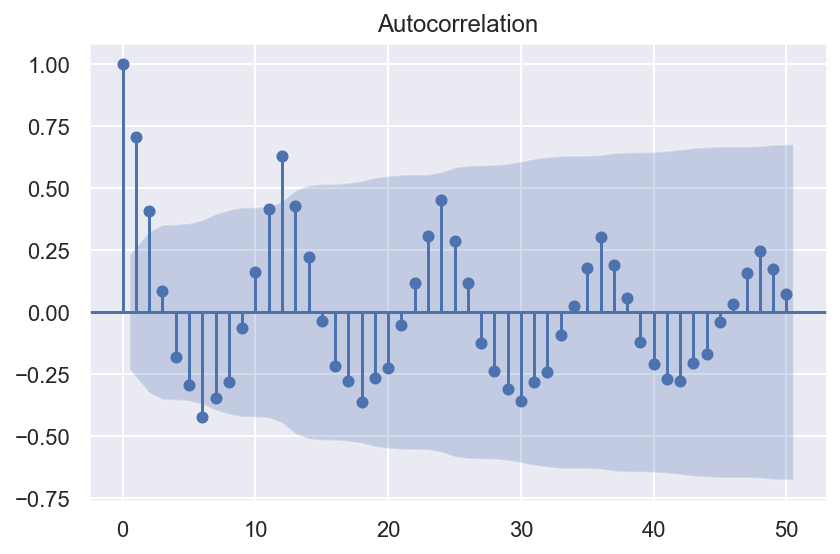

In [72]:
# ARIMA 모형의 한계
# 데이터 로딩 및 시간변수 반영
raw_set = datasets.get_rdataset("accdeaths", package="MASS")
raw = raw_set.data
raw.time = pd.date_range('1973-01-01', periods=len(raw), freq='M')
raw['month'] = raw.time.dt.month

# 데이터 확인
display(raw.tail())
plt.plot(raw.time, raw.value)
plt.show()

# 정상성 확인
display(stationarity_adf_test(raw.value, []))
display(stationarity_kpss_test(raw.value, []))
sm.graphics.tsa.plot_acf(raw.value, lags=50, use_vlines=True)
plt.tight_layout()
plt.show()

# SARIMA

\begin{align*}
\text{SARIMA} && \underbrace{(p, d, q)} && \underbrace{(P, D, Q)_m} \\
&& {\uparrow} && {\uparrow} \\
&& \text{Non-seasonal part} && \text{Seasonal part} \\
&& \text{of the model} && \text{of the model} \\
\end{align*}

\begin{align*}
\text{where } m = \text{ seasonal lag of observations.}
\end{align*}

\begin{align*}
\text{Equation: ARIMA(p,d,q)} && (1-\phi_1L - \cdots - \phi_p L^p) (1-L)^d Y_{t} &= 
  (1 + \theta_1 L + \cdots + \theta_q L^q) \epsilon_t\\
\text{Equation: ARIMA(1,1,1)} && (1 - \phi_{1}L) (1 - L)Y_{t} &= (1 + \theta_{1}L) \epsilon_{t}. \\
\text{Equation: SARIMA(p,d,q)(P,D,Q)}_m && (1-\phi_1L - \cdots - \phi_p L^p) (1 - \Phi_{1}L^{m} - \Phi_{2}L^{2m} - \cdots - \Phi_{P}L^{Pm}) (1-L)^d (1-L^{m})^D Y_{t} &=
  (1 + \theta_1 L + \cdots + \theta_q L^q) (1 + \Theta_{1}L^{m} + \Theta_{2}L^{2m} + \cdots + \Theta_{Q}L^{Qm}) \epsilon_t\\
\text{Equation: SARIMA(1,1,1)(1,1,1)}_4 && (1 - \phi_{1}L)~(1 - \Phi_{1}L^{4}) (1 - L) (1 - L^{4})Y_{t} &=
  (1 + \theta_{1}L)~ (1 + \Theta_{1}L^{4})\epsilon_{t}\\
\text{Equation: SARIMA(1,2,1)(1,2,1)}_4 && (1 - \phi_{1}L)~(1 - \Phi_{1}L^{4}) (1 - L)^2 (1 - L^{4})^2 Y_{t} &=
  (1 + \theta_{1}L)~ (1 + \Theta_{1}L^{4})\epsilon_{t}.
\end{align*}

## Simple SARIMA

- **SARIMA(0,0,0)(0,0,1,12):** 각 월의 시계열 자료의 값이 현재의 백색잡음과 작년 동월 백색잡음에 의해 생성
> - ACF 그래프에서 계절성시차(Lag12)에서의 계수가 유의수준을 벗어난 증가를 보임(다른 시차에서는 유의수준 내 존재)  
> - PACF 그래프에서 반복되는 계절성시차들의 지수적 감소를 보임   

\begin{align*}
\text{Main Equation} && Y_t &= (1 + \Theta_{1}L^{12})\epsilon_{t} \\ 
&& &= \epsilon_t + \Theta \epsilon_{t-12} \\
\text{Covariance} && Cov(Y_t, Y_{t-1}) &= \text{Cov}( \epsilon_t + \Theta \epsilon_{t-12} ,  \epsilon_{t-1} + \Theta \epsilon_{t-13} ) = 0 \\
&& Cov(Y_t, Y_{t-12}) &= \text{Cov}( \epsilon_t + \Theta \epsilon_{t-12} ,  \epsilon_{t-12} + \Theta \epsilon_{t-24} ) = -\Theta \sigma_e^2 \\
\text{Autocorrelation} && \rho_{k \cdot 12} &= \dfrac{\Theta_k + \Theta_{1}\Theta_{k+1} + \Theta_{2}\Theta_{k+2} + \cdots + \Theta_{Q-k}\Theta_{k+Q}}{1 + \Theta_1^2 +\Theta_2^2 + \cdots + \Theta_Q^2} \\
\end{align*}

- **SARIMA(0,0,0)(1,0,0,12):** 각 월의 시계열 자료의 값이 작년 동월 자료값과 현재의 백색잡음에 의해 생성
> - ACF 그래프에서 반복되는 계절성시차들의 지수적 감소를 보임  
> - PACF 그래프에서 계절성시차(Lag12)에서의 계수가 유의수준을 벗어난 증가를 보임(다른 시차에서는 유의수준 내 존재)  

\begin{align*}
\text{Main Equation} && (1 - \Phi_{1}L^{12}) Y_{t} &= \epsilon_t \\
&& Y_t &= \Phi Y_{t-12} + \epsilon_t \\
\text{Stationary Condition} && \Phi &< 1 \\
\text{Autocorrelation} && \rho_{k \cdot 12} &= (-1)^{k+1}\Phi^k \\
\end{align*}

- **SARIMA(0,0,0)(P,0,Q,12):**  

\begin{align*}
\text{Main Equation} && (1 - \Phi_{1}L^{12} - \Phi_{2}L^{24} - \cdots - \Phi_{P}L^{12P}) Y_{t} &= (1 + \Theta_{1}L^{12} + \Theta_{2}L^{24} + \cdots + \Theta_{Q}L^{12Q})\epsilon_{t} \\ 
&& Y_t - \Phi_1 Y_{t-12} - \Phi_2 Y_{t-24} - \cdots - \Phi_P Y_{t-12P} &= \epsilon_t + \Theta_1 \epsilon_{t-12} + \Theta_2 \epsilon_{t-24} + \cdots + \Theta_Q \epsilon_{t-12Q} \\
\end{align*}

- **SARIMA(0,0,0)(P,1,Q,12):**  

\begin{align*}
\text{Main Equation} && (1 - \Phi_{1}L^{12} - \Phi_{2}L^{24} - \cdots - \Phi_{P}L^{12P}) (1-L^{12}) Y_{t} &= (1 + \Theta_{1}L^{12} + \Theta_{2}L^{24} + \cdots + \Theta_{Q}L^{12Q})\epsilon_{t} \\
&& (Y_t-Y_{t-12}) - \Phi_1 (Y_{t-12}-Y_{t-24}) - \cdots - \Phi_P (Y_{t-12P}-Y_{t-12(P+1)}) \\
&&= \epsilon_t + \Theta_1 \epsilon_{t-12} + \Theta_2 \epsilon_{t-24} + \cdots + \Theta_Q \epsilon_{t-12Q} \\
\end{align*}

- **SARIMA(0,0,0)(0,1,1,12):**  

\begin{align*}
\text{Main Equation} && (1-L^{12}) Y_{t} &= (1 + \Theta_{1}L^{12})\epsilon_{t} \\
&& Y_t-Y_{t-12} &= \epsilon_t + \Theta_1 \epsilon_{t-12} \\
&& Y_t &= Y_{t-12} + \epsilon_t + \Theta_1 \epsilon_{t-12} \\
\end{align*}

- **SARIMA(0,0,0)(1,1,0,12):**  

\begin{align*}
\text{Main Equation} && (1 - \Phi_{1}L^{12}) (1-L^{12}) Y_{t} &= \epsilon_{t} \\
&& (Y_t-Y_{t-12}) - \Phi_1 (Y_{t-12}-Y_{t-24}) &= \epsilon_t \\
&& Y_t- (1 + \Phi_1)Y_{t-12} + \Phi_1 Y_{t-24} &= \epsilon_t \\
&& Y_t &= (1 + \Phi_1)Y_{t-12} - \Phi_1 Y_{t-24} + \epsilon_t \\
\end{align*}

### SARIMIA(0,0,0)(0,0,1,12)

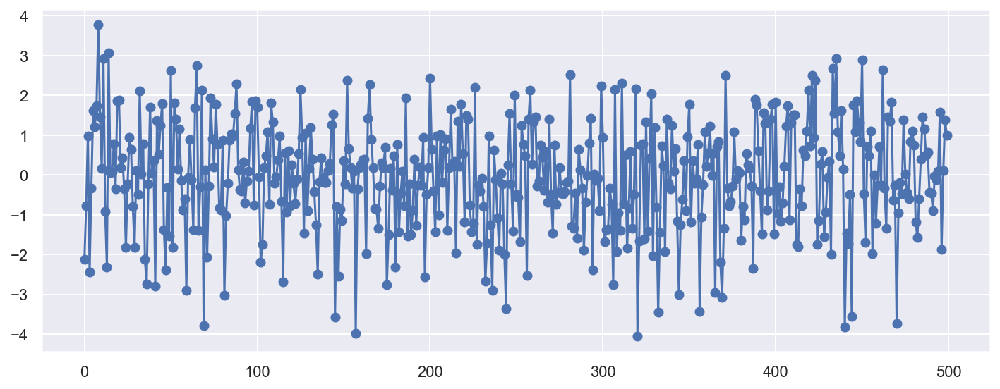

In [73]:
plt.figure(figsize=(10,4))
np.random.seed(123)
ar_params = np.array([])
ma_params = np.array([0,0,0,0,0,0,0,0,0,0,0,0.95])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y ,'o-')
plt.tight_layout()
plt.show()

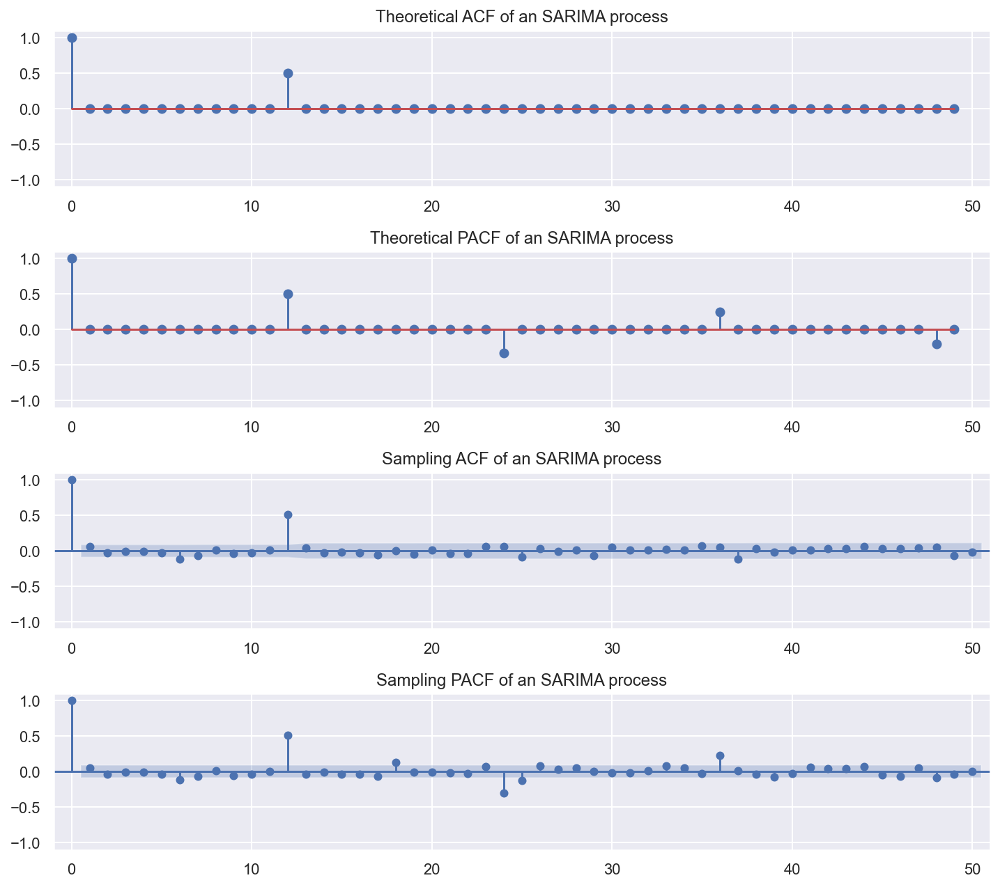

In [74]:
plt.figure(figsize=(10, 9))
plt.subplot(411)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical ACF of an SARIMA process")

plt.subplot(412)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical PACF of an SARIMA process")

sm.graphics.tsa.plot_acf(y, lags=50, ax=plt.subplot(413))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling ACF of an SARIMA process")

sm.graphics.tsa.plot_pacf(y, lags=50, ax=plt.subplot(414))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling PACF of an SARIMA process")
plt.tight_layout()
plt.show()

### SARIMA(0,0,0)(1,0,0,12)

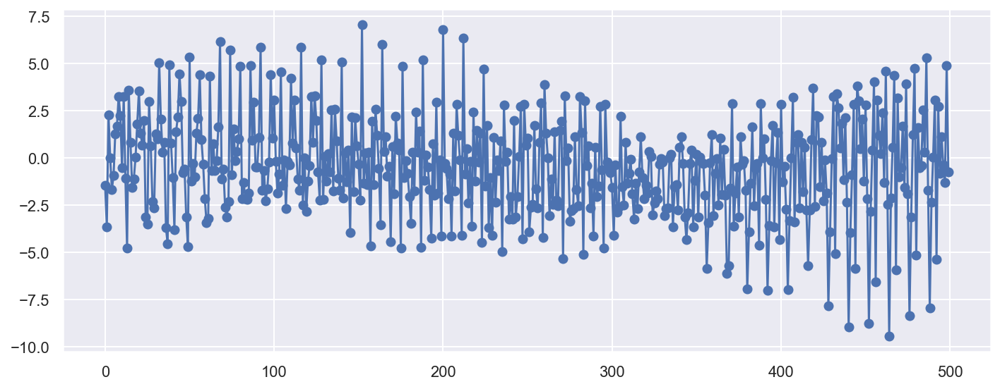

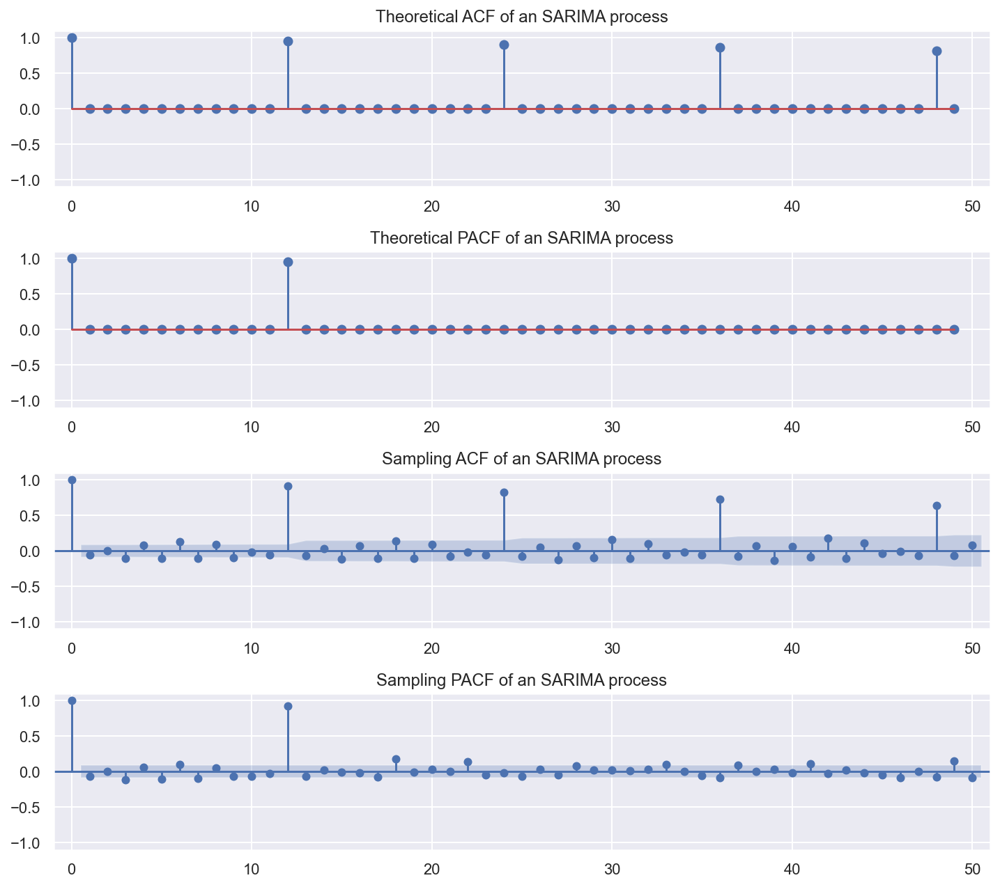

In [75]:
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.95])
ma_params = np.array([])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 9))
plt.subplot(411)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical ACF of an SARIMA process")

plt.subplot(412)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical PACF of an SARIMA process")

sm.graphics.tsa.plot_acf(y, lags=50, ax=plt.subplot(413))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling ACF of an SARIMA process")

sm.graphics.tsa.plot_pacf(y, lags=50, ax=plt.subplot(414))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling PACF of an SARIMA process")
plt.tight_layout()
plt.show()

### SARIMA(0,0,0)(0,1,1,12)

\begin{align*}
\text{Main Equation} && (1-L^{12}) Y_{t} &= (1 + \Theta_{1}L^{12})\epsilon_{t} \\
&& Y_t-Y_{t-12} &= \epsilon_t + \Theta_1 \epsilon_{t-12} \\
&& Y_t &= Y_{t-12} + \epsilon_t + \Theta_1 \epsilon_{t-12} \\
\end{align*}


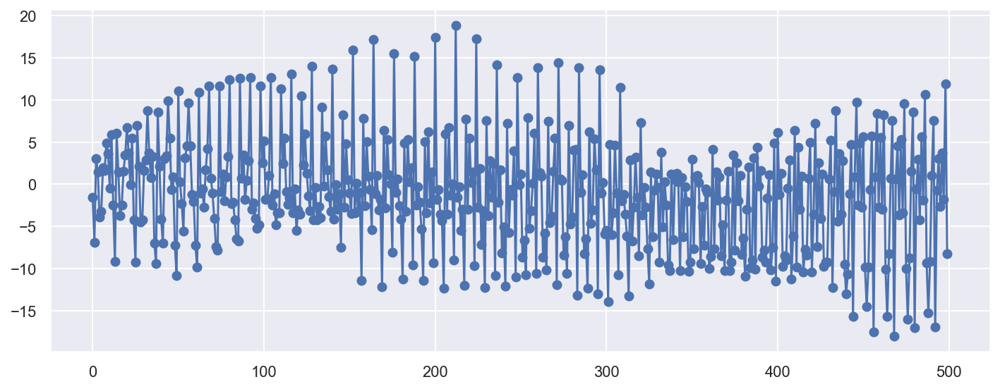

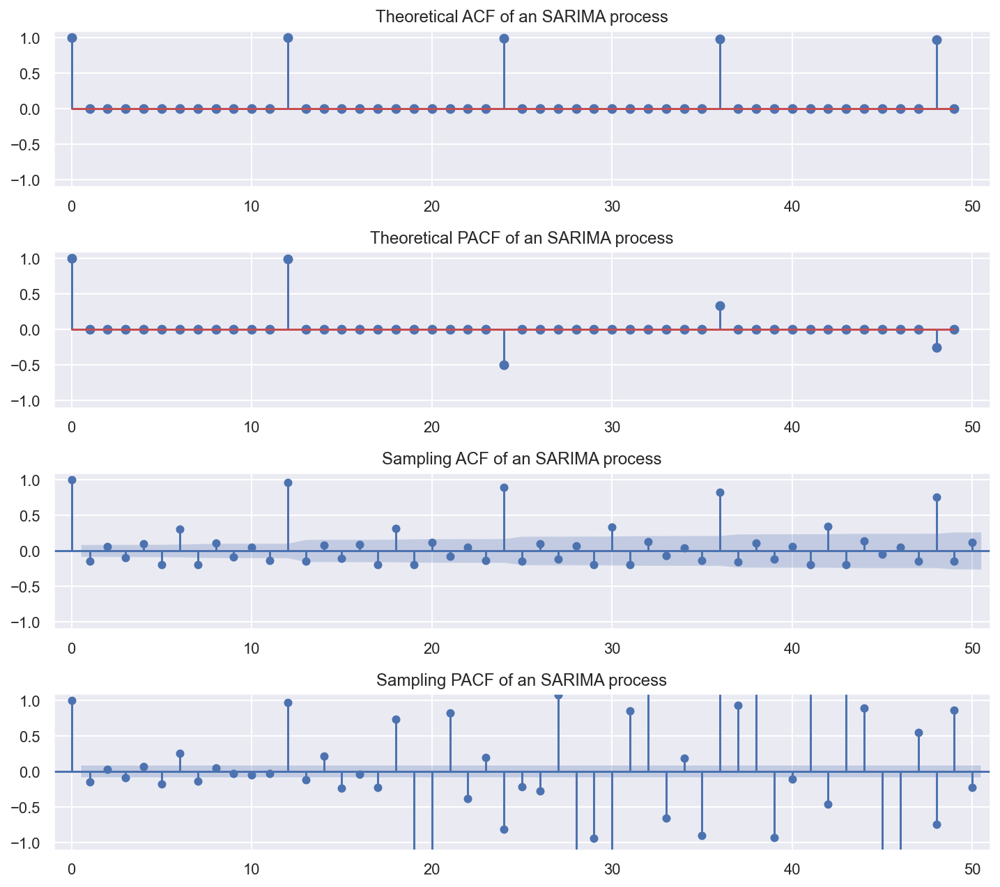

In [76]:
# SARIMA(0,0,0)(0,1,1,12)
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([0,0,0,0,0,0,0,0,0,0,0,0.99])
ma_params = np.array([0,0,0,0,0,0,0,0,0,0,0,0.95])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 9))
plt.subplot(411)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical ACF of an SARIMA process")

plt.subplot(412)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical PACF of an SARIMA process")

sm.graphics.tsa.plot_acf(y, lags=50, ax=plt.subplot(413))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling ACF of an SARIMA process")

sm.graphics.tsa.plot_pacf(y, lags=50, ax=plt.subplot(414))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling PACF of an SARIMA process")
plt.tight_layout()
plt.show()

### SARIMA(0,0,0)(1,1,0,12)

\begin{align*}
\text{Main Equation} && (1 - \Phi_{1}L^{12}) (1-L^{12}) Y_{t} &= \epsilon_{t} \\
&& (Y_t-Y_{t-12}) - \Phi_1 (Y_{t-12}-Y_{t-24}) &= \epsilon_t \\
&& Y_t- (1 + \Phi_1)Y_{t-12} + \Phi_1 Y_{t-24} &= \epsilon_t \\
&& Y_t &= (1 + \Phi_1)Y_{t-12} - \Phi_1 Y_{t-24} + \epsilon_t \\
\end{align*}

- 차분도 해야하고, 계절성 AR텀도 있고

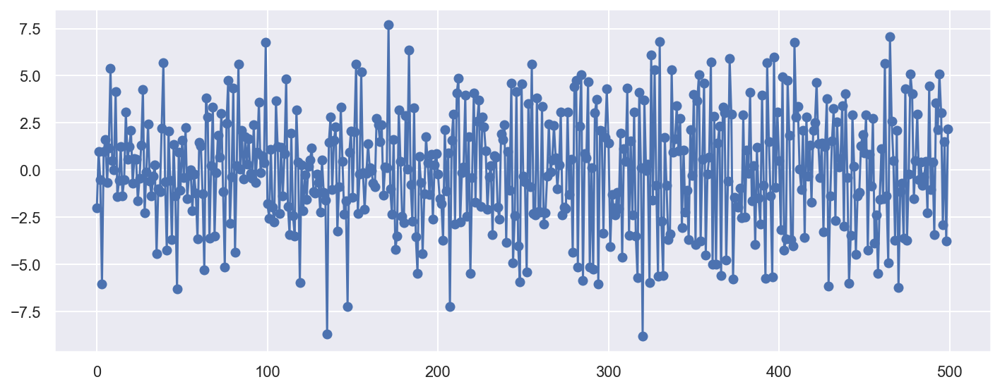

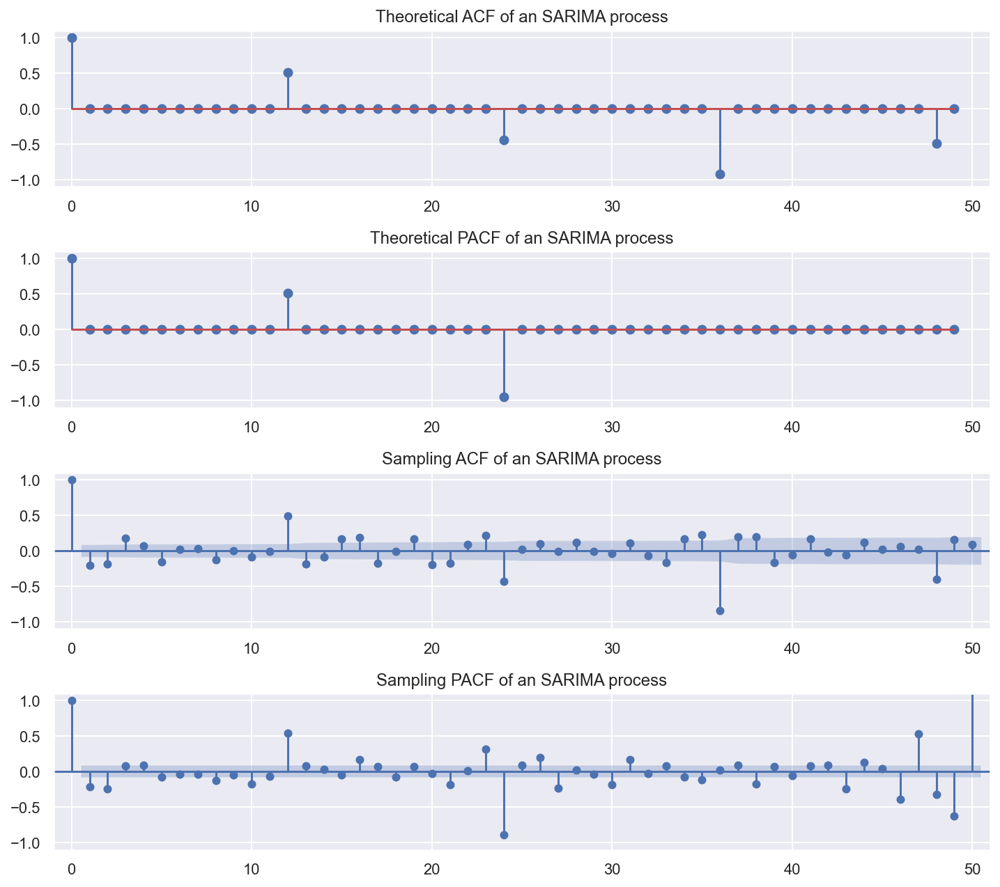

In [77]:
# SARIMA(0,0,0)(1,1,0,12)
plt.figure(figsize=(10, 4))
np.random.seed(123)
ar_params = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.99, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -0.95])
ma_params = np.array([])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 9))
plt.subplot(411)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical ACF of an SARIMA process")

plt.subplot(412)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical PACF of an SARIMA process")

sm.graphics.tsa.plot_acf(y, lags=50, ax=plt.subplot(413))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling ACF of an SARIMA process")

sm.graphics.tsa.plot_pacf(y, lags=50, ax=plt.subplot(414))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling PACF of an SARIMA process")
plt.tight_layout()
plt.show()

## Multiplicated SARIMA

- **SARIMA(0,0,1)(0,0,1,12):** 계절주기 12고 계절주기 자료들 간에는 ARIMA(0,0,1), 비계절 자료들 간에는 ARIMA(0,0,1)  
> - 시차(Lag)가 1, 11, 12, 13인 경우를 제외하고는 자기상관계수가 모두 0  

\begin{align*}
\text{Main Equation} && Y_t &= (1+\theta L)(1+\Theta L^{12}) \epsilon_t = \epsilon_t + \theta \epsilon_{t-1} + \Theta \epsilon_{t-12} + \theta\Theta \epsilon_{t-13} \\
\text{Autocorrelation} && \rho_1 &= -\dfrac{\theta}{1+\theta^2} \\
&& \rho_{11} = \rho_{13} &= \dfrac{\theta\Theta}{(1+\theta^2)(1+\Theta^2)} \\
&& \rho_{12} &= -\dfrac{\Theta}{1+\Theta^2} \\
\end{align*}

- **SARIMA(0,0,1)(1,0,0,12):** 계절주기 12고 계절주기 자료들 간에는 ARIMA(1,0,0), 비계절 자료들 간에는 ARIMA(0,0,1)  
> - 시차(Lag)가 12의 배수와 그 앞/뒤인 경우(12$k$, 12$k$+1, 12$k$-1)를 제외하고는 자기상관계수가 모두 0  

\begin{align*}
\text{Main Equation} && (1 - \Phi L^{12})Y_t &= (1 + \theta L) \epsilon_t \\
&& Y_t &=  \Phi Y_{t-12} + \epsilon_t + \theta \epsilon_{t-1} \\
\text{Autocorrelation} && \rho_{12k} &= (-1)^{k+1}\Phi^k \\
&& \rho_1 &= -\dfrac{\theta}{1+\theta^2} \\
&& \rho_{12k-1} = \rho_{12k+1} &= (-1)^{k+1}\dfrac{\theta}{1+\theta^2} \Phi^k \\
\end{align*}

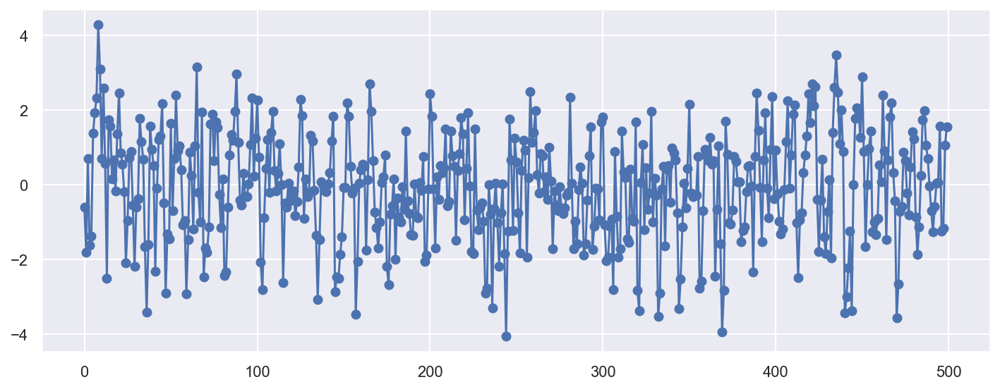

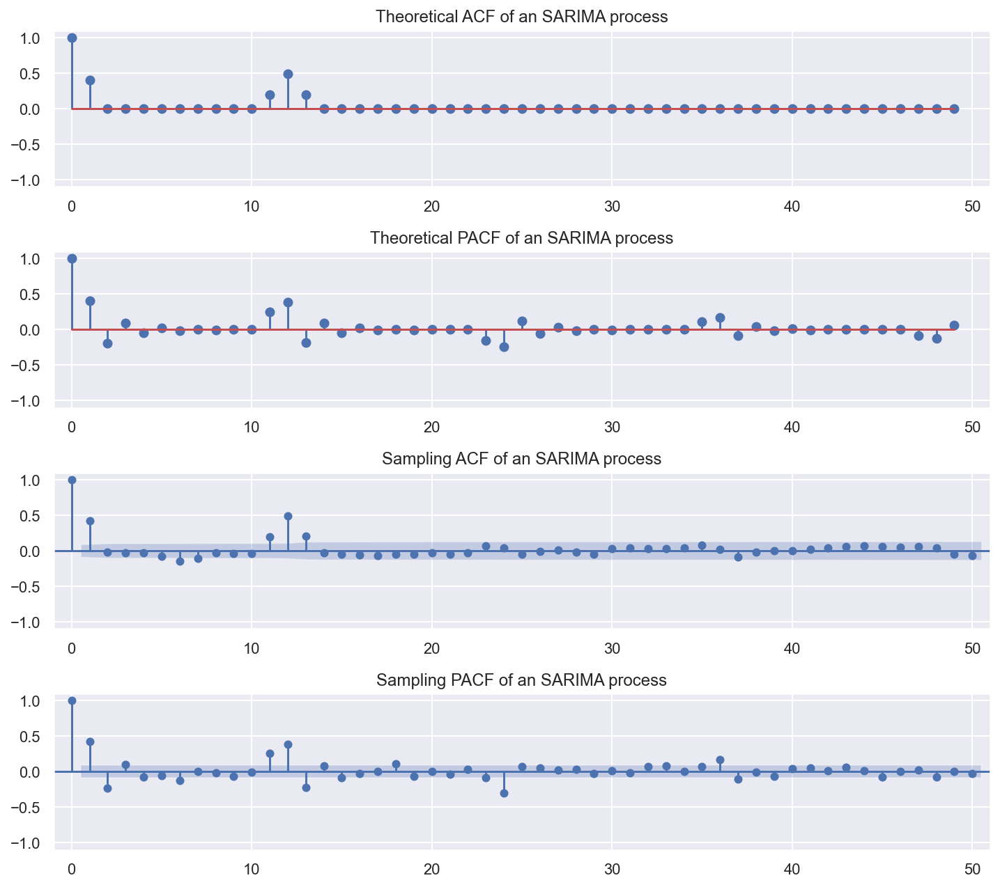

In [78]:
# SARIMA(0,0,1)(0,0,1,12)
plt.figure(figsize=(10, 4))
np.random.seed(123)
phi, Phi = 0, 0
theta, Theta = 0.5, 0.8
ar_params = np.array([])
ma_params = np.array([theta, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, Theta, theta*Theta])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 9))
plt.subplot(411)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical ACF of an SARIMA process")

plt.subplot(412)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical PACF of an SARIMA process")

sm.graphics.tsa.plot_acf(y, lags=50, ax=plt.subplot(413))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling ACF of an SARIMA process")

sm.graphics.tsa.plot_pacf(y, lags=50, ax=plt.subplot(414))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling PACF of an SARIMA process")
plt.tight_layout()
plt.show()

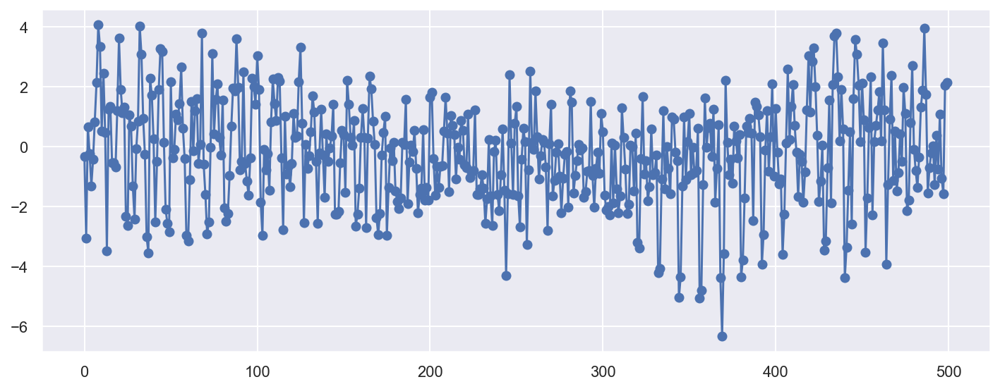

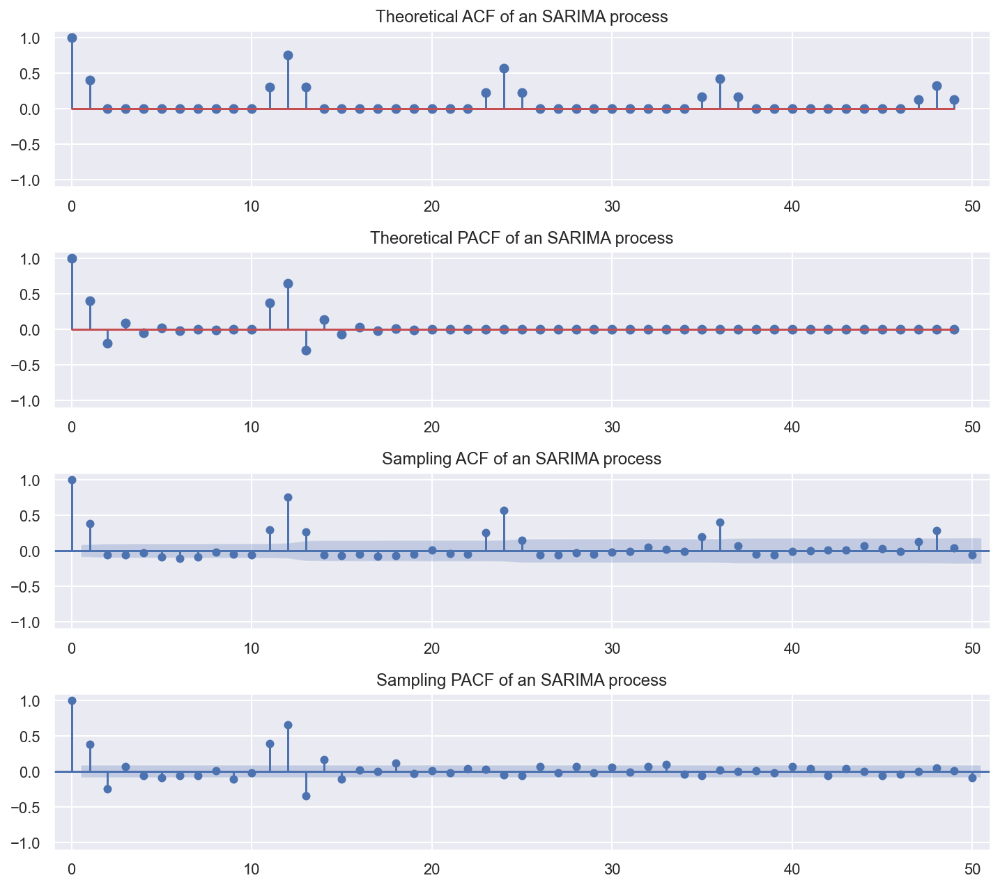

In [79]:
# SARIMA(0,0,1)(1,0,0,12)
plt.figure(figsize=(10, 4))
np.random.seed(123)
phi, Phi = 0, 0.75
theta, Theta = 0.5, 0
ar_params = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, Phi])
ma_params = np.array([theta])
ar, ma = np.r_[1, -ar_params], np.r_[1, ma_params]
y = sm.tsa.ArmaProcess(ar, ma).generate_sample(500, burnin=50)
plt.plot(y, 'o-')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 9))
plt.subplot(411)
plt.stem(sm.tsa.ArmaProcess(ar, ma).acf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical ACF of an SARIMA process")

plt.subplot(412)
plt.stem(sm.tsa.ArmaProcess(ar, ma).pacf(lags=50))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Theoretical PACF of an SARIMA process")

sm.graphics.tsa.plot_acf(y, lags=50, ax=plt.subplot(413))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling ACF of an SARIMA process")

sm.graphics.tsa.plot_pacf(y, lags=50, ax=plt.subplot(414))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title("Sampling PACF of an SARIMA process")
plt.tight_layout()
plt.show()

## SARIMAX 실습

### 실습: 호흡기질환 사망자수 SARIMA 모델링

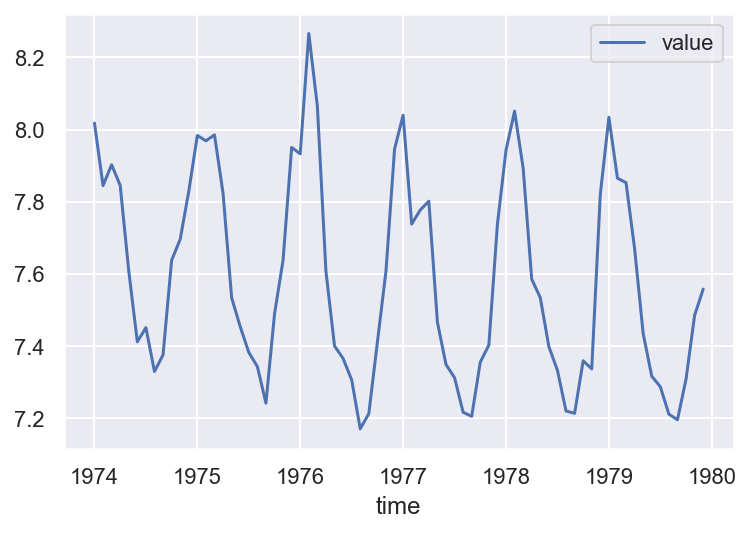

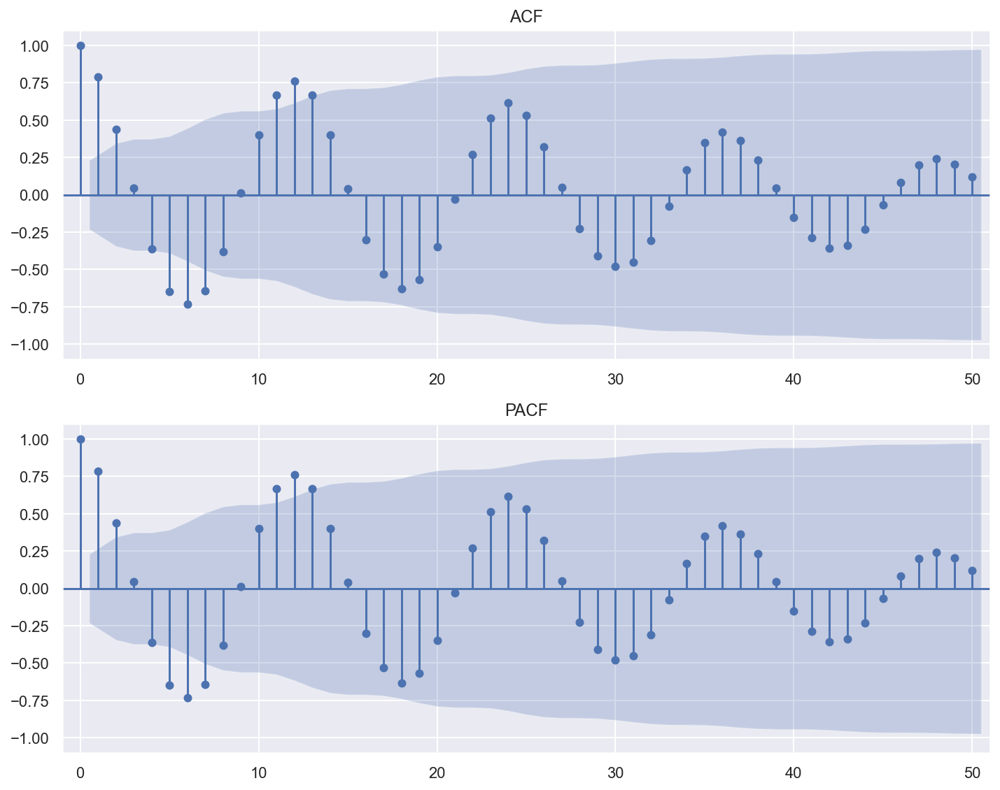

In [80]:
data = sm.datasets.get_rdataset('deaths', 'MASS')
raw= data.data
raw.value = np.log(raw.value)
raw.plot(x='time', y='value')
plt.show()

plt.figure(figsize=(10,8))
sm.graphics.tsa.plot_acf(raw.value.values, lags=50, ax=plt.subplot(211))
plt.xlim(-1,51)
plt.ylim(-1.1,1.1)
plt.title('ACF')

sm.graphics.tsa.plot_acf(raw.value.values, lags=50, ax=plt.subplot(212))
plt.xlim(-1, 51)
plt.ylim(-1.1, 1.1)
plt.title('PACF')
plt.tight_layout()
plt.show()

#### ARMA(1,1) 모델링

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                   72
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  31.982
Date:                Wed, 23 Jun 2021   AIC                            -55.965
Time:                        17:10:23   BIC                            -46.858
Sample:                             0   HQIC                           -52.339
                                 - 72                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.4194      0.765      3.161      0.002       0.919       3.920
ar.L1          0.6818      0.100      6.846      0.000       0.487       0.877
ma.L1          0.4668      0.116      4.027      0.000       0.240       0.694
sigma2         0.0236      0.004      5.416      0.000       0.015       0.032
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):                12.13
Prob(Q):                              0.75   Prob(JB):                         0.00
Heteroskedasticity (H):               1.00   Skew:                             0.94
Prob(H) (two-sided):                  0.99   Kurtosis:                         3.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

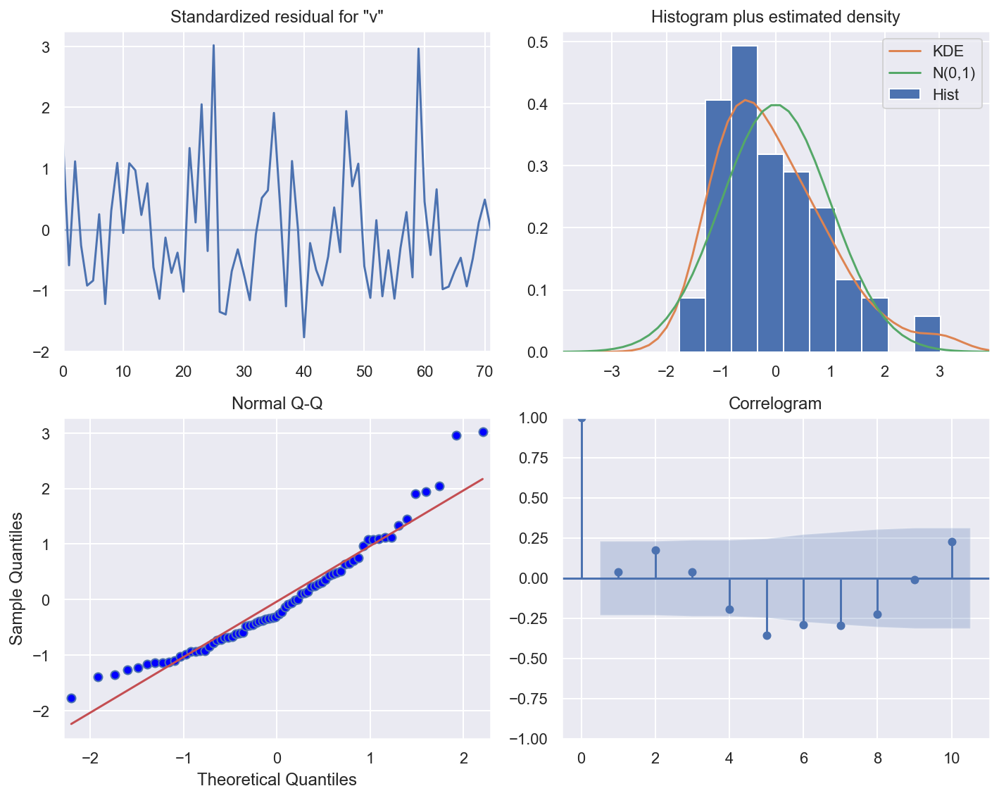

In [81]:
fit = sm.tsa.SARIMAX(raw.value, trend='c', order=(1,0,1), seasonal_order=(0,0,0,0)).fit()
display(fit.summary())


#잔차진단
fit.plot_diagnostics(figsize=(10,8))
plt.tight_layout()
plt.show()

#### SARIMA( (1,0,1), (1,1,1,12) )

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              value   No. Observations:                   72
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 12)   Log Likelihood                  52.592
Date:                            Wed, 23 Jun 2021   AIC                            -93.183
Time:                                    17:10:49   BIC                            -80.617
Sample:                                         0   HQIC                           -88.268
                                             - 72                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0481      0.022     -2.208      0.027      -0.091      -0.005
ar.L1         -0.1547      0.436     -0.355      0.723      -1.009       0.700
ma.L1          0.5695      0.273      2.083      0.037       0.034       1.105
ar.S.L12      -0.2859      0.203     -1.405      0.160      -0.685       0.113
ma.S.L12      -0.9649      4.062     -0.238      0.812      -8.926       6.997
sigma2         0.0066      0.026      0.254      0.799      -0.044       0.057
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                74.10
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):               0.64   Skew:                             0.99
Prob(H) (two-sided):                  0.32   Kurtosis:                         8.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

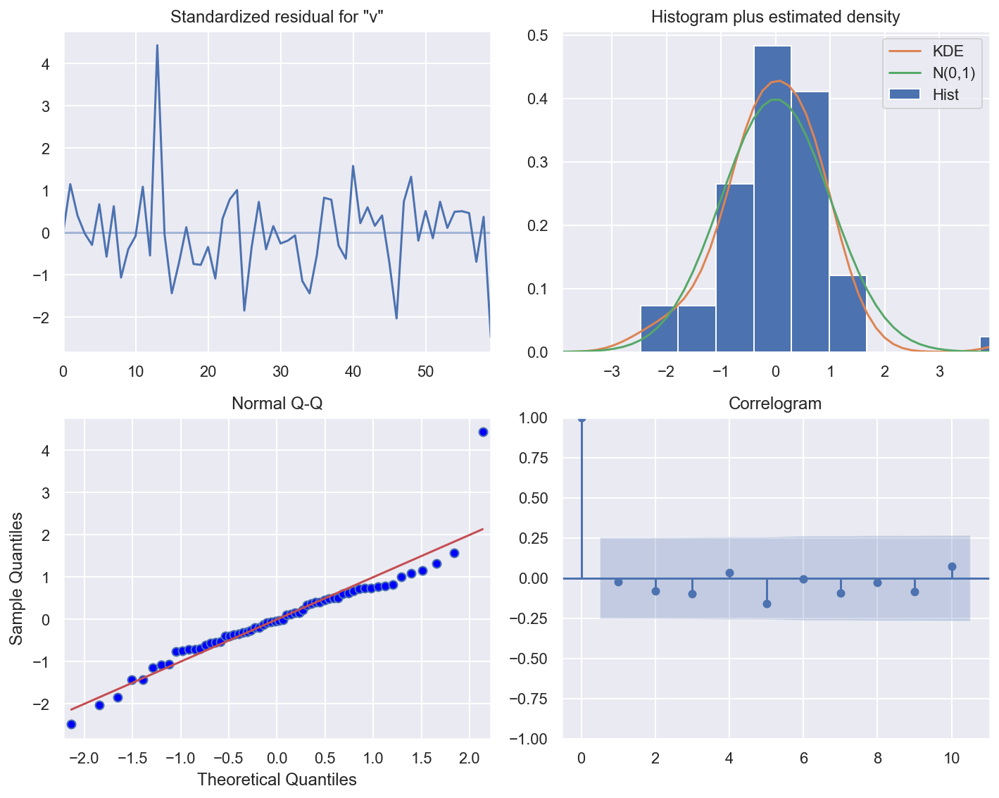

In [82]:
fit = sm.tsa.SARIMAX(raw.value, trend='c', order=(1,0,1), seasonal_order=(1,1,1,12)).fit()
display(fit.summary())

fit.plot_diagnostics(figsize=(10,8))
plt.tight_layout()
plt.show()

###  실습: 항공사 승객수요 SARIMA 모델링

In [83]:
data = sm.datasets.get_rdataset('AirPassengers')
raw= data.data.copy()

raw.index = pd.date_range(start='1/1/1949', periods=len(raw['time']), freq='M')
del raw['time']

raw

,value
1949-01-31,112
1949-02-28,118
1949-03-31,132
1949-04-30,129
1949-05-31,121
...,...
1960-08-31,606
1960-09-30,508
1960-10-31,461
1960-11-30,390


#### 정상성확보

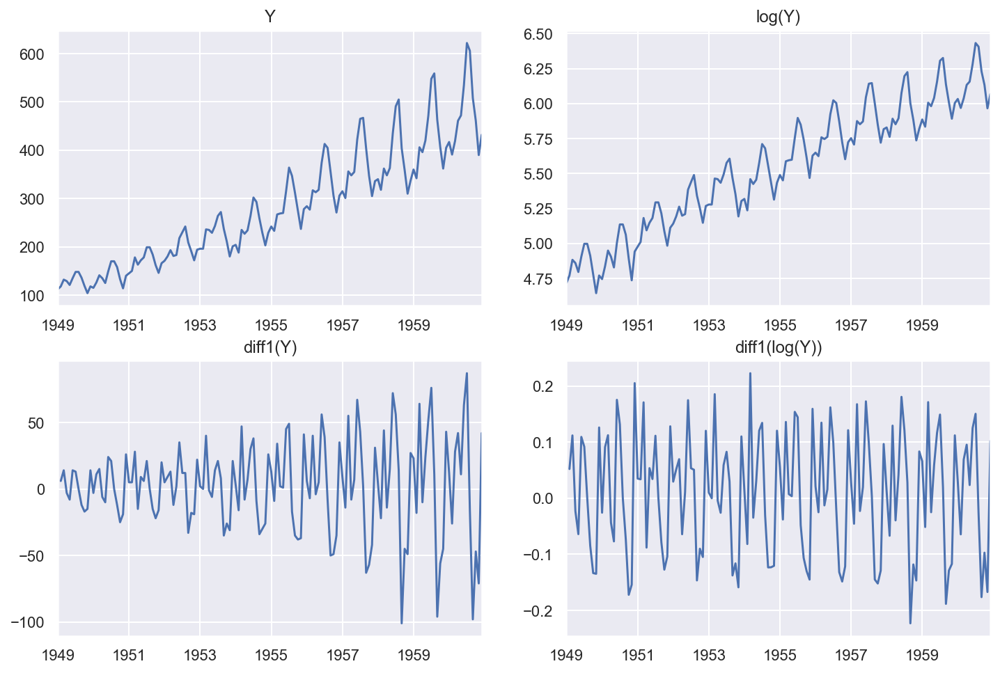

In [84]:
plt.figure(figsize=(12,8))
raw.plot(ax=plt.subplot(221), title='Y', legend=False)
np.log(raw).plot(ax=plt.subplot(222), title='log(Y)', legend=False)
raw.diff(1).plot(ax=plt.subplot(223), title='diff1(Y)', legend=False)
np.log(raw).diff(1).plot(ax=plt.subplot(224), title='diff1(log(Y))', legend=False)
plt.show()

#### ARIMA로 log 효과 비교

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  144
Model:               SARIMAX(1, 1, 1)   Log Likelihood                -694.060
Date:                Wed, 23 Jun 2021   AIC                           1396.121
Time:                        17:11:14   BIC                           1407.972
Sample:                    01-31-1949   HQIC                          1400.937
                         - 12-31-1960                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      3.6187      5.001      0.724      0.469      -6.183      13.421
ar.L1         -0.4768      0.128     -3.736      0.000      -0.727      -0.227
ma.L1          0.8646      0.080     10.746      0.000       0.707       1.022
sigma2       958.4116    107.040      8.954      0.000     748.616    1168.207
===================================================================================
Ljung-Box (L1) (Q):                   0.22   Jarque-Bera (JB):                 2.17
Prob(Q):                              0.64   Prob(JB):                         0.34
Heteroskedasticity (H):               7.01   Skew:                            -0.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

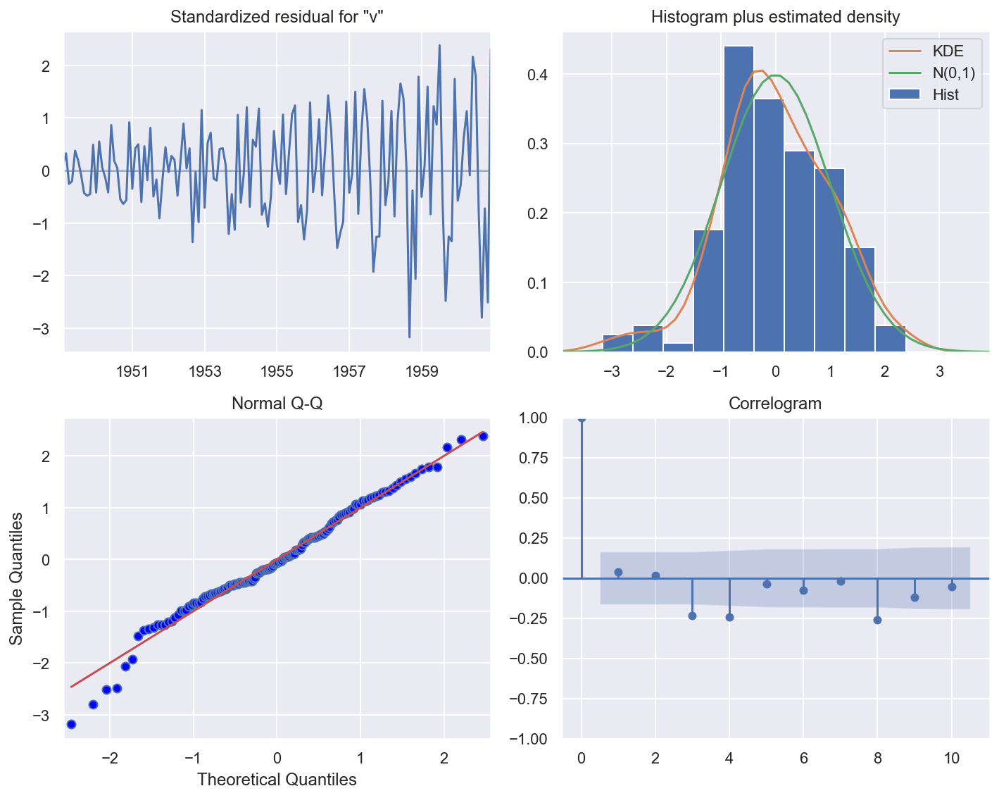

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  144
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 124.804
Date:                Wed, 23 Jun 2021   AIC                           -241.608
Time:                        17:11:15   BIC                           -229.756
Sample:                    01-31-1949   HQIC                          -236.792
                         - 12-31-1960                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0155      0.016      0.963      0.336      -0.016       0.047
ar.L1         -0.5826      0.170     -3.429      0.001      -0.915      -0.250
ma.L1          0.8502      0.101      8.453      0.000       0.653       1.047
sigma2         0.0102      0.002      5.871      0.000       0.007       0.014
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 5.93
Prob(Q):                              0.87   Prob(JB):                         0.05
Heteroskedasticity (H):               1.07   Skew:                             0.04
Prob(H) (two-sided):                  0.81   Kurtosis:                         2.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

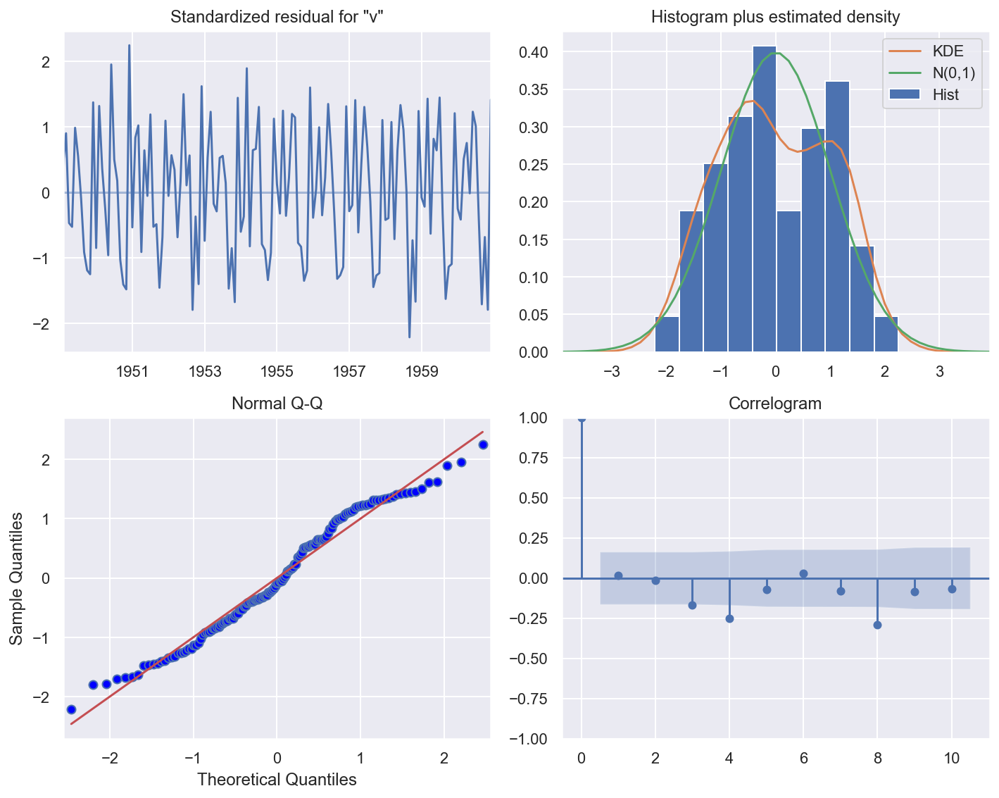

In [85]:
fit = sm.tsa.SARIMAX(raw.value, trend='c', order=(1,1,1)).fit()
display(fit.summary())

fit.plot_diagnostics(figsize=(10,8))
plt.tight_layout()
plt.show()


fit = sm.tsa.SARIMAX(np.log(raw.value), trend='c', order=(1,1,1)).fit()
display(fit.summary())

fit.plot_diagnostics(figsize=(10,8))
plt.tight_layout()
plt.show()

#### SARIMA 모델링 -> 로그

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              value   No. Observations:                  144
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                 244.457
Date:                            Wed, 23 Jun 2021   AIC                           -476.914
Time:                                    17:11:25   BIC                           -459.662
Sample:                                01-31-1949   HQIC                          -469.904
                                     - 12-31-1960                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0002      0.001     -0.153      0.878      -0.003       0.003
ar.L1         -0.1609      0.243     -0.661      0.509      -0.638       0.316
ma.L1         -0.2116      0.247     -0.857      0.392      -0.696       0.272
ar.S.L12      -0.0684      0.186     -0.367      0.713      -0.434       0.297
ma.S.L12      -0.5247      0.207     -2.538      0.011      -0.930      -0.120
sigma2         0.0013      0.000      8.745      0.000       0.001       0.002
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 1.24
Prob(Q):                              0.94   Prob(JB):                         0.54
Heteroskedasticity (H):               0.58   Skew:                             0.03
Prob(H) (two-sided):                  0.07   Kurtosis:                         3.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

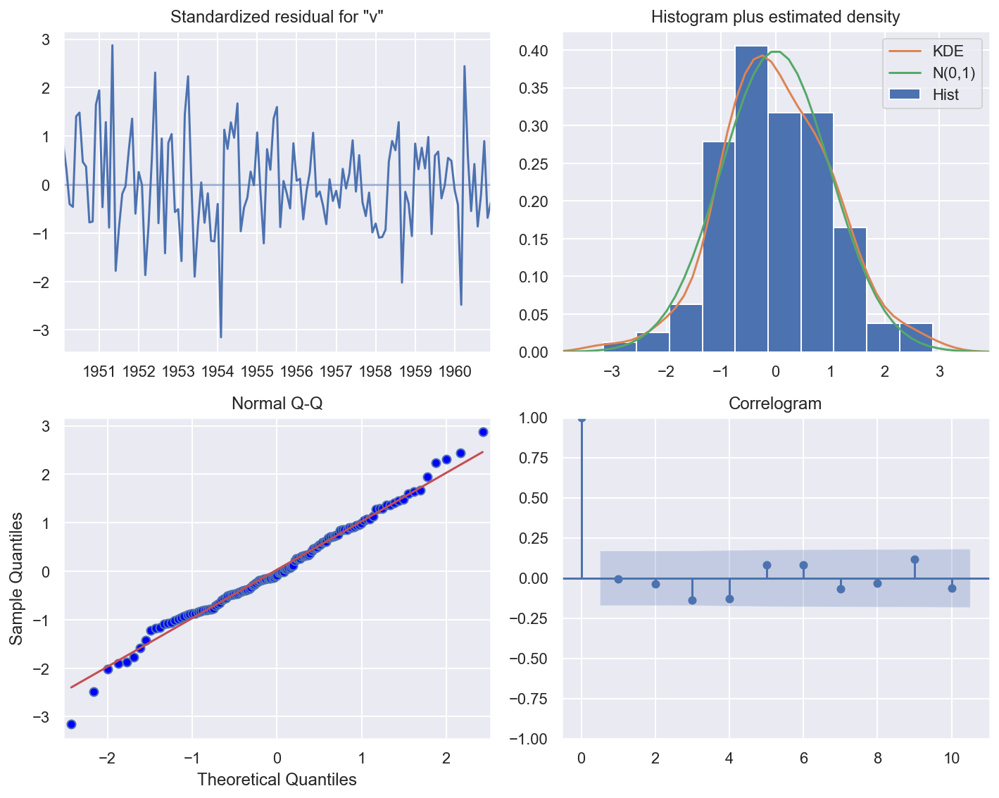

In [86]:
fit = sm.tsa.SARIMAX(np.log(raw.value), order=(1,1,1), trend='c', seasonal_order=(1,1,1,12)).fit()
display(fit.summary())

fit.plot_diagnostics(figsize=(10,8))
plt.tight_layout()
plt.show()

# 분석싸이클 자동화

- **자동화 과정:** 일반화 분석싸이클의 2~4단계만 자동화

> **1. KPSS 검정통계량을 사용한 독립변수($Y_t$)의 적분차수/차분차수 결정($0 \leq d \leq 2$)**  

> **2. 차분된 독립변수 $(1 - L)^d Y_t$에 $AIC$를 줄여가며 초기모형 후보들 적합을 통한 Base모형의 차수 $p$와 $q$를 선택**  
> - 만약 $d \leq 1$, 초기모형 후보 5종
    - ARIMA(0,d,0) without constant
    - ARIMA(0,d,0) with constant
    - ARIMA(0,d,1) with constant
    - ARIMA(1,d,0) with constant
    - ARIMA(2,d,2) with constant  
> - 만약 $d = 2$, 초기모형 후보 4종
    - ARIMA(0,d,0) without constant
    - ARIMA(0,d,1) without constant
    - ARIMA(1,d,0) without constant
    - ARIMA(2,d,2) without constant    
      
> **3. Base모형의 파라미터 튜닝을 통한 Agile모형 선택**  
1) Base모형에서 $p$와 $q$를 $\pm 1$ 변화시키며 AIC들을 추정  
2) $p$와 $q$ 변경 및 상수항(Constant) 반영/미반영하며 AIC들을 추정  
3) 최적의 Agile모형 선택  

> **4. 최종 모형 선택**  
1) 추정된 Agile모형을 Base모형으로 변경  
2) AIC가 더이상 줄어들지 않을 때까지 3번의 과정을 반복하여 Agile모형 재추정  
3) 최종 Agile모형이 최종 선택된 시계열모형 

## 항공사 승객수요-Auto Arima 모델링

In [87]:
from module_hobin import stationarity_adf_test, stationarity_kpss_test
from datetime import datetime
warnings.simplefilter('ignore')

<AxesSubplot:>

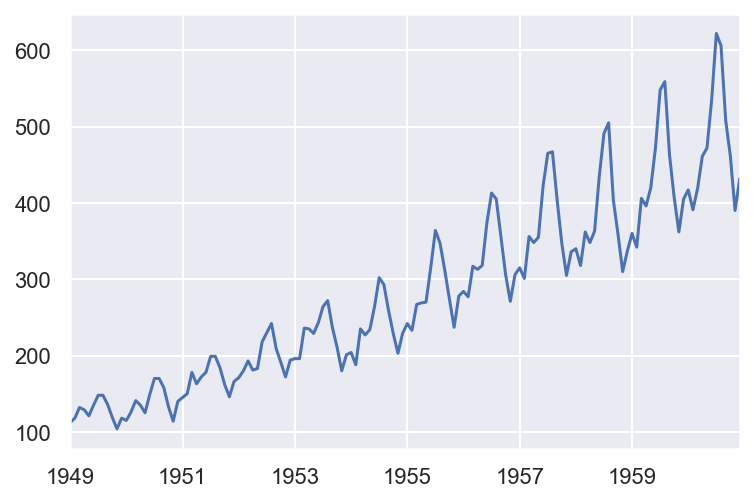

In [88]:
raw = sm.datasets.get_rdataset('AirPassengers')
raw = raw.data.copy()
raw.index = pd.date_range(start=datetime(1949,1,1), periods=len(raw['time']), freq='M')
raw.drop('time', axis=1, inplace=True)
raw.value.plot()

### 정상성

#### 정상성 테스트 (미변환)

ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.


,Stationarity_adf
Test Statistics,0.82
p-value,0.99
Used Lag,13.00
Used Observations,130.00
Critical Value(1%),-3.48
Maximum Information Criteria,996.69


KPSS:계절성이 어느정도 남아있어 귀무가설(정상)을 기각합니다.


,Stationarity_kpss
Test Statistics,1.05
p-value,0.01
Used Lag,14.00
Critical Value(10%),0.35


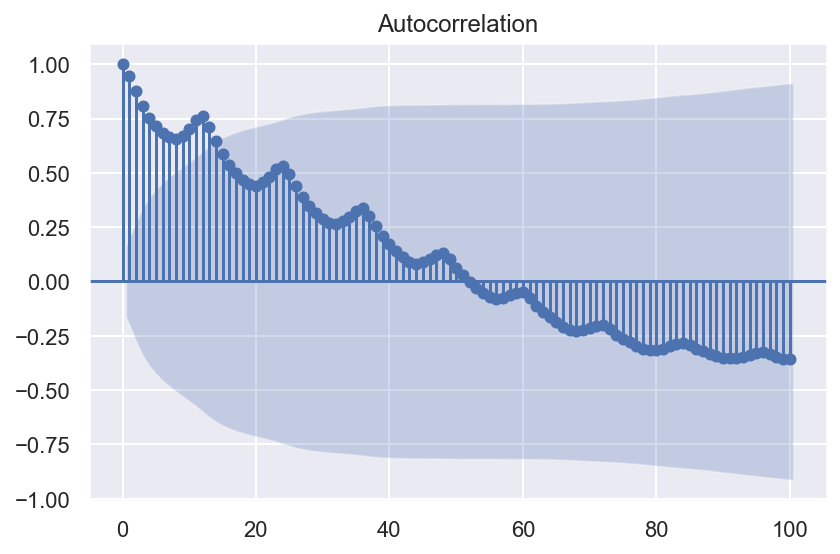

In [89]:
data_none = raw.copy()
display(stationarity_adf_test(data_none.values.flatten(), []))
display(stationarity_kpss_test(data_none.values.flatten(), []))
sm.graphics.tsa.plot_acf(data_none, lags=100, use_vlines=True)
plt.tight_layout()
plt.show()

#### 정상성 테스트 (로그 변환)

ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.


,Stationarity_adf
Test Statistics,-1.72
p-value,0.42
Used Lag,13.00
Used Observations,130.00
Critical Value(1%),-3.48
Maximum Information Criteria,-445.40


KPSS:계절성이 어느정도 남아있어 귀무가설(정상)을 기각합니다.


,Stationarity_kpss
Test Statistics,1.05
p-value,0.01
Used Lag,14.00
Critical Value(10%),0.35


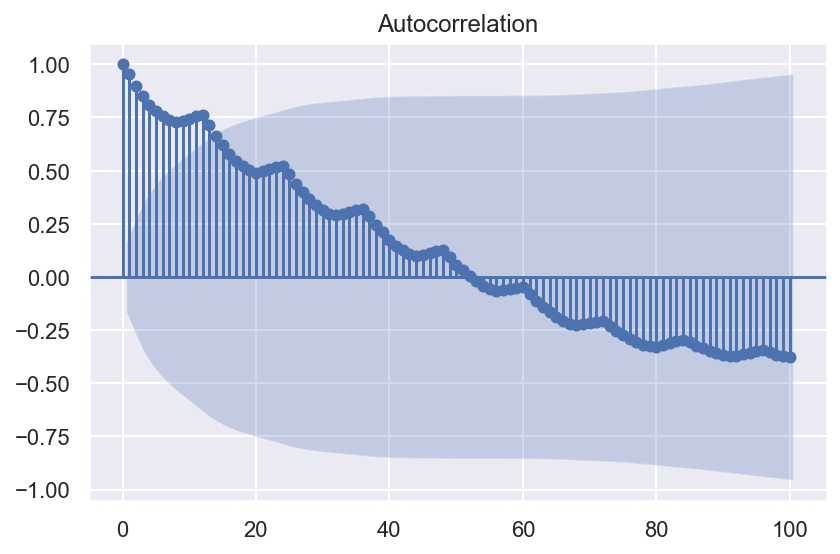

In [90]:
data_trend = np.log(raw).copy()
display(stationarity_adf_test(data_trend.values.flatten(), []))
display(stationarity_kpss_test(data_trend.values.flatten(), []))
sm.graphics.tsa.plot_acf(data_trend, lags=100, use_vlines=True)
plt.tight_layout()
plt.show()

#### 추세 차분 설정

In [91]:
trend_diff_order_initial = 0
result = stationarity_adf_test(data_trend.values.flatten(), []).T
print(result['p-value'])
if result['p-value'].values.flatten() < 0.05:
    trend_diff_order = trend_diff_order_initial 
else:
    trend_diff_order = trend_diff_order_initial + 1
print('Trend Difference :', trend_diff_order)

ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.
Stationarity_adf   0.42
Name: p-value, dtype: float64
Trend Difference : 1


#### 정상성 테스트 (로그+추세차분)

ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.


,Stationarity_adf
Test Statistics,-2.72
p-value,0.07
Used Lag,14.00
Used Observations,128.00
Critical Value(1%),-3.48
Maximum Information Criteria,-440.36


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.10
p-value,0.10
Used Lag,14.00
Critical Value(10%),0.35


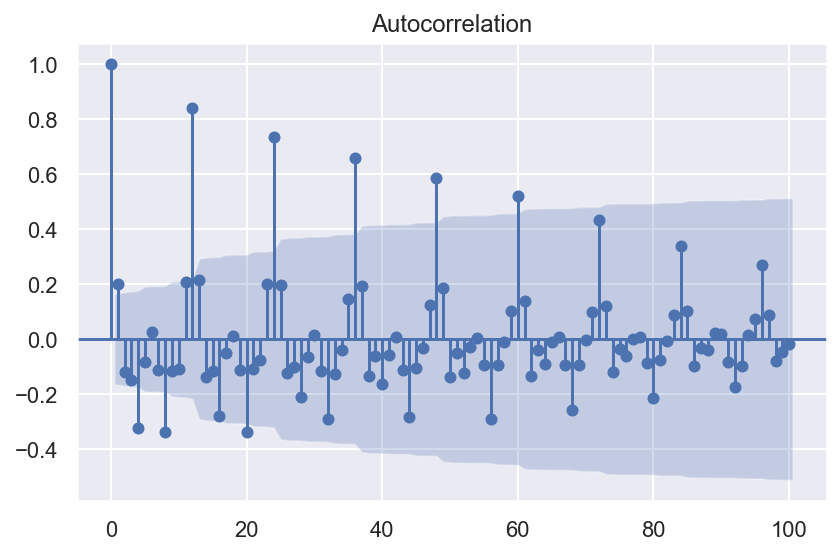

In [92]:
data_seasonal = data_trend.diff(trend_diff_order).dropna().copy()
display(stationarity_adf_test(data_seasonal.values.flatten(), []))
display(stationarity_kpss_test(data_seasonal.values.flatten(), []))
sm.graphics.tsa.plot_acf(data_seasonal, lags=100, use_vlines=True)
plt.tight_layout()
plt.show()

In [93]:
#result = stationarity_adf_test(data_seasonal.values.flatten(), []).T
#print(result['p-value'])
#if result['p-value'].values.flatten() < 0.05:
#    trend_diff_order_second = trend_diff_order
#else:
#    trend_diff_order_second = trend_diff_order + 1
#print('Trend Difference :', trend_diff_order_second)

#data_seasonal = data_trend.diff(trend_diff_order_second).dropna().copy()
#display(stationarity_adf_test(data_seasonal.values.flatten(), []))
#display(stationarity_kpss_test(data_seasonal.values.flatten(), []))
#sm.graphics.tsa.plot_acf(data_seasonal, lags=100, use_vlines=True)
#plt.tight_layout()
#plt.show()

#### 계절 차분

In [94]:
sm.tsa.acf(data_seasonal)[1:].argmax() + 1

12

In [98]:
seasonal_diff_order = sm.tsa.acf(data_seasonal)[1:].argmax() + 1
seasonal_diff_order = np.int(seasonal_diff_order)

#### 정상성 테스트 (로그+추세차분+계절차분)


ADF:추세가 어느정도 남아있어 귀무가설(비정상) 기각 못합니다.


,Stationarity_adf
Test Statistics,-2.72
p-value,0.07
Used Lag,14.00
Used Observations,128.00
Critical Value(1%),-3.48
Maximum Information Criteria,-440.36


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.10
p-value,0.10
Used Lag,14.00
Critical Value(10%),0.35


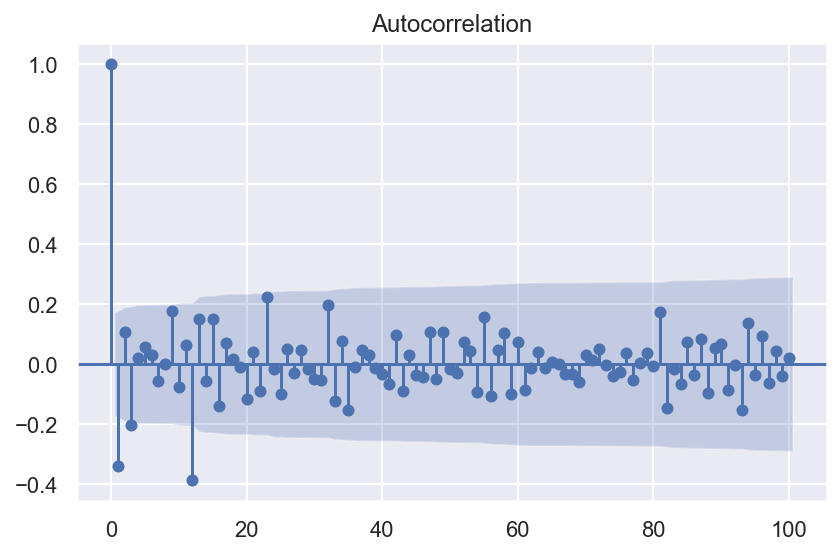

In [99]:
data_final = data_seasonal.diff(seasonal_diff_order).dropna().copy()
display(stationarity_adf_test(data_seasonal.values.flatten(), []))
display(stationarity_kpss_test(data_seasonal.values.flatten(), []))
sm.graphics.tsa.plot_acf(data_final, lags=100, use_vlines=True)
plt.tight_layout()
plt.show()

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.


,Stationarity_adf
Test Statistics,-4.44
p-value,0.00
Used Lag,12.00
Used Observations,118.00
Critical Value(1%),-3.49
Maximum Information Criteria,-415.56


KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_kpss
Test Statistics,0.11
p-value,0.10
Used Lag,13.00
Critical Value(10%),0.35


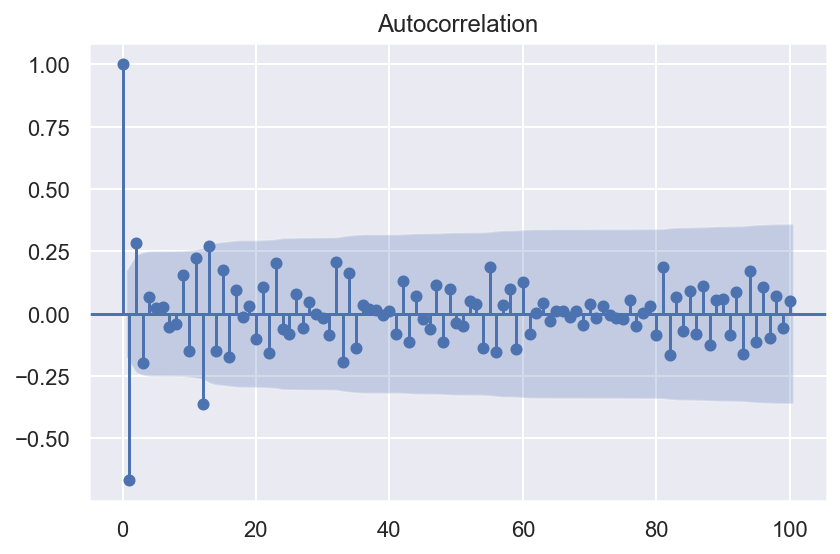

In [100]:
data_final2 = data_final.diff(trend_diff_order).dropna().copy()
display(stationarity_adf_test(data_final.values.flatten(), []))
display(stationarity_kpss_test(data_final.values.flatten(), []))
sm.tsa.graphics.plot_acf(data_final2, lags=100, use_vlines=True)
plt.tight_layout()
plt.show()

### 데이터 분리 및 모수추론

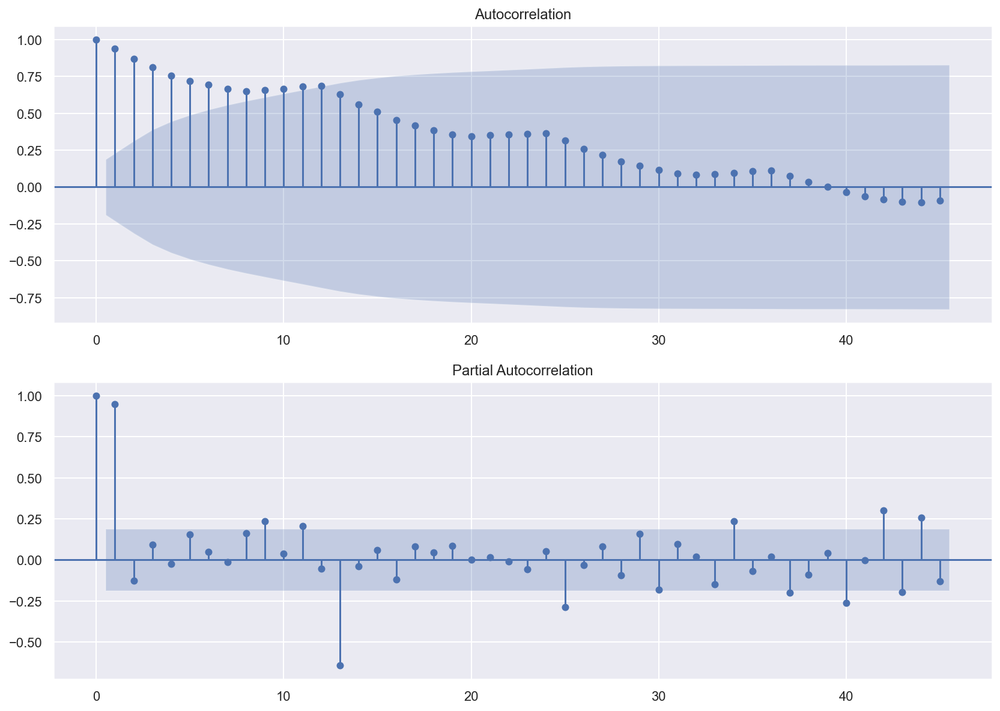

In [101]:
data = data_trend.copy()
split_date = datetime(1958, 1, 1)
Y_train = data[data.index < split_date]
Y_test = data[data.index >= split_date]

plt.figure(figsize=(14,10))
sm.tsa.graphics.plot_acf(Y_train, lags=45, alpha=0.05, use_vlines=True, ax=plt.subplot(211))
sm.tsa.graphics.plot_pacf(Y_train, lags=45, alpha=0.05, use_vlines=True, ax=plt.subplot(212))
plt.show()

### 모델링

In [102]:
model = sm.tsa.SARIMAX(Y_train, order=(1, 1, 0), 
                      seasonal_order=(1,0,1,12), trend='c').fit()
display(model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                value   No. Observations:                  108
Model:             SARIMAX(1, 1, 0)x(1, 0, [1], 12)   Log Likelihood                 184.253
Date:                              Wed, 23 Jun 2021   AIC                           -358.506
Time:                                      17:12:42   BIC                           -345.142
Sample:                                  01-31-1949   HQIC                          -353.089
                                       - 12-31-1957                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0001      0.000      0.330      0.741      -0.001       0.001
ar.L1         -0.2677      0.080     -3.353      0.001      -0.424      -0.111
ar.S.L12       0.9907      0.008    120.890      0.000       0.975       1.007
ma.S.L12      -0.6113      0.114     -5.341      0.000      -0.836      -0.387
sigma2         0.0014      0.000      7.243      0.000       0.001       0.002
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 0.23
Prob(Q):                              0.93   Prob(JB):                         0.89
Heteroskedasticity (H):               0.39   Skew:                             0.09
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<AxesSubplot:>

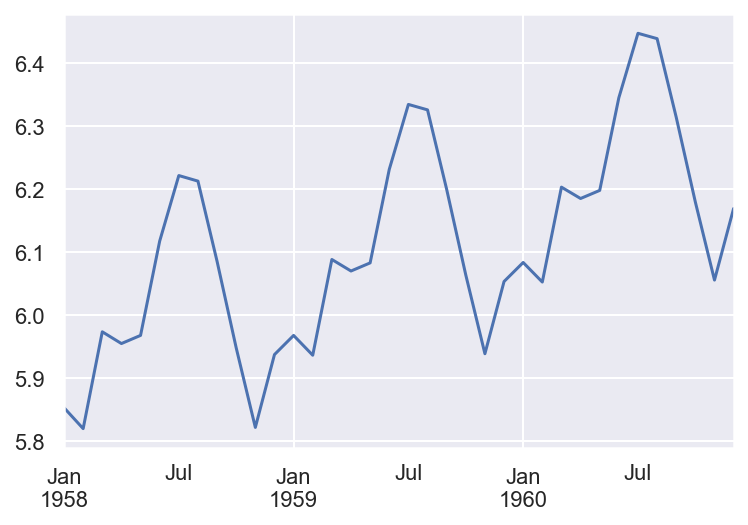

In [103]:
pred_tr = model.predict()
pred_tr.name = 'prediction'
pred_te = model.get_forecast(len(Y_test)).predicted_mean
pred_te.name = 'prediction'
pred_te_ci = model.get_forecast(len(Y_test)).conf_int()
pred_te.plot()

### 비정상성으로 변환

<AxesSubplot:>

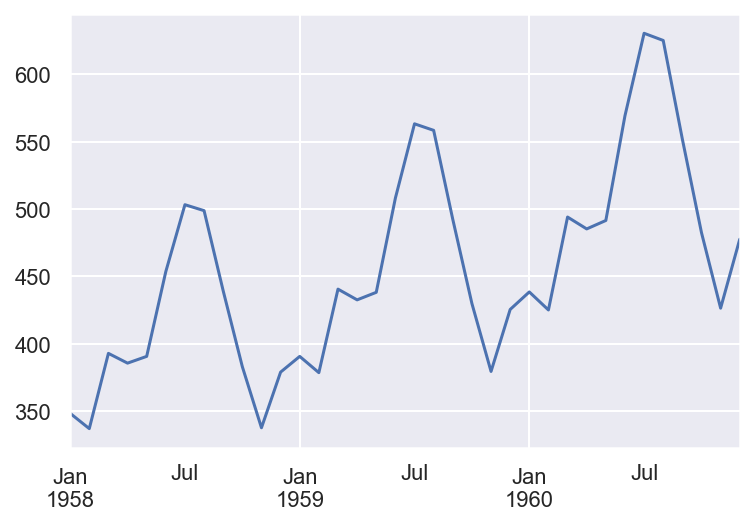

In [104]:
Y_train = np.exp(Y_train).copy()
Y_test = np.exp(Y_test).copy()
pred_tr = np.exp(pred_tr).copy()
pred_te = np.exp(pred_te).copy()
pred_te_ci = np.exp(pred_te_ci).copy()

pred_te.plot()

In [105]:
#pred_tr = np.cumsum(pred_tr).copy()
#pred_te = np.cumsum(pred_te).copy()

### 잔차진단 및 결과

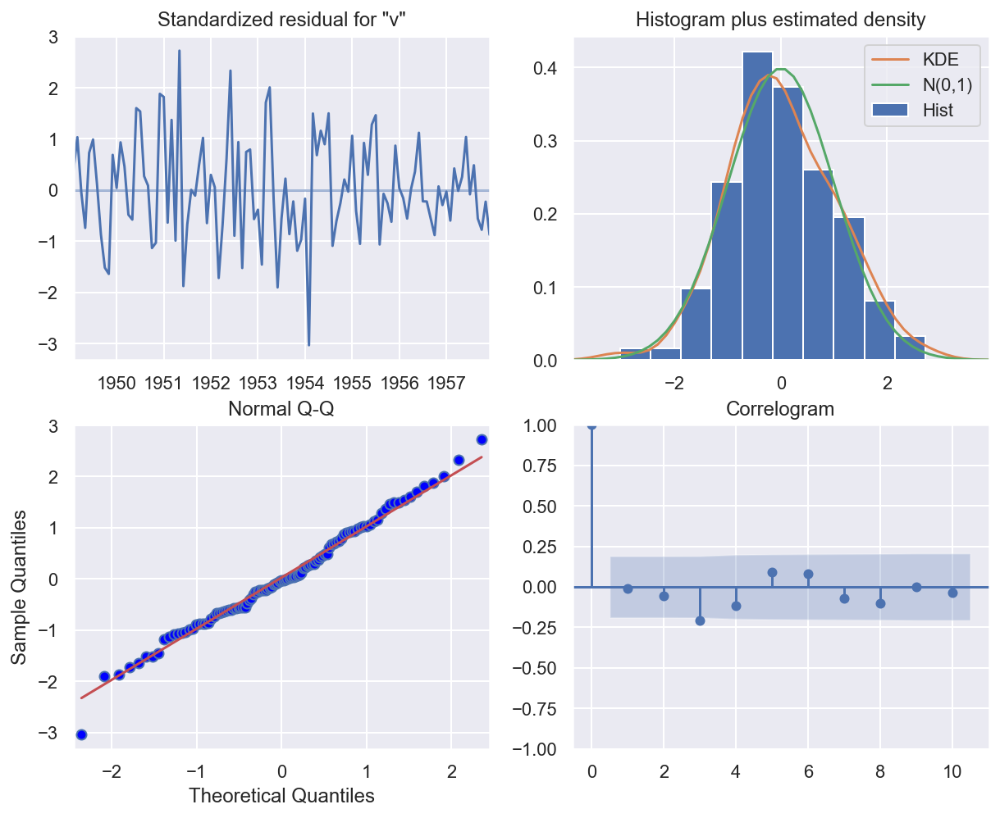

In [106]:
model.plot_diagnostics(figsize=(10,8))
plt.show()

In [107]:
from module_hobin import *

,MAE,MSE,MAPE
Train,8.27,197.76,4.53
Test,26.96,911.01,6.63


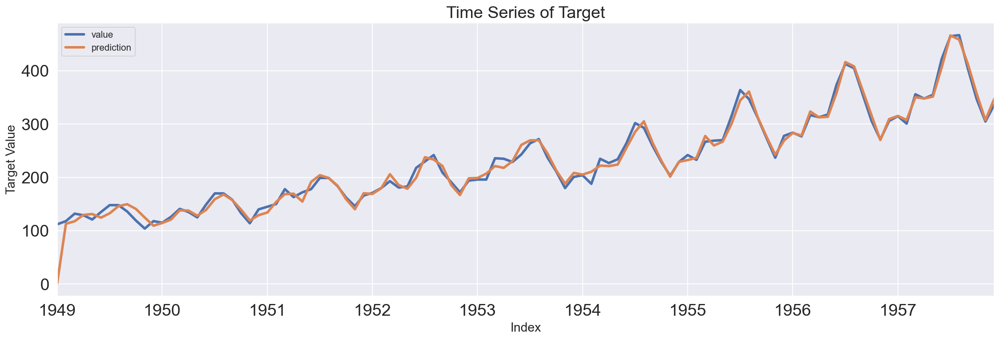

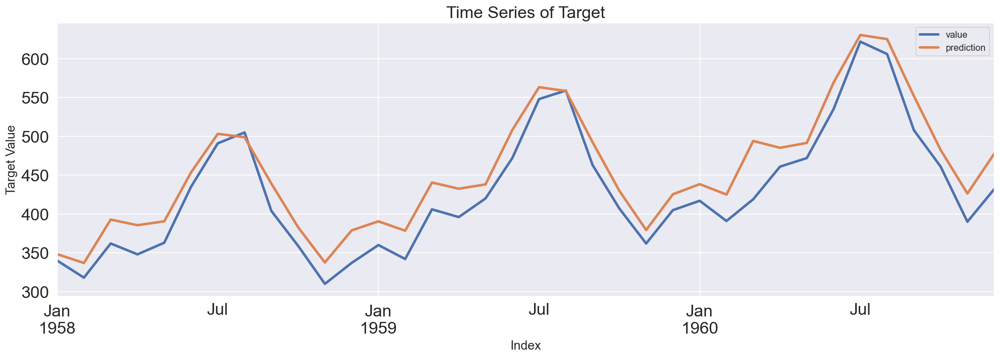

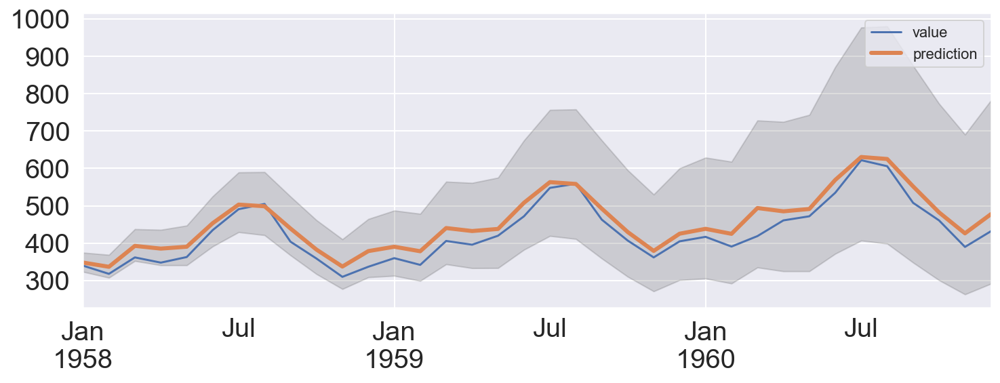

In [108]:
Score_ts_sarimax, Resid_tr_ts_sarimax, Resid_te_ts_sarimax =\
                            evaluation_trte(Y_train, pred_tr, Y_test, pred_te, graph_on=True)
display(Score_ts_sarimax)

ax = pd.DataFrame(Y_test).plot(figsize=(12,4))
pd.DataFrame(pred_te, index=Y_test.index,).plot(kind='line',
                      xlim=(Y_test.index.min(),Y_test.index.max()),
                      linewidth=3, fontsize=20, ax=ax)

ax.fill_between(pd.DataFrame(pred_te_ci, index=Y_test.index).index,
                pd.DataFrame(pred_te_ci, index=Y_test.index).iloc[:,0],
                pd.DataFrame(pred_te_ci, index=Y_test.index).iloc[:,1], color='k', alpha=0.15)

## Auto_ARIMA로 실습

In [109]:
from pmdarima import auto_arima

In [110]:
seasonal_diff_order

12

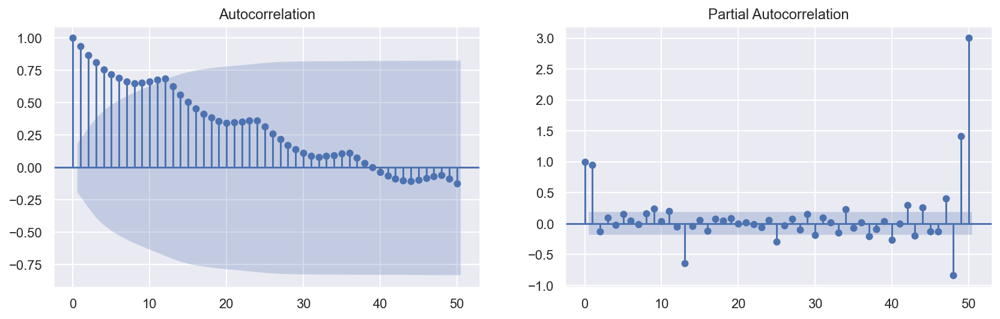

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=-262.724, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=-339.434, Time=0.57 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=-323.753, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=-262.724, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=-321.617, Time=0.30 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=-345.849, Time=1.75 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.31 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=-282.513, Time=1.35 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=-347.761, Time=1.98 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=-343.824, Time=0.77 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=-346.798, Time=1.95 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(2,0,1)(2,1,0)[12] intercept   : AIC=-345.856, Time=2.09 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  108
Model:             SARIMAX(2, 0, 0)x(2, 1, 0, 12)   Log Likelihood                 179.880
Date:                            Wed, 23 Jun 2021   AIC                           -347.761
Time:                                    17:13:51   BIC                           -332.375
Sample:                                         0   HQIC                          -341.542
                                            - 108                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0538      0.025      2.114      0.035       0.004       0.104
ar.L1          0.5662      0.104      5.432      0.000       0.362       0.771
ar.L2          0.2108      0.099      2.132      0.033       0.017       0.405
ar.S.L12      -0.5561      0.119     -4.673      0.000      -0.789      -0.323
ar.S.L24      -0.2630      0.141     -1.871      0.061      -0.538       0.012
sigma2         0.0013      0.000      6.963      0.000       0.001       0.002
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 7.19
Prob(Q):                              0.87   Prob(JB):                         0.03
Heteroskedasticity (H):               0.28   Skew:                             0.16
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

,MAE,MSE,MAPE
Train,19.53,"1,829.43",13.52
Test,53.89,"3,289.21",12.59


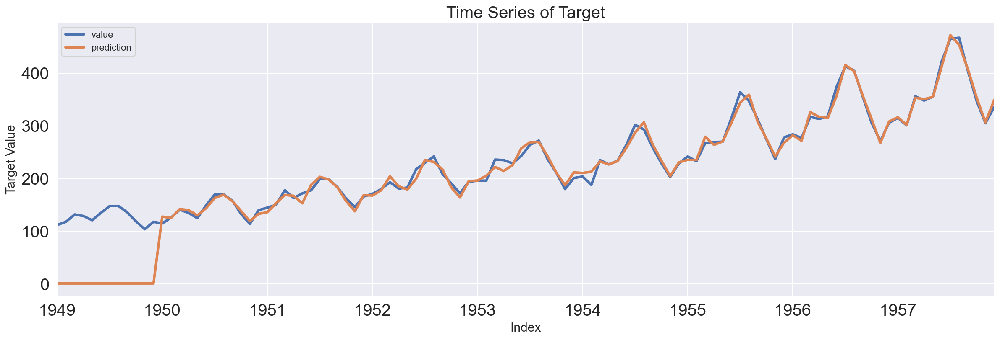

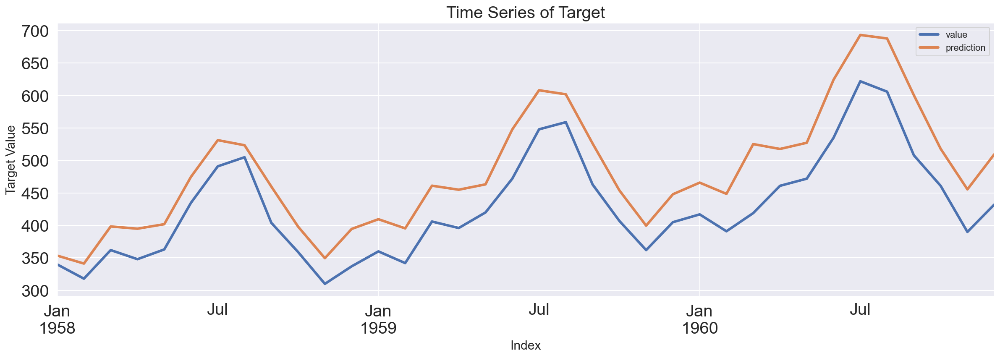

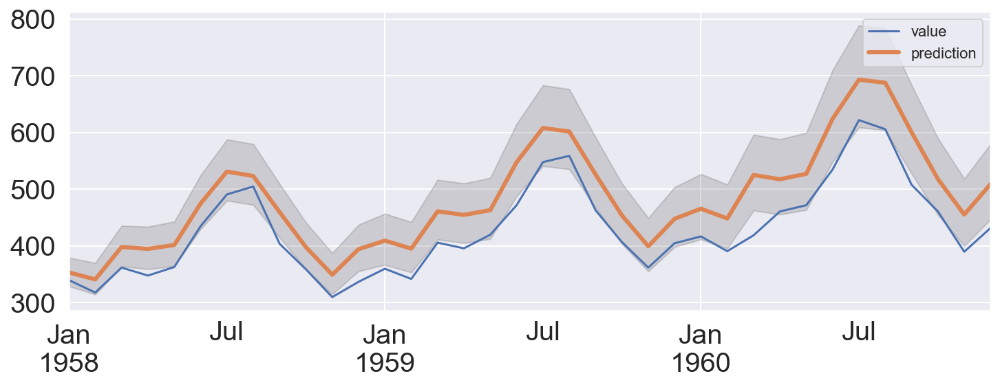

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

ADF:추세가 어느정도 제거되어 귀무가설(비정상)을 기각합니다.
KPSS:계절성이 어느정도 제거되어 귀무가설(정상) 기각 못합니다.


,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-2.88,0.42,0.56,86.39,303.60,355.94,362.00,0.02
p-value,0.05,0.07,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,0.00,13.00,NaN,NaN,NaN,NaN,NaN,NaN
Used Observations,107.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(1%),-3.49,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Maximum Information Criteria,665.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(10%),NaN,0.35,NaN,NaN,NaN,NaN,NaN,NaN
Alternative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,two-sided


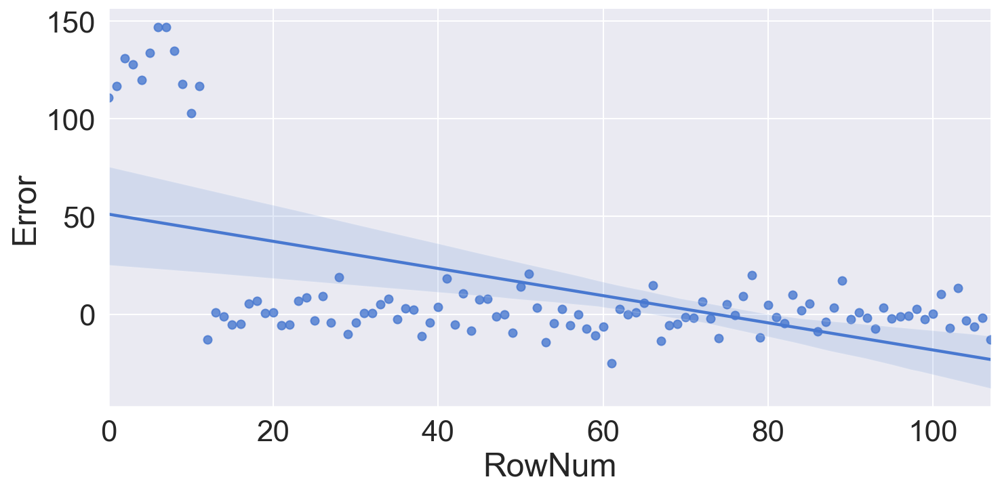

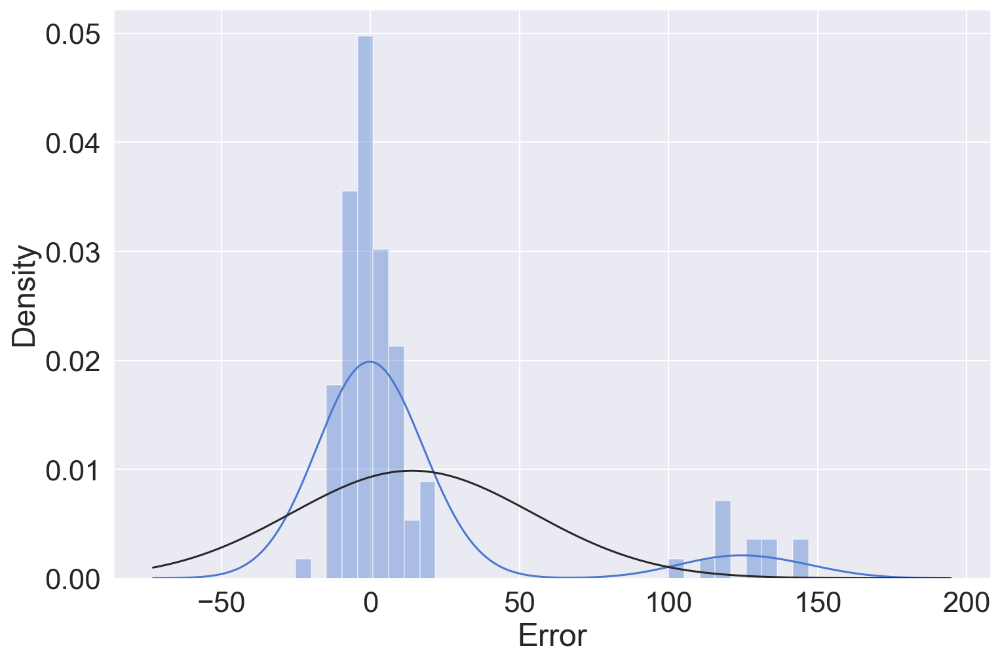

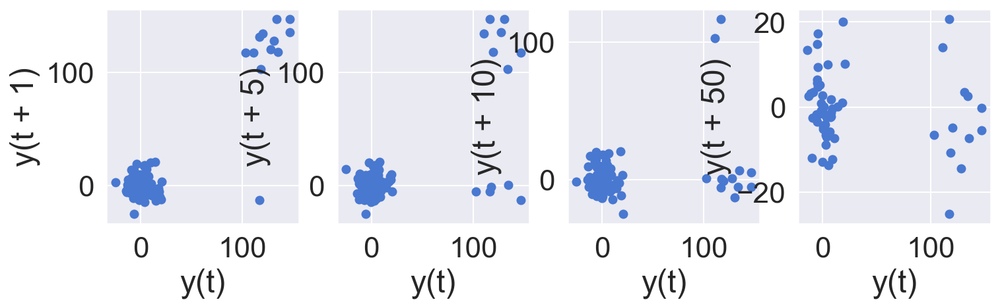

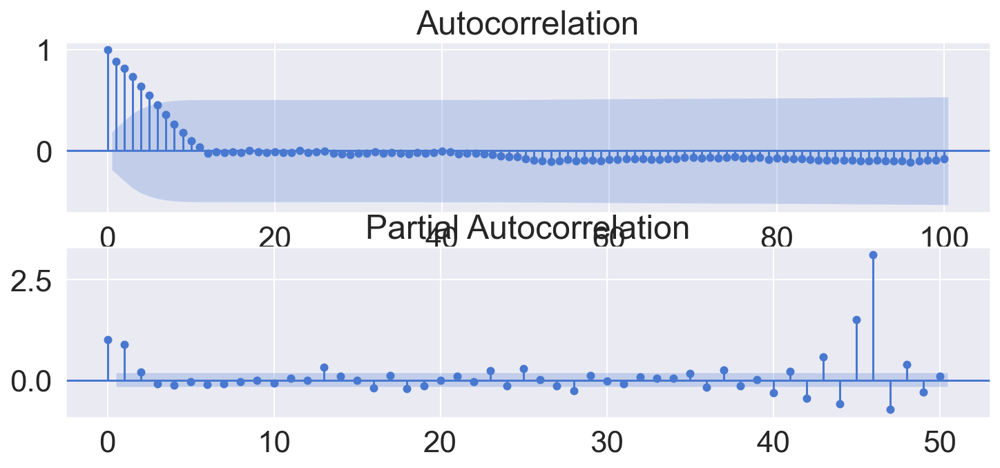

In [111]:
## 최종 타겟 선정 및 Train/Test 데이터 분리
data = data_trend.copy()
split_date = '1958-01-01'
Y_train = data[data.index < split_date]
Y_test = data[data.index >= split_date]

## 시각화 및 모수추론(p=1, q=0, d=1, P=1, Q=1, D(m)=12)
plt.figure(figsize=(14,4))
sm.tsa.graphics.plot_acf(Y_train, lags=50, alpha=0.05, use_vlines=True, ax=plt.subplot(121))
sm.tsa.graphics.plot_pacf(Y_train, lags=50, alpha=0.05, use_vlines=True, ax=plt.subplot(122))
plt.show()

# 모델링
## Auto-ARIMA
logarithm, differencing = True, False
fit_ts_autoarima = auto_arima(Y_train, stationary=False,
                              trend='c', start_p=0, start_q=0, max_p=2, max_q=2,
                              seasonal=True, start_P=0, start_Q=0, max_P=2, max_Q=2, m=12,
                              stepwise=True, trace=True)
display(fit_ts_autoarima.summary())
pred_tr_ts_autoarima = fit_ts_autoarima.predict_in_sample()
pred_te_ts_autoarima = fit_ts_autoarima.predict(len(Y_test), return_conf_int=True)[0]
pred_te_ts_autoarima_ci = fit_ts_autoarima.predict(len(Y_test), return_conf_int=True)[1]
## 비정상성으로 변환
if logarithm:
    Y_train = np.exp(Y_train).copy()
    Y_test = np.exp(Y_test).copy()
    pred_tr_ts_autoarima = np.exp(pred_tr_ts_autoarima).copy()
    pred_te_ts_autoarima = np.exp(pred_te_ts_autoarima).copy()
    pred_te_ts_autoarima_ci = np.exp(pred_te_ts_autoarima_ci).copy()
if differencing:
    pred_tr_ts_autoarima = np.cumsum(pred_tr_ts_autoarima).copy()
    
# 검증
%reload_ext autoreload
%autoreload 2
from module_hobin import *
Score_ts_autoarima, Resid_tr_ts_autoarima, Resid_te_ts_autoarima = evaluation_trte(Y_train, pred_tr_ts_autoarima, 
                                                                             Y_test, pred_te_ts_autoarima, graph_on=True)
display(Score_ts_autoarima)
ax = pd.DataFrame(Y_test).plot(figsize=(12,4))
pd.DataFrame(pred_te_ts_autoarima, index=Y_test.index, columns=['prediction']).plot(kind='line',
                                                                           xlim=(Y_test.index.min(),Y_test.index.max()),
                                                                           linewidth=3, fontsize=20, ax=ax)
ax.fill_between(pd.DataFrame(pred_te_ts_autoarima_ci, index=Y_test.index).index,
                pd.DataFrame(pred_te_ts_autoarima_ci, index=Y_test.index).iloc[:,0],
                pd.DataFrame(pred_te_ts_autoarima_ci, index=Y_test.index).iloc[:,1], color='k', alpha=0.15)
plt.show()

# 잔차진단
error_analysis(Resid_tr_ts_autoarima, ['Error'], Y_train, graph_on=True)
